In [1]:
import os
import numpy as np
import itertools
from collections import Counter
from scipy.stats import entropy, shapiro, levene, ttest_ind, mannwhitneyu
from scipy.signal import detrend
from statsmodels import robust
import matplotlib.pyplot as plt
import pandas as pd
import scipy.io as sio
import warnings

# Funcion de extracción de señal que grafica la señal original y la señal despues de haberle aplicado la función detrend

Este código está diseñado para cargar, procesar y analizar señales fisiológicas (específicamente relacionadas con la marcha) desde archivos de datos almacenados en formato .ts. Los datos corresponden a distintos grupos de pacientes con enfermedades neurodegenerativas (ALS, Huntington, Parkinson) y sujetos de control. El propósito principal del código es preparar estas señales para su análisis mediante el procesamiento de las señales (incluyendo una técnica de eliminación de tendencia o "detrend") y luego visualizar las señales originales comparadas con las señales procesadas.

In [13]:
def cargar_senal_ts(archivo_ts, aplicar_detrend=True):
    # Cargar el archivo .ts
    datos = np.loadtxt(archivo_ts)

    # Extraer las columnas de interés (1: Tiempo, 2: Izquierdo, 3: Derecho, 4: Balanceo izquierdo, 5: Balanceo derecho)
    señales_interes = datos[:, [0, 1, 2, 3, 4]]  # Tiempo + 4 señales

    # Guardar las señales originales para comparación
    señales_originales = np.copy(señales_interes)

    # Aplicar detrend a las señales de interés (excepto a la columna del tiempo)
    if aplicar_detrend:
        for i in range(1, señales_interes.shape[1]):  # No aplicar detrend a la primera columna (tiempo)
            señales_interes[:, i] = detrend(señales_interes[:, i])
    
    return señales_interes, señales_originales

def cargar_señales_desde_carpetas(ruta_base, aplicar_detrend=True):
    # Diccionario para almacenar las señales organizadas por grupo
    señales_por_grupo = {
        'Amyotrophic Lateral Sclerosis': [],
        'Control': [],
        'Huntington\'s Disease': [],
        'Parkinson\'s Disease': []
    }
    señalesO = {
        'Amyotrophic Lateral Sclerosis': [],
        'Control': [],
        'Huntington\'s Disease': [],
        'Parkinson\'s Disease': []
    }

    # Recorrer las carpetas de los grupos
    for grupo in señales_por_grupo.keys():
        carpeta_grupo = os.path.join(ruta_base, grupo)
        
        # Recorrer cada archivo .ts dentro de la carpeta del grupo
        for archivo in os.listdir(carpeta_grupo):
            if archivo.endswith('.ts'):  # Solo procesar archivos .ts
                ruta_archivo = os.path.join(carpeta_grupo, archivo)
                señales, señalO = cargar_senal_ts(ruta_archivo, aplicar_detrend=aplicar_detrend)
                señales_por_grupo[grupo].append(señales)
                señalesO[grupo].append(señalO)
    
    return señales_por_grupo, señalesO

ruta_base = r'C:\Users\santi\OneDrive\Escritorio\Bioseñales\Proyecto 1\Proyecto 1'
señales_grupos, señales_original = cargar_señales_desde_carpetas(ruta_base, aplicar_detrend=True)
print(señales_grupos.keys())
print(señales_original.keys())

dict_keys(['Amyotrophic Lateral Sclerosis', 'Control', "Huntington's Disease", "Parkinson's Disease"])
dict_keys(['Amyotrophic Lateral Sclerosis', 'Control', "Huntington's Disease", "Parkinson's Disease"])


# Definición de varias funciones como el filtro hampel y la funcion cargar señal modificada brevemente

El objetivo del código es limpiar y mejorar la calidad de las señales de marcha mediante la aplicación de técnicas robustas de filtrado y procesamiento de tendencias. El filtro de Hampel ayuda a manejar el ruido y los valores atípicos en los datos, mientras que el detrend elimina tendencias de largo plazo que podrían sesgar el análisis. Todo esto permite mejorar la precisión del análisis subsecuente de las señales de pacientes con diferentes enfermedades neurodegenerativas y sujetos control, ayudando a identificar patrones característicos de las patologías.

In [15]:
def filtro_hampel(signal, window_size=7, n_sigmas=3):
    # Longitud de la señal
    n = len(signal)
    
    # Copiar la señal original para evitar modificarla directamente
    signal_filtered = signal.copy()
    
    # Aplicar el filtro Hampel a cada punto
    for i in range(window_size, n - window_size):
        # Definir la ventana local
        window = signal[i - window_size:i + window_size + 1]
        # Calcular la mediana y la desviación mediana absoluta (MAD)
        median = np.median(window)
        mad = robust.mad(window)
        
        # Si el valor se desvía más de n_sigmas veces la MAD, reemplazarlo
        if np.abs(signal[i] - median) > n_sigmas * mad:
            signal_filtered[i] = median  # Se puede sustituir por la mediana local

    return signal_filtered

def cargar_senal_ts(archivo_ts, aplicar_detrend=True, aplicar_hampel=True):
    # Cargar el archivo .ts
    datos = np.loadtxt(archivo_ts)

    # Extraer las columnas de interés (1: Tiempo, 2: Izquierdo, 3: Derecho, 4: Balanceo izquierdo, 5: Balanceo derecho)
    señales_interes = datos[:, [0, 1, 2, 3, 4]]

    # Guardar las señales originales para comparación
    señales_originales = np.copy(señales_interes)

    # Aplicar detrend a las señales de interés (excepto la columna de tiempo)
    if aplicar_detrend:
        for i in range(1, señales_interes.shape[1]):  # No aplicar detrend a la columna de tiempo
            señales_interes[:, i] = detrend(señales_interes[:, i])
    
    # Aplicar filtro de Hampel para eliminar los datos atípicos
    if aplicar_hampel:
        for i in range(1, señales_interes.shape[1]):  # No aplicar filtro a la columna de tiempo
            señales_interes[:, i] = filtro_hampel(señales_interes[:, i])

    return señales_interes, señales_originales

def cargar_señales_desde_carpetas(ruta_base, aplicar_detrend=True, aplicar_hampel=True):
    # Diccionario para almacenar las señales organizadas por grupo
    señales_por_grupo = {
        'Amyotrophic Lateral Sclerosis': [],
        'Control': [],
        'Huntington\'s Disease': [],
        'Parkinson\'s Disease': []
    }
    señalesO = {
        'Amyotrophic Lateral Sclerosis': [],
        'Control': [],
        'Huntington\'s Disease': [],
        'Parkinson\'s Disease': []
    }

    # Recorrer las carpetas de los grupos
    for grupo in señales_por_grupo.keys():
        carpeta_grupo = os.path.join(ruta_base, grupo)
        
        # Recorrer cada archivo .ts dentro de la carpeta del grupo
        for archivo in os.listdir(carpeta_grupo):
            if archivo.endswith('.ts'):  # Solo procesar archivos .ts
                ruta_archivo = os.path.join(carpeta_grupo, archivo)
                señales, señalO = cargar_senal_ts(ruta_archivo, aplicar_detrend=aplicar_detrend, aplicar_hampel=aplicar_hampel)
                señales_por_grupo[grupo].append(señales)
                señalesO[grupo].append(señalO)
    
    return señales_por_grupo, señalesO

ruta_base = r'C:\Users\santi\OneDrive\Escritorio\Bioseñales\Proyecto 1\Proyecto 1'
señales_grupos, señales_original = cargar_señales_desde_carpetas(ruta_base, aplicar_detrend=True, aplicar_hampel=True)

# Se definen funciones para comparar las señales de los sujetos control con cada una de las muestras con los sujetos con enfermedades neurodegenerativas

El objetivo del código es permitir un análisis comparativo entre las señales fisiológicas de diferentes grupos. Al comparar las señales de marcha de pacientes con enfermedades neurodegenerativas con las de sujetos sanos, es posible identificar patrones específicos de cada enfermedad, lo que puede proporcionar información valiosa sobre las diferencias en la dinámica de la marcha causadas por estas enfermedades. Esto es útil tanto para estudios de investigación clínica como para el desarrollo de herramientas de diagnóstico o monitoreo.


Comparando Amyotrophic Lateral Sclerosis con Control:
Comparando muestra 1 del grupo Amyotrophic Lateral Sclerosis con muestra 1 del grupo Control:


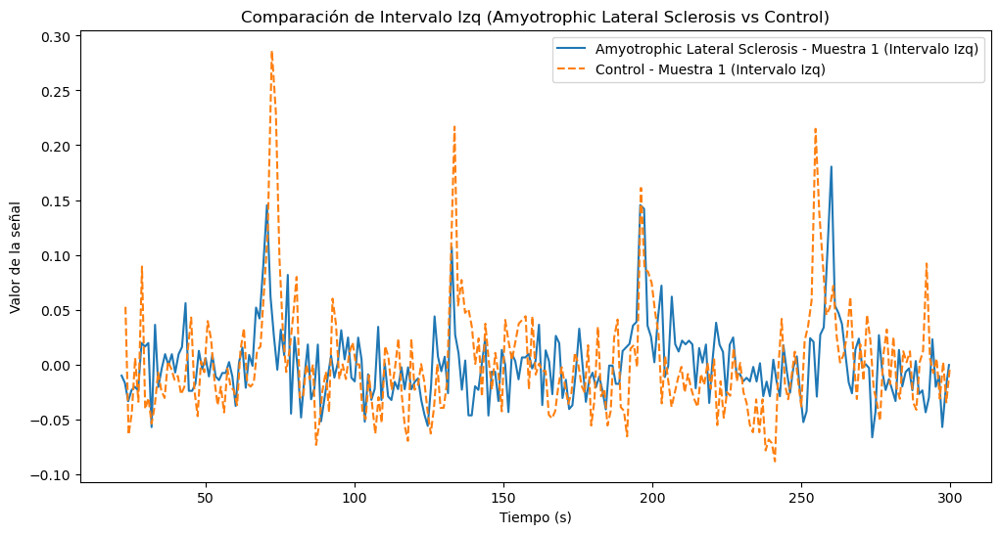

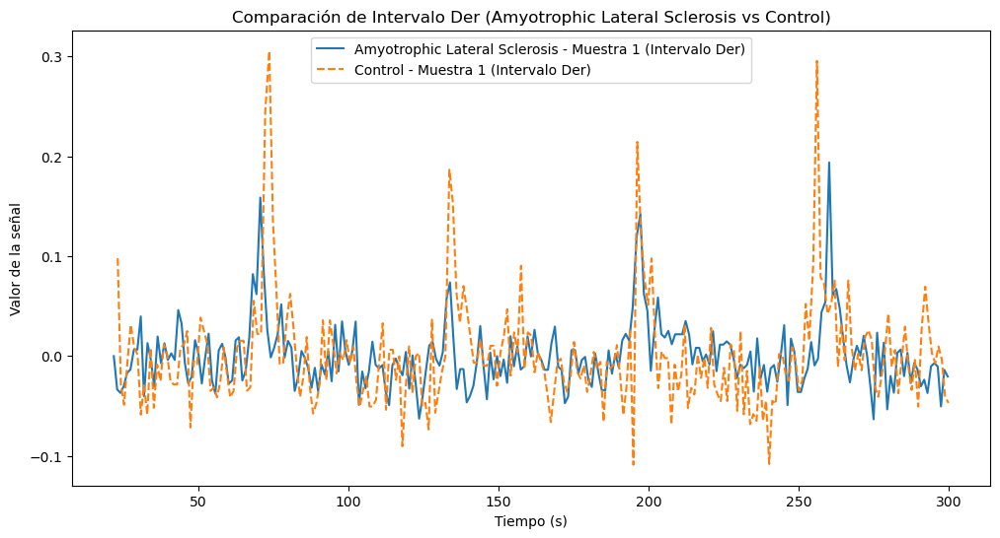

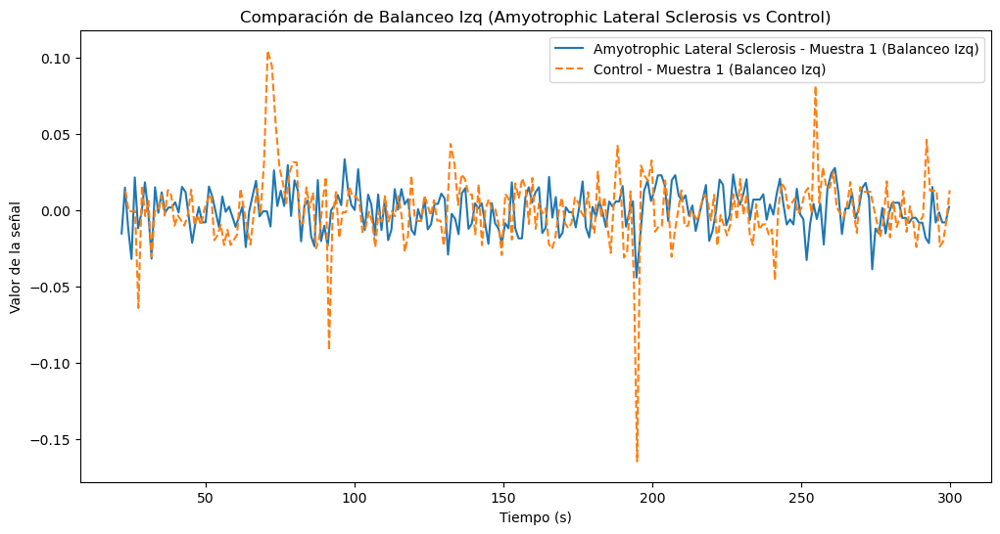

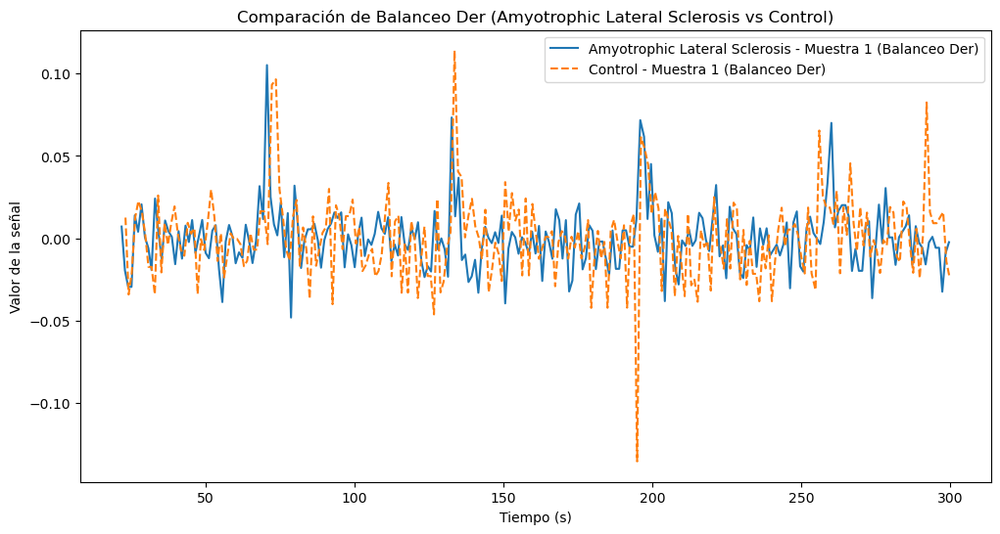

Comparando muestra 1 del grupo Amyotrophic Lateral Sclerosis con muestra 2 del grupo Control:


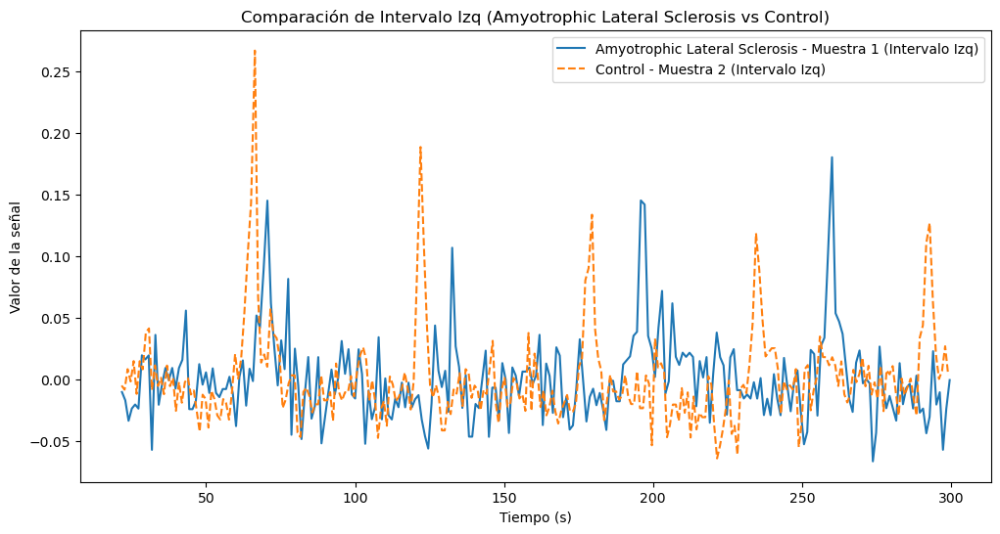

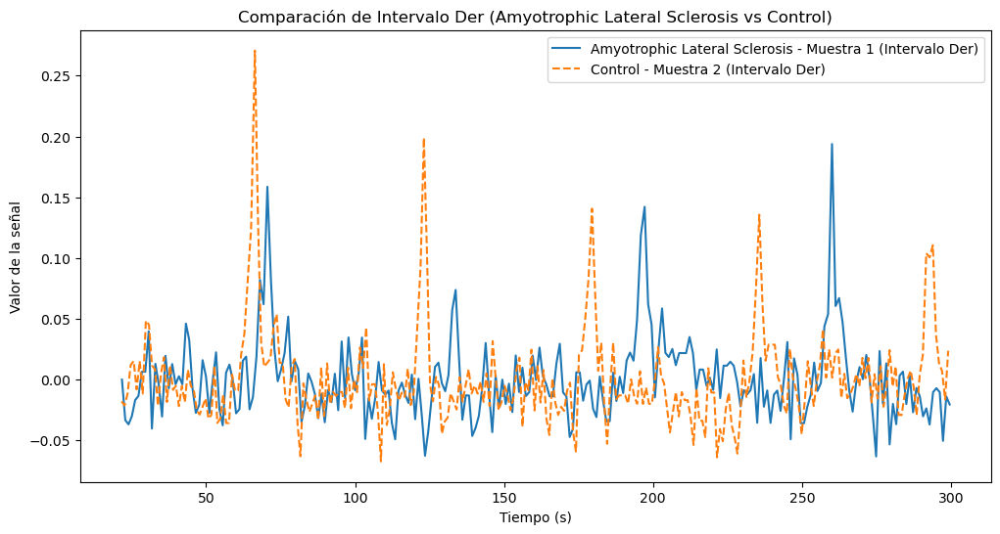

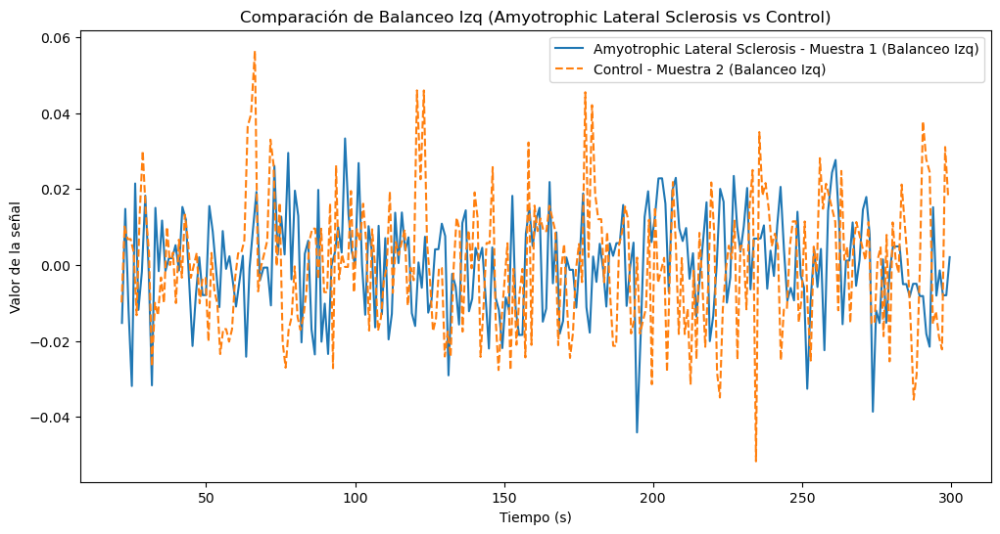

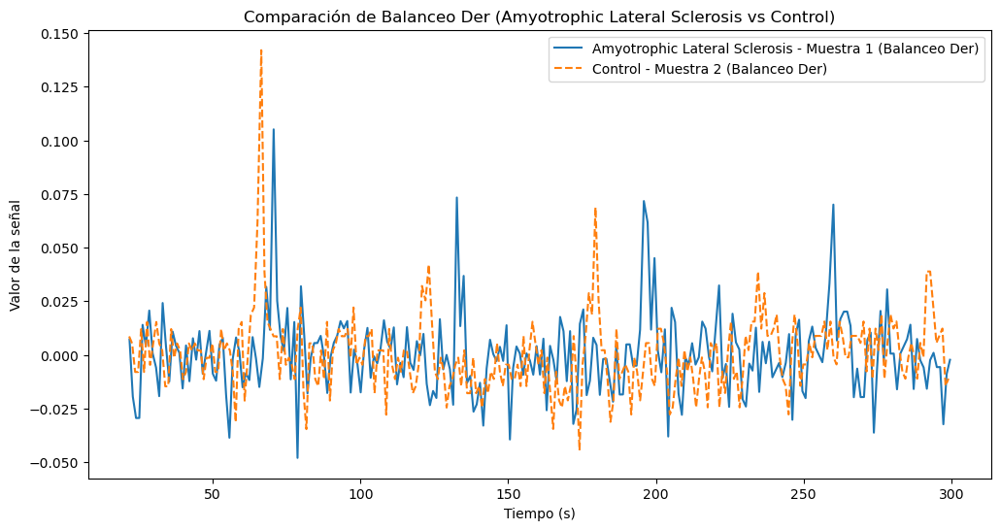

Comparando muestra 1 del grupo Amyotrophic Lateral Sclerosis con muestra 3 del grupo Control:


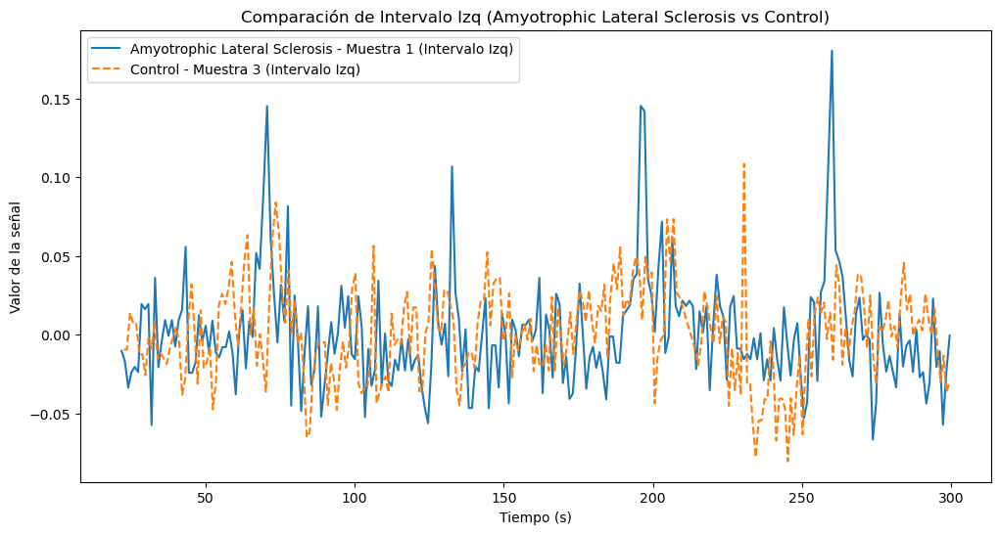

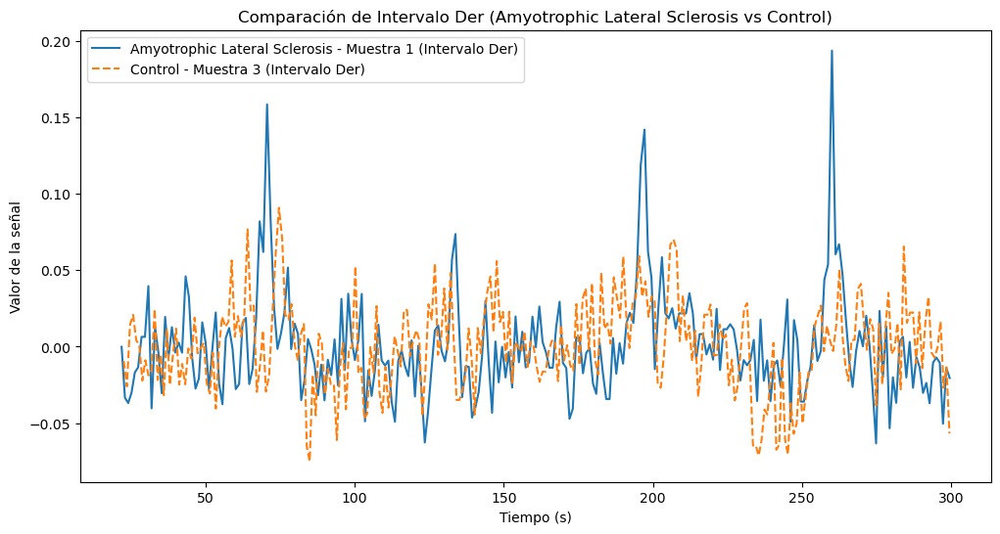

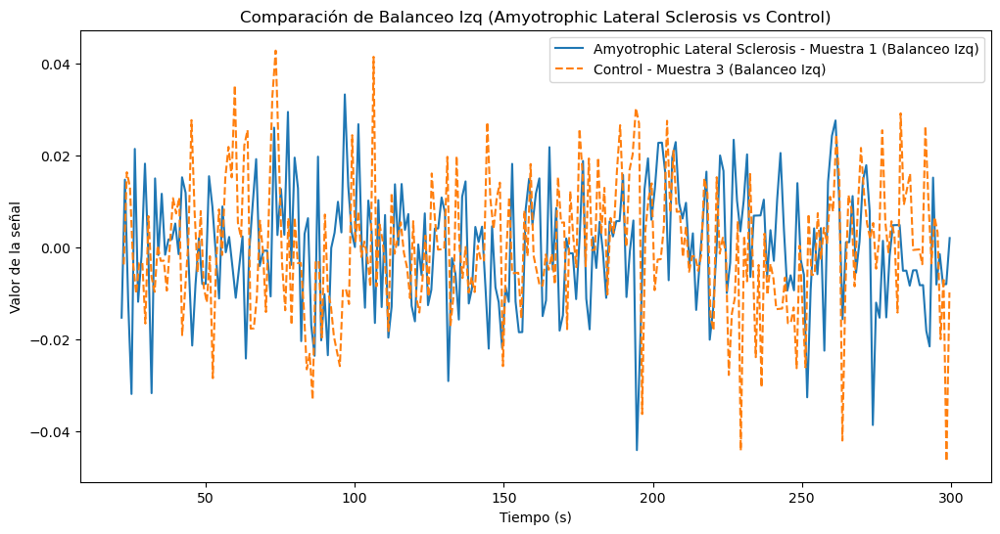

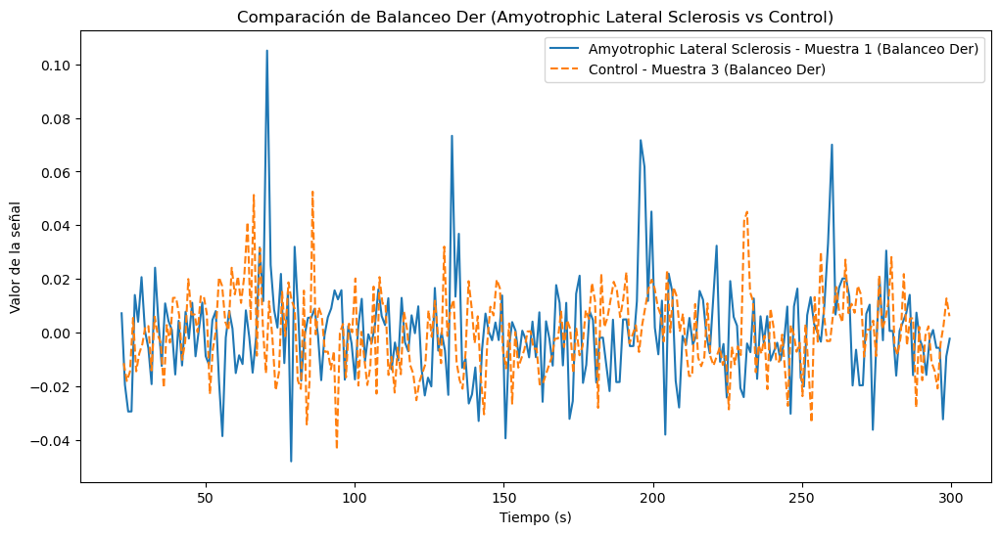

Comparando muestra 2 del grupo Amyotrophic Lateral Sclerosis con muestra 1 del grupo Control:


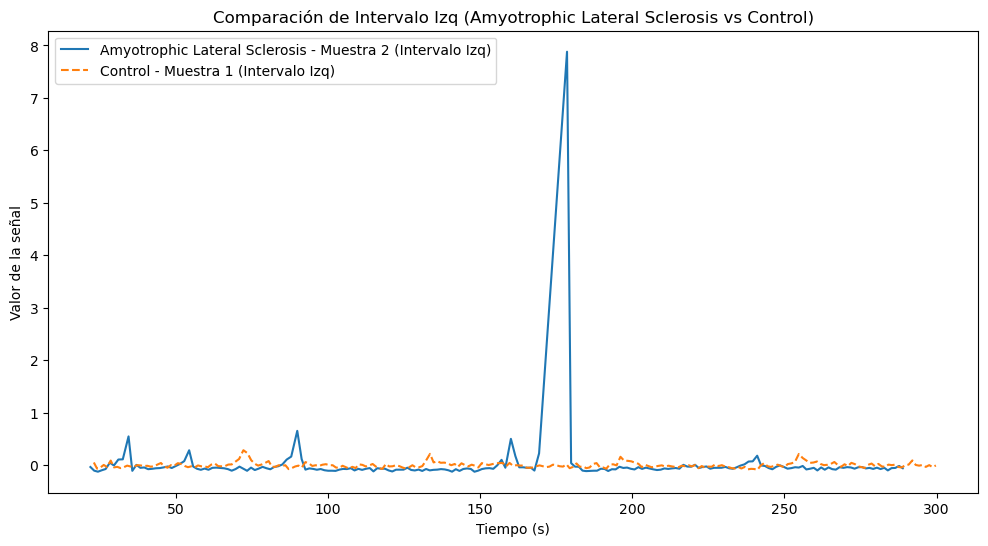

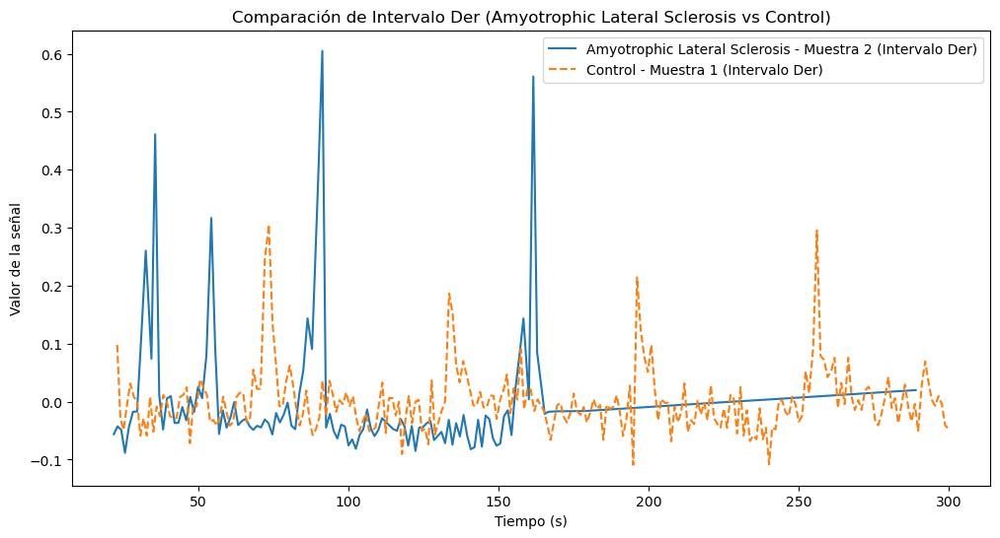

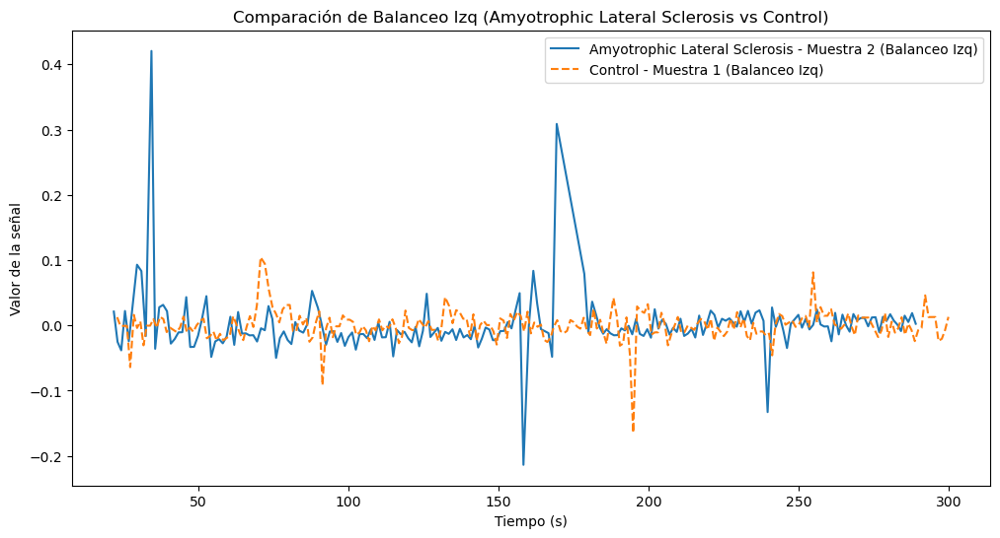

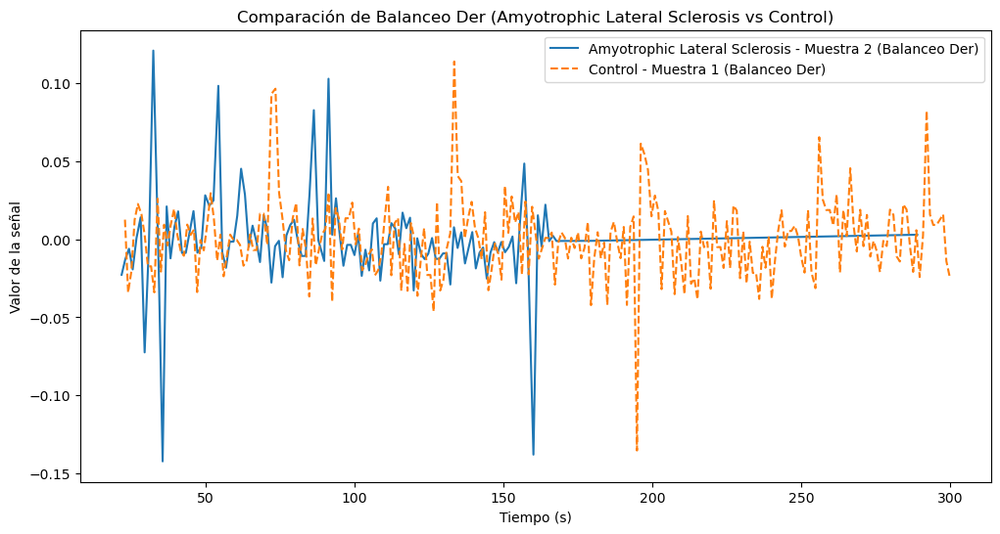

Comparando muestra 2 del grupo Amyotrophic Lateral Sclerosis con muestra 2 del grupo Control:


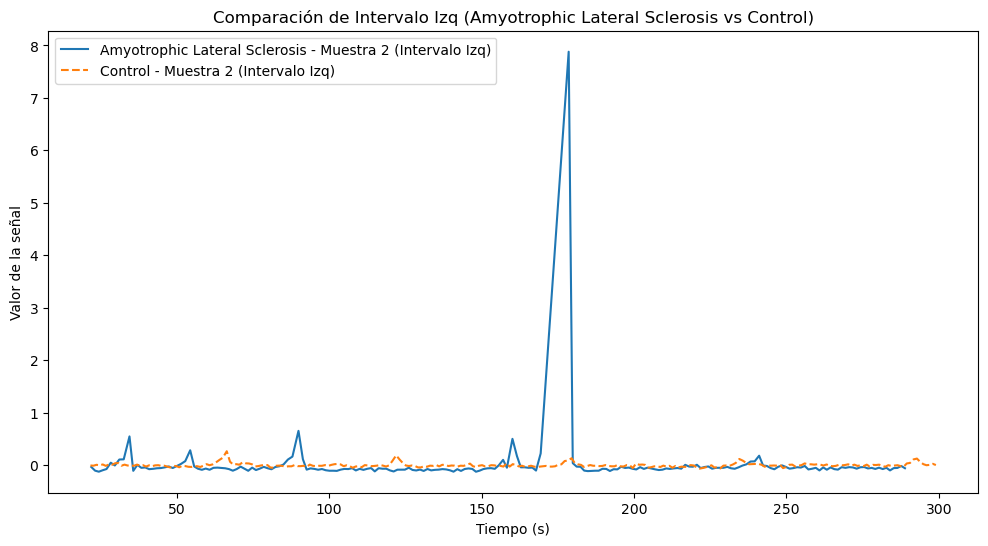

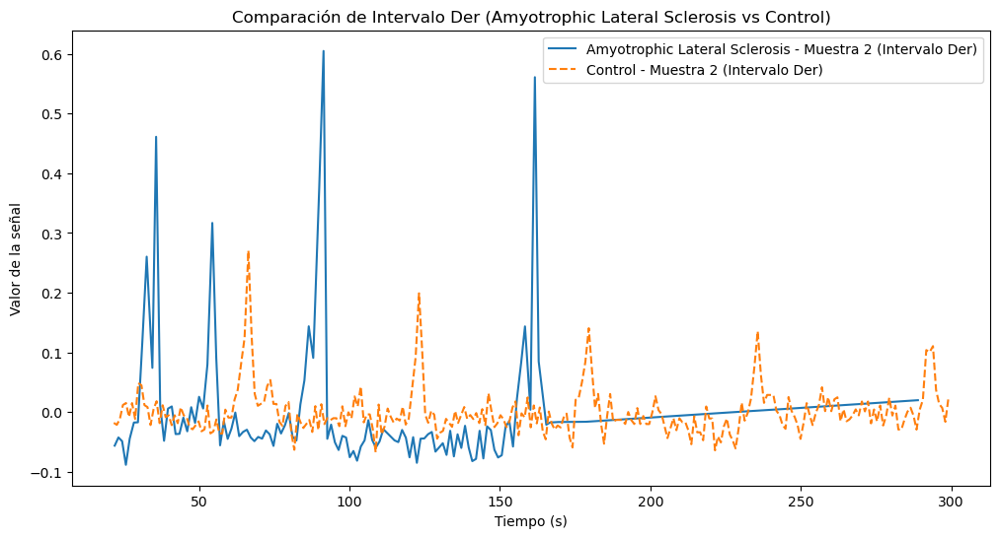

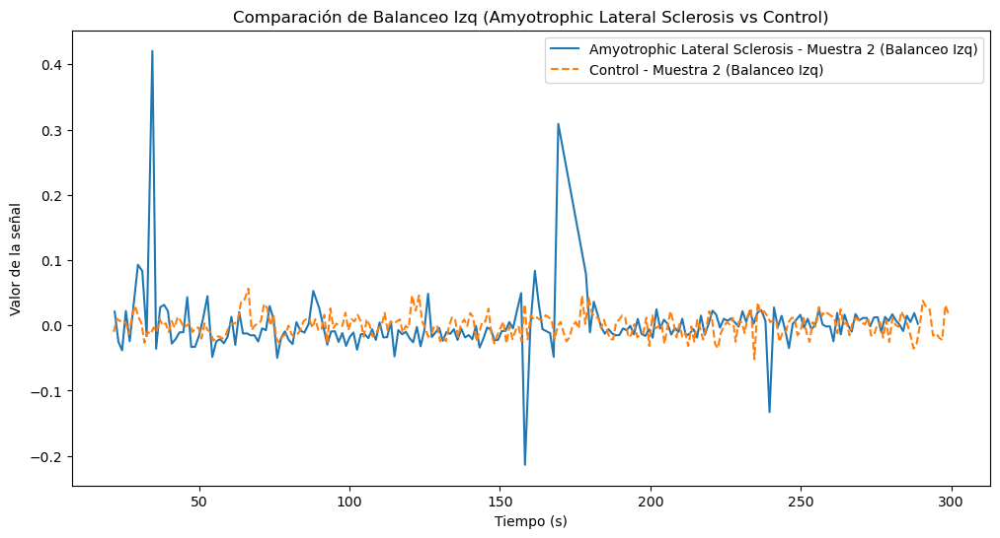

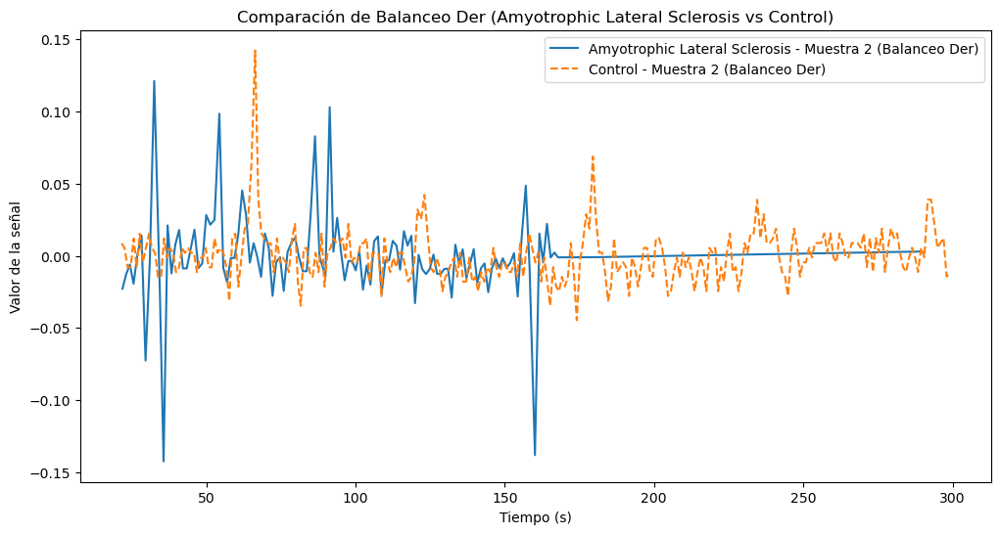

Comparando muestra 2 del grupo Amyotrophic Lateral Sclerosis con muestra 3 del grupo Control:


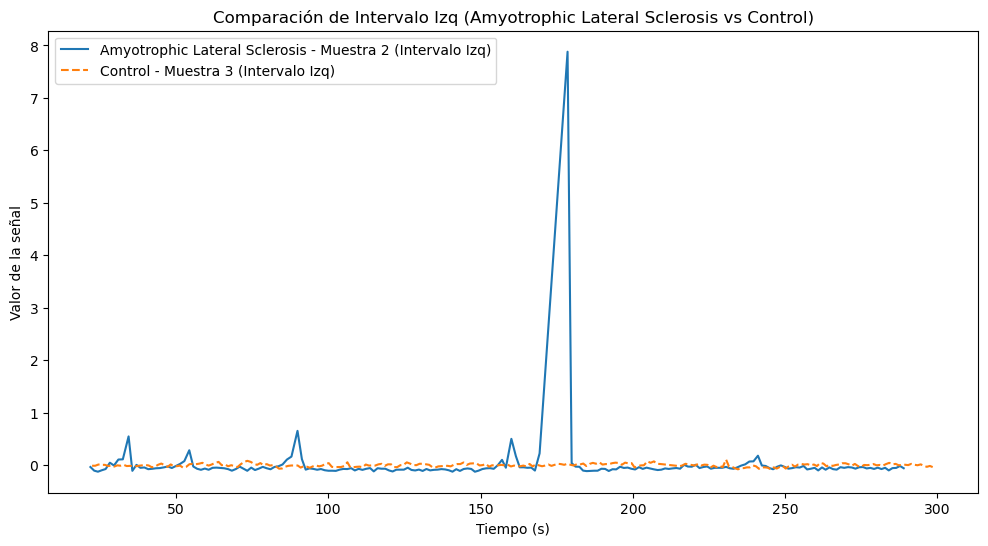

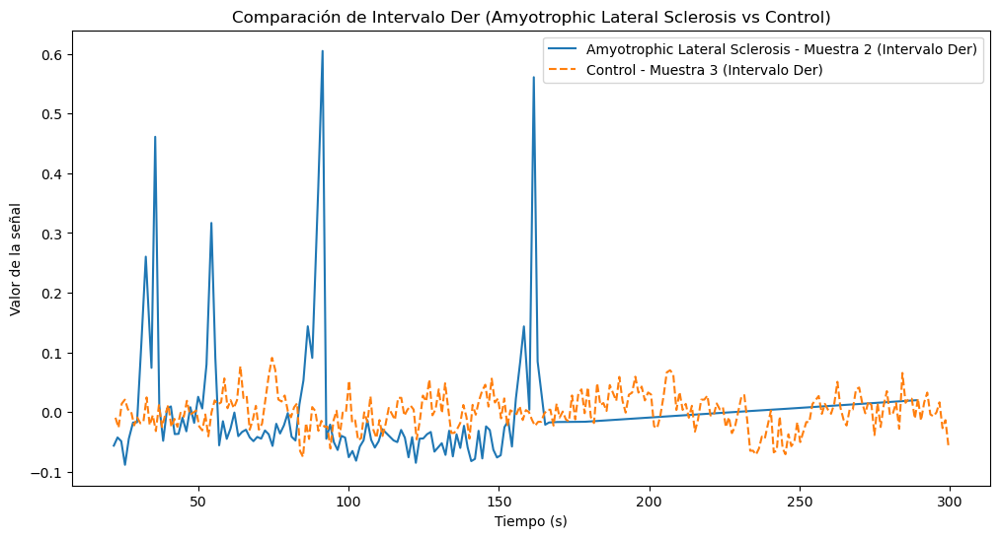

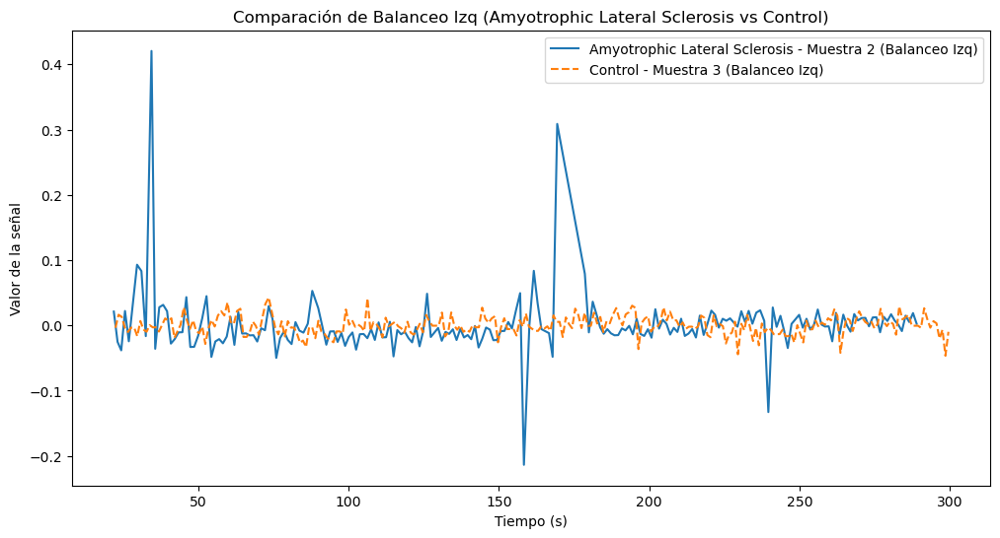

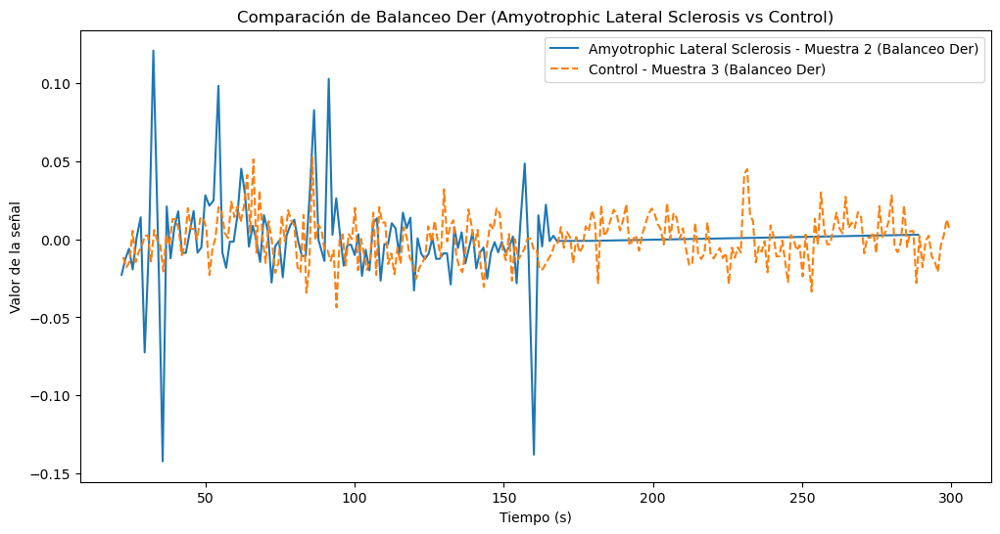

Comparando muestra 3 del grupo Amyotrophic Lateral Sclerosis con muestra 1 del grupo Control:


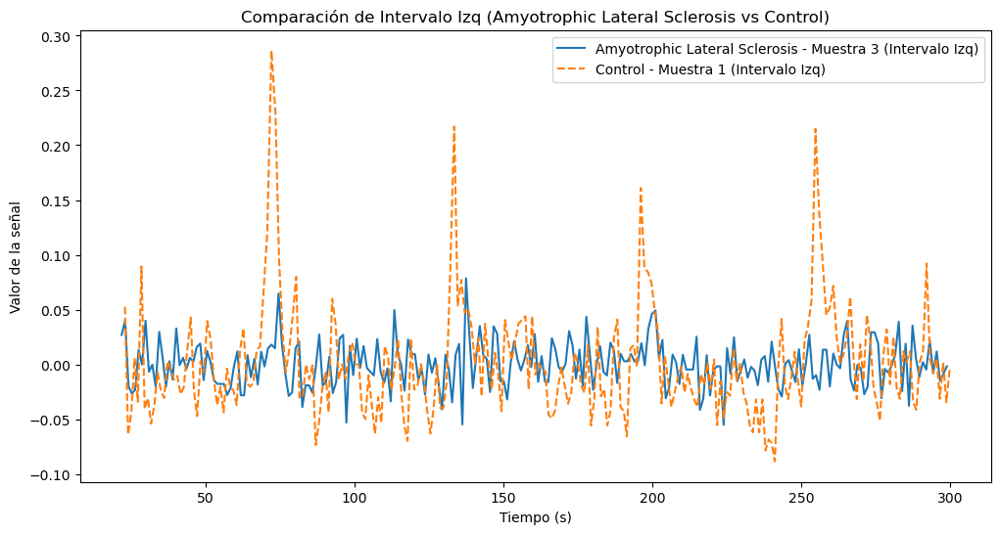

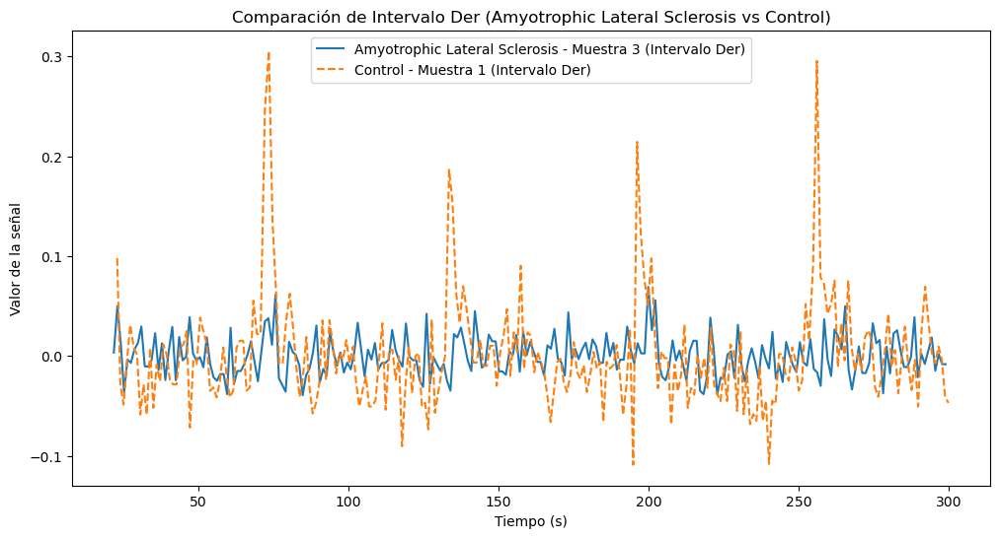

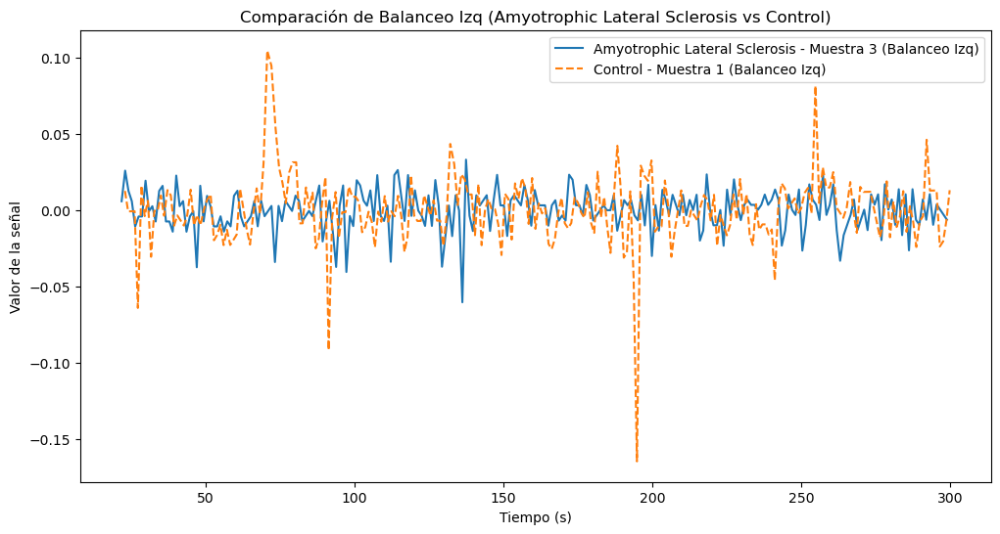

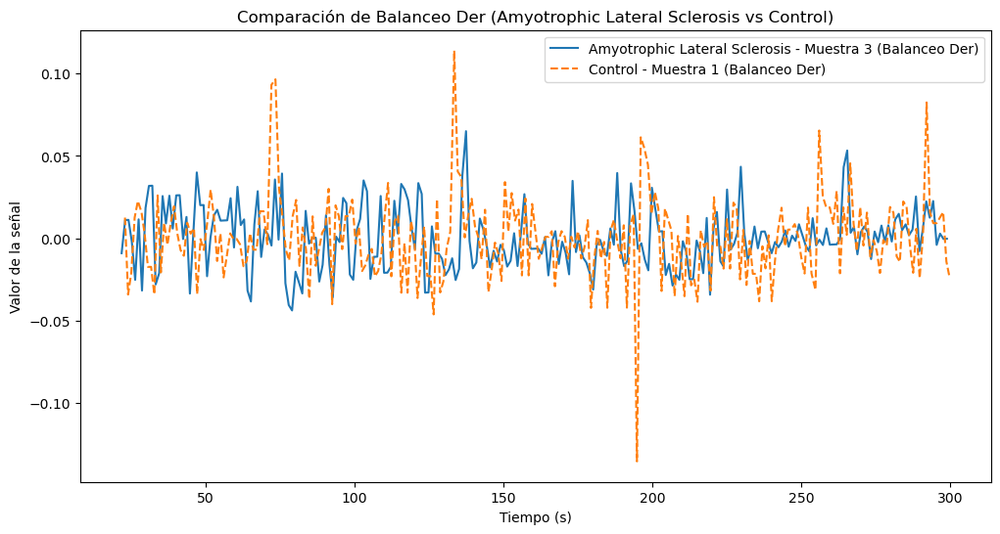

Comparando muestra 3 del grupo Amyotrophic Lateral Sclerosis con muestra 2 del grupo Control:


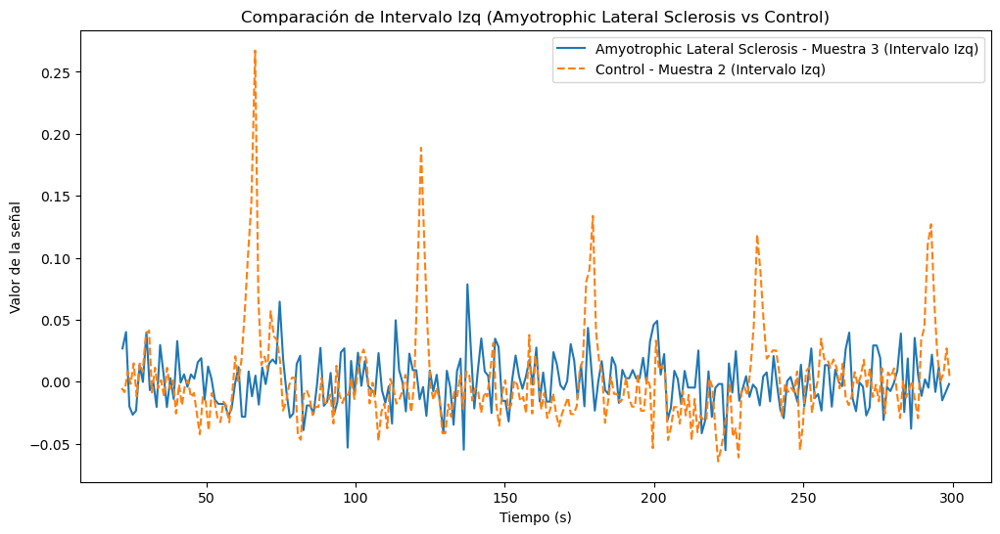

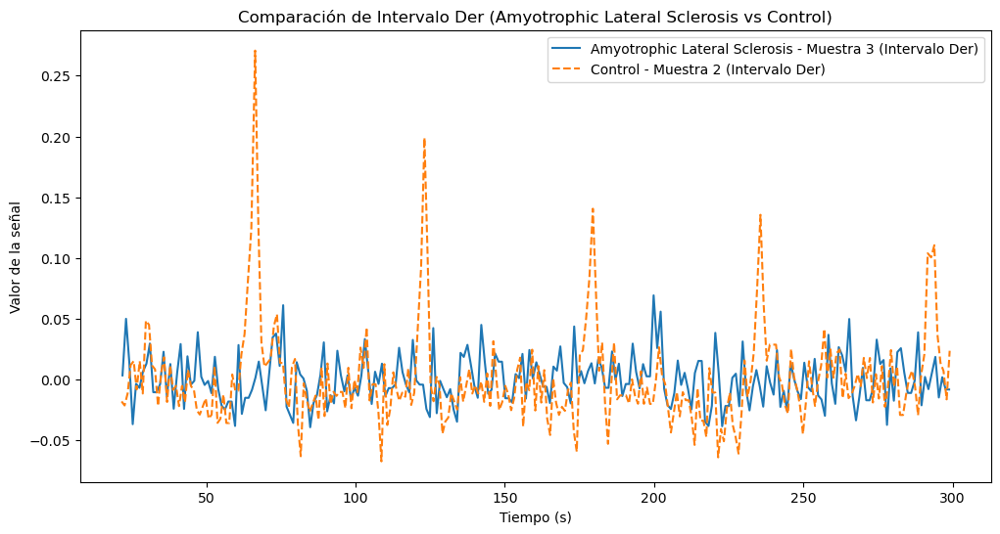

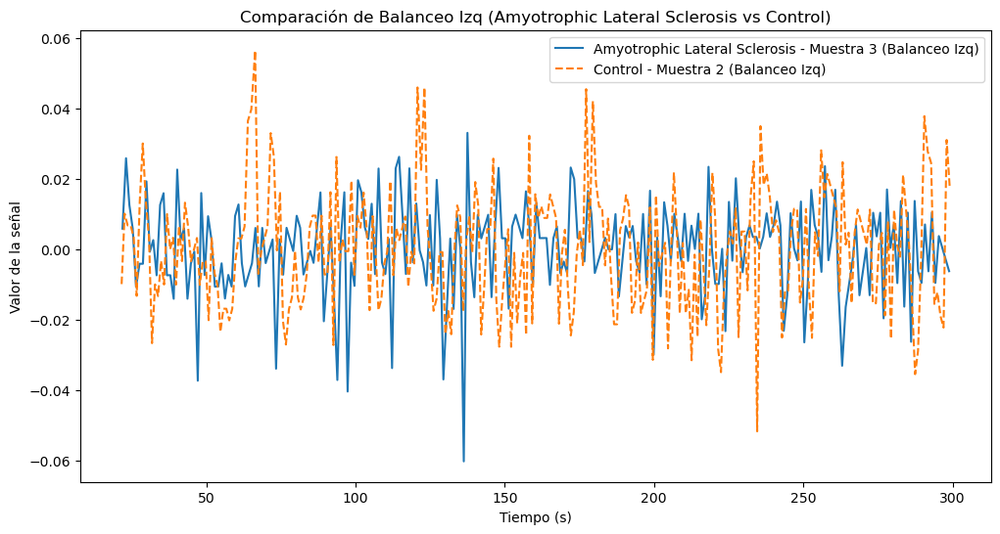

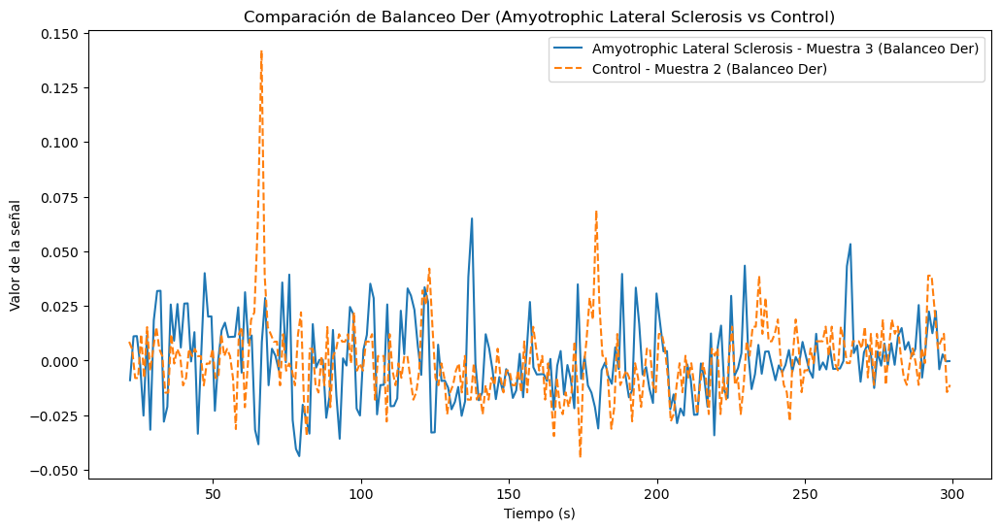

Comparando muestra 3 del grupo Amyotrophic Lateral Sclerosis con muestra 3 del grupo Control:


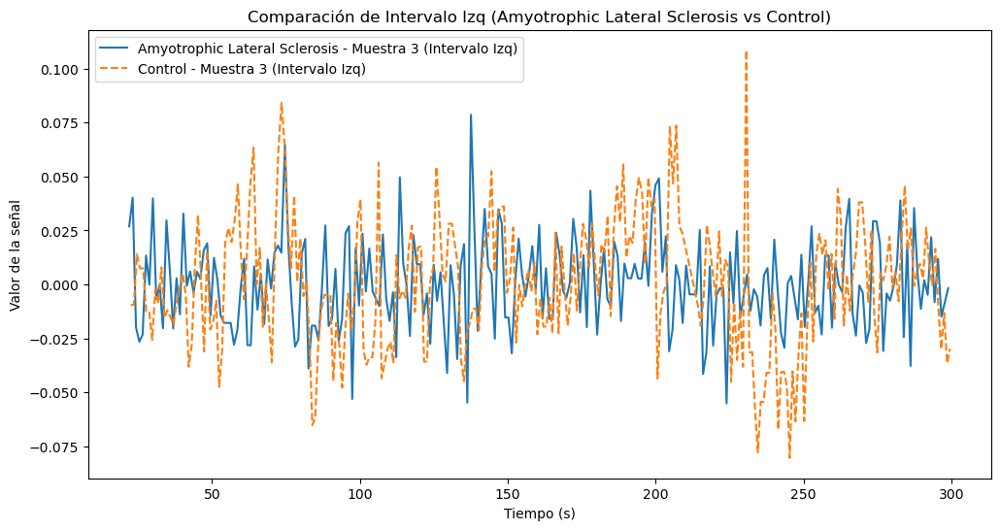

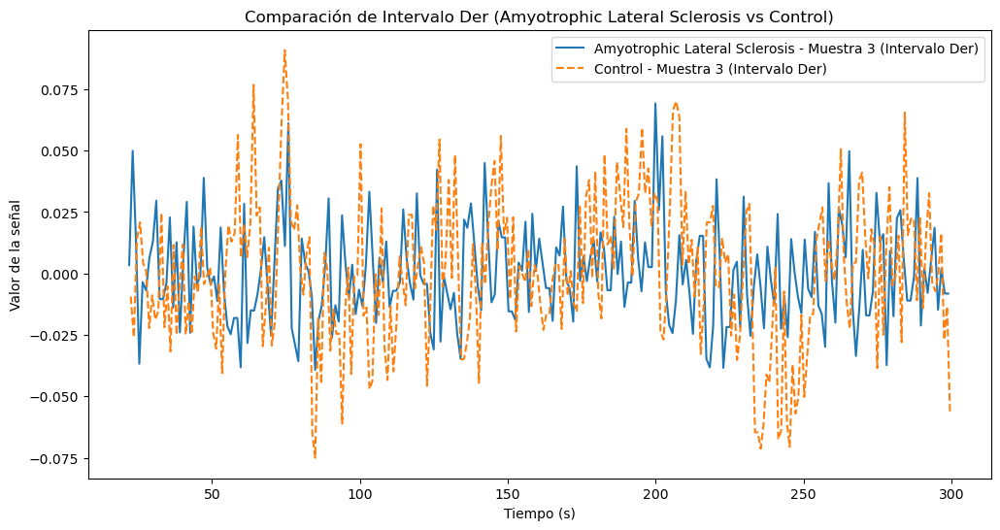

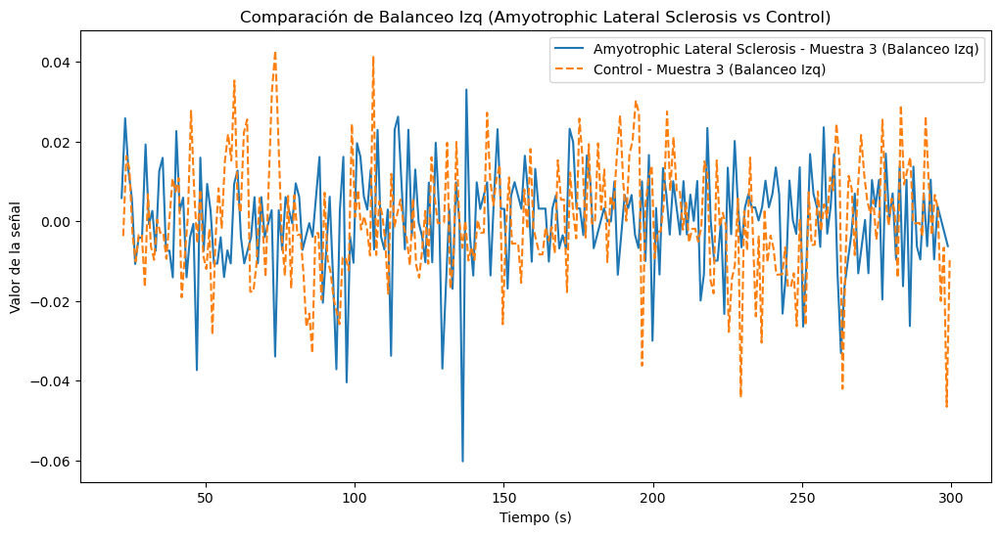

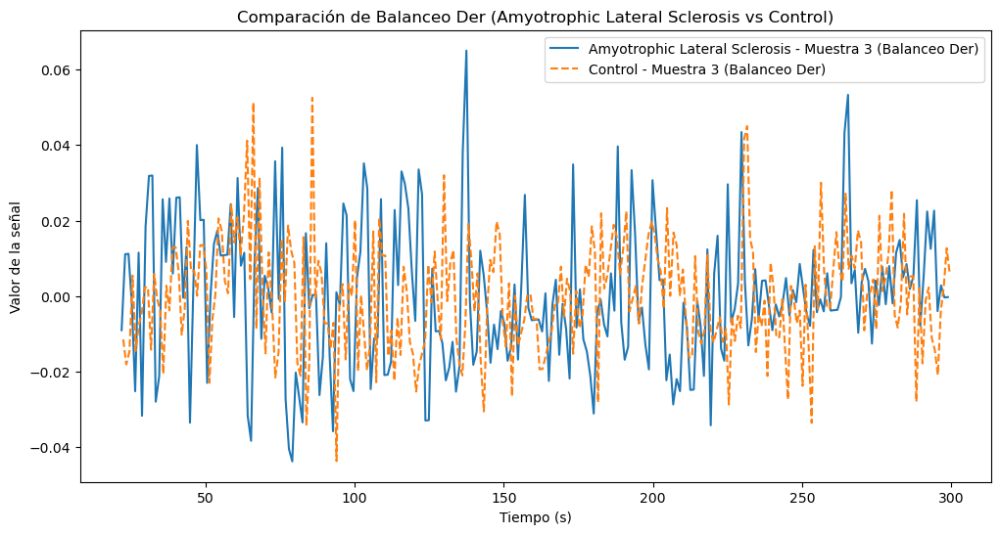


Comparando Huntington's Disease con Control:
Comparando muestra 1 del grupo Huntington's Disease con muestra 1 del grupo Control:


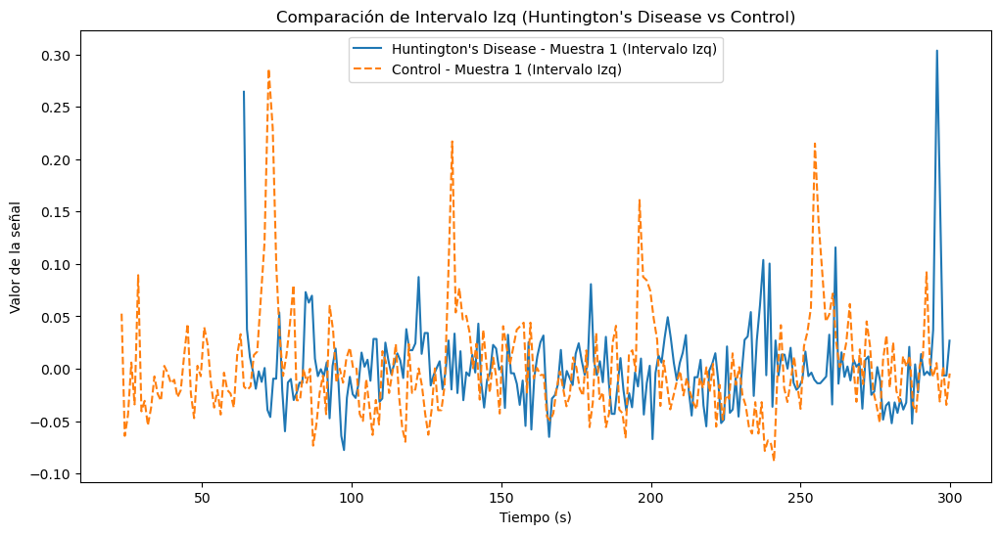

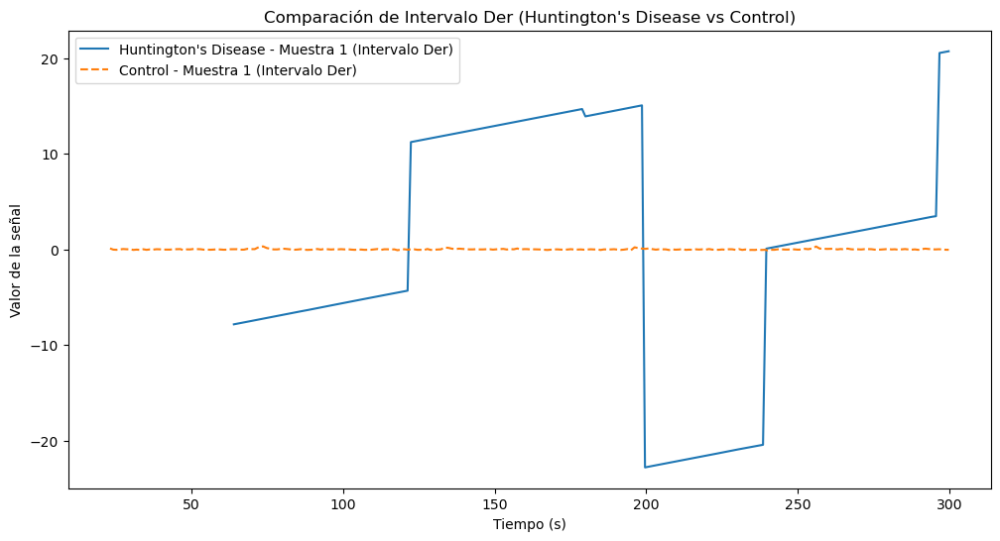

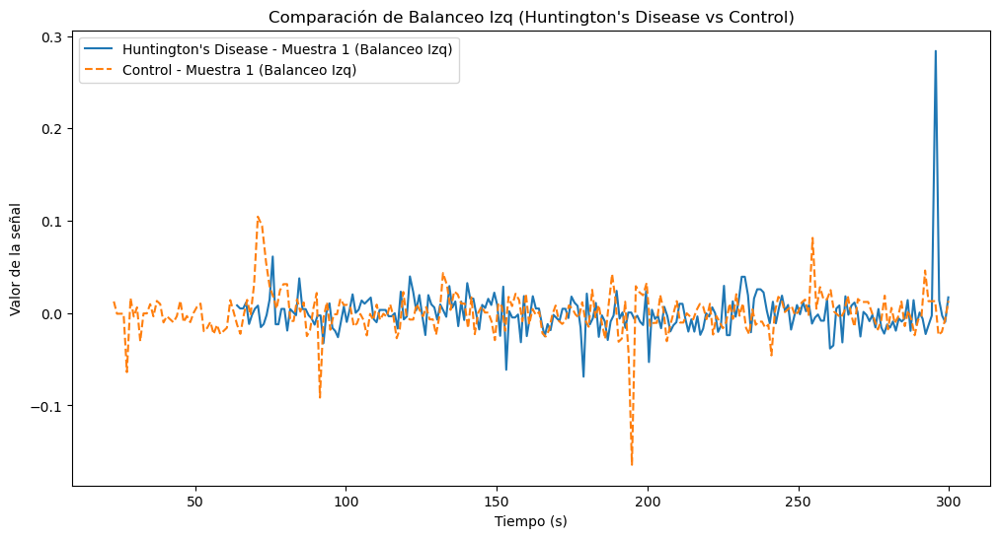

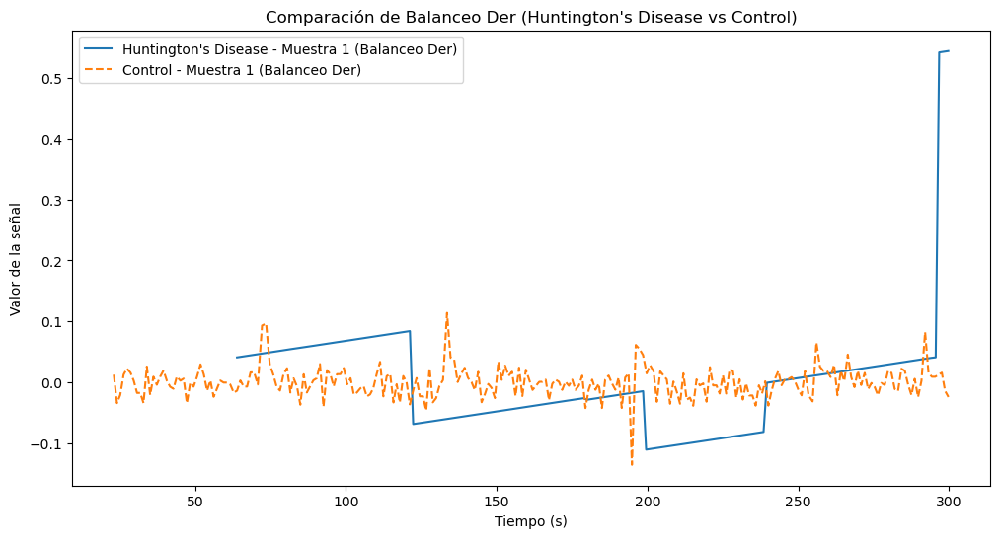

Comparando muestra 1 del grupo Huntington's Disease con muestra 2 del grupo Control:


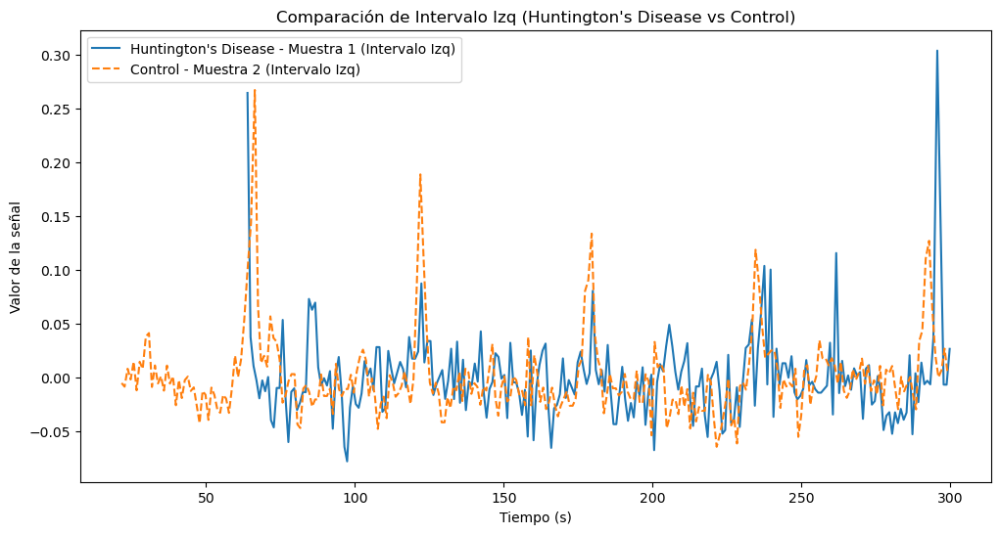

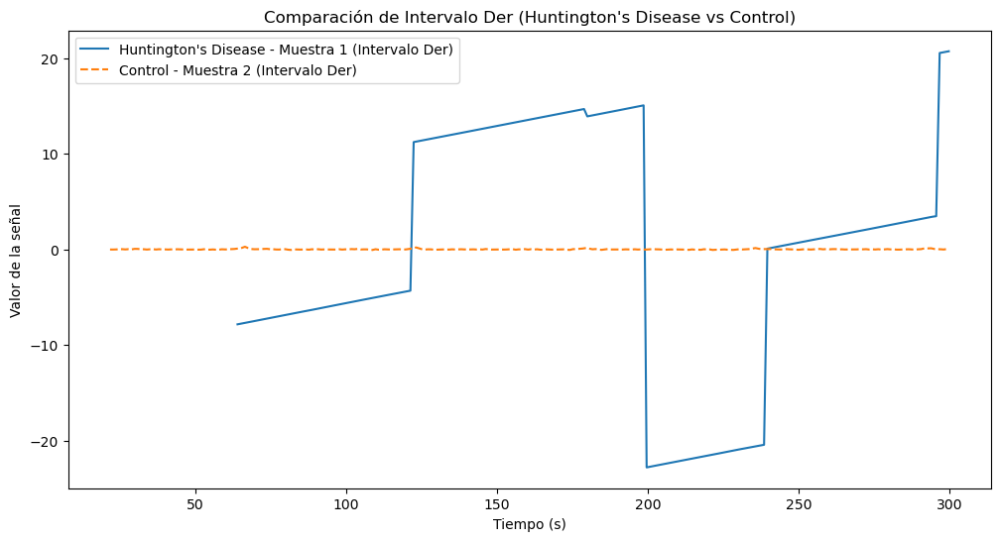

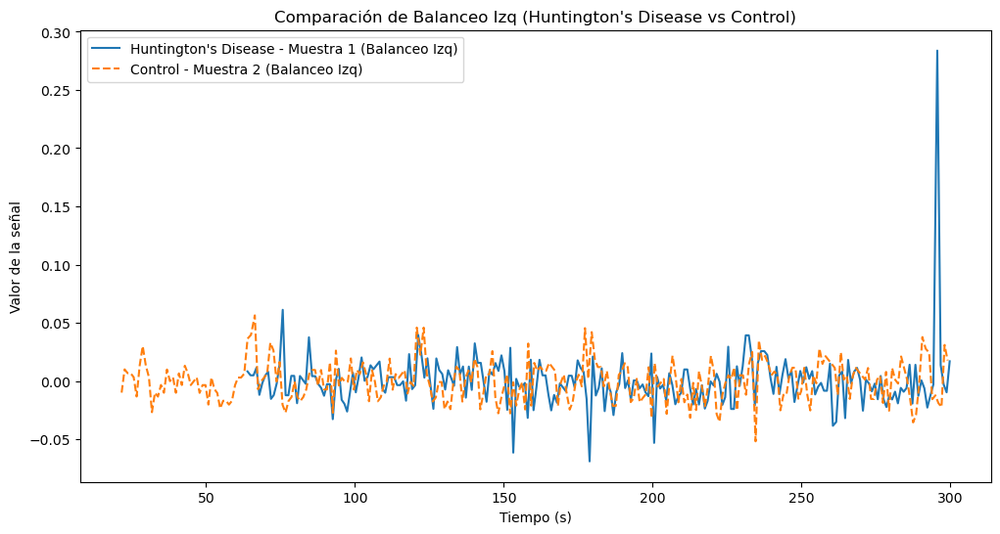

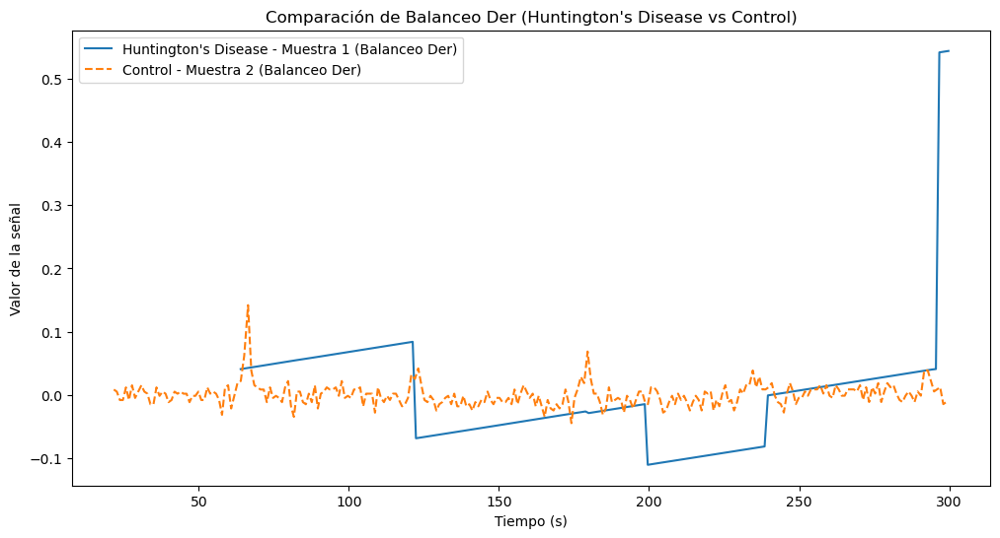

Comparando muestra 1 del grupo Huntington's Disease con muestra 3 del grupo Control:


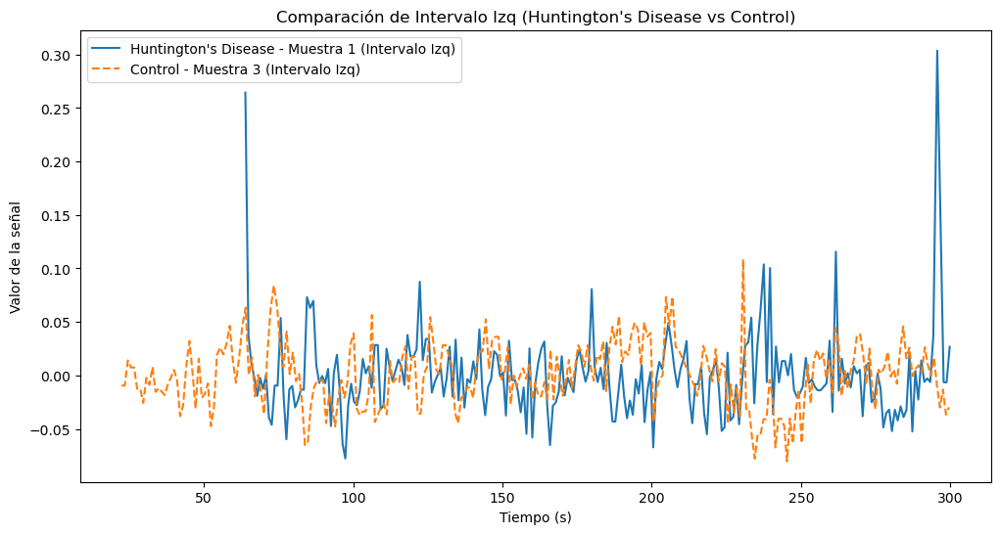

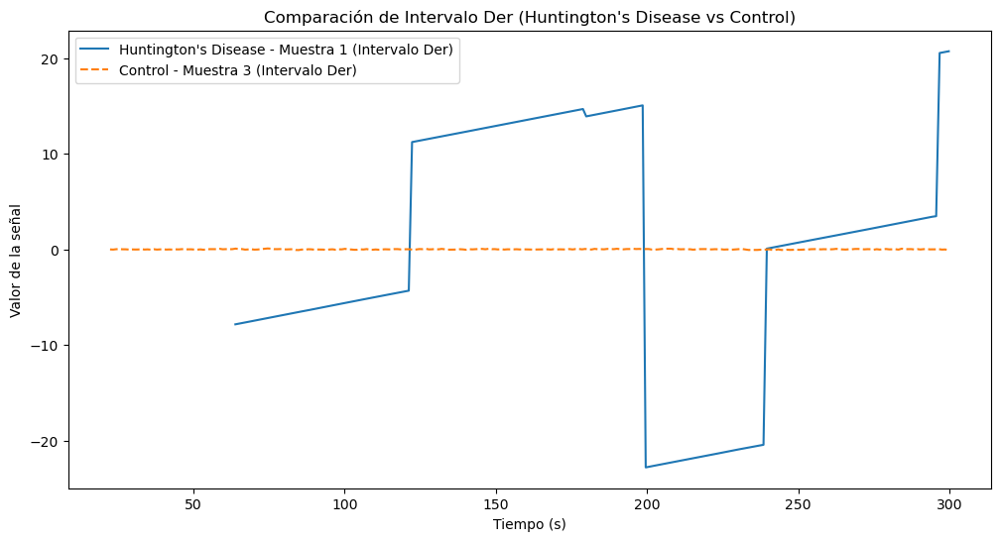

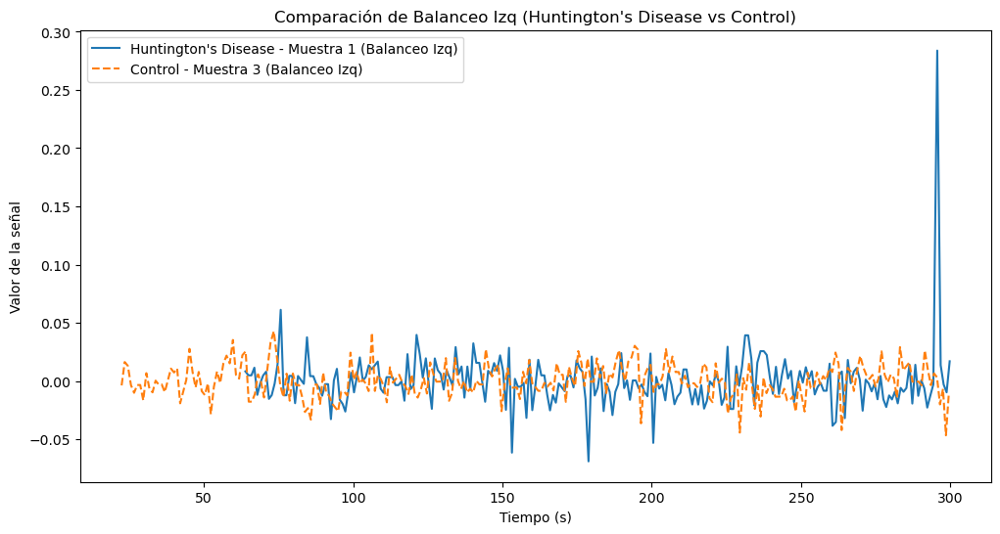

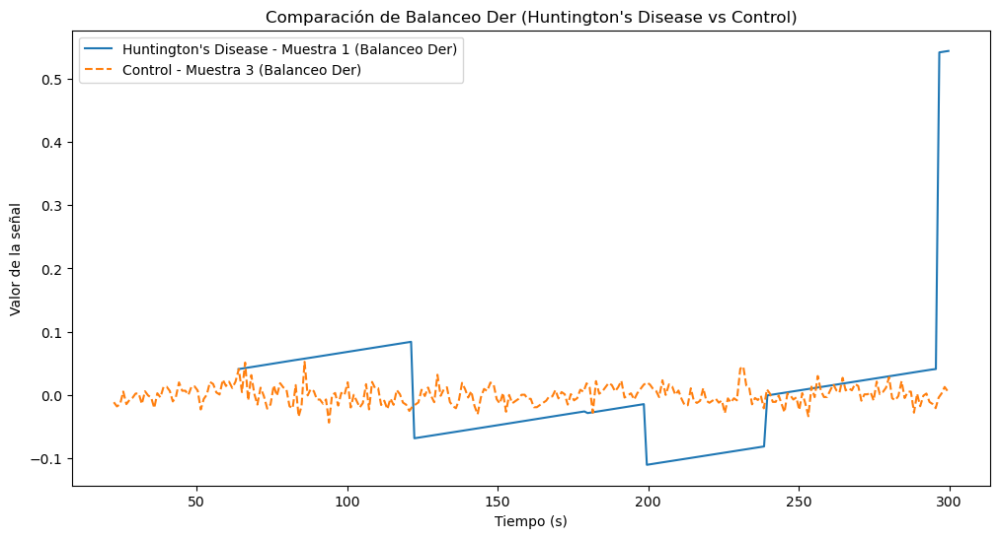

Comparando muestra 2 del grupo Huntington's Disease con muestra 1 del grupo Control:


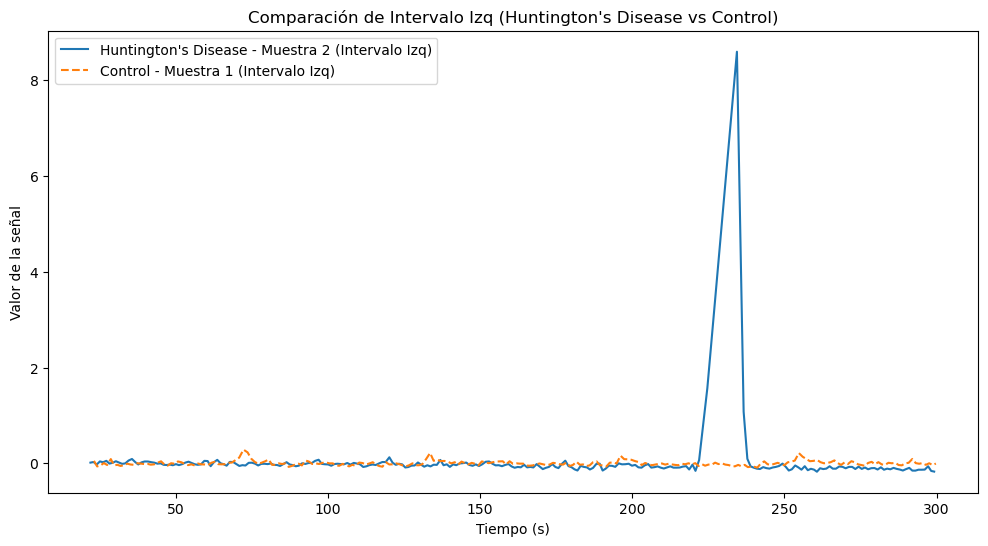

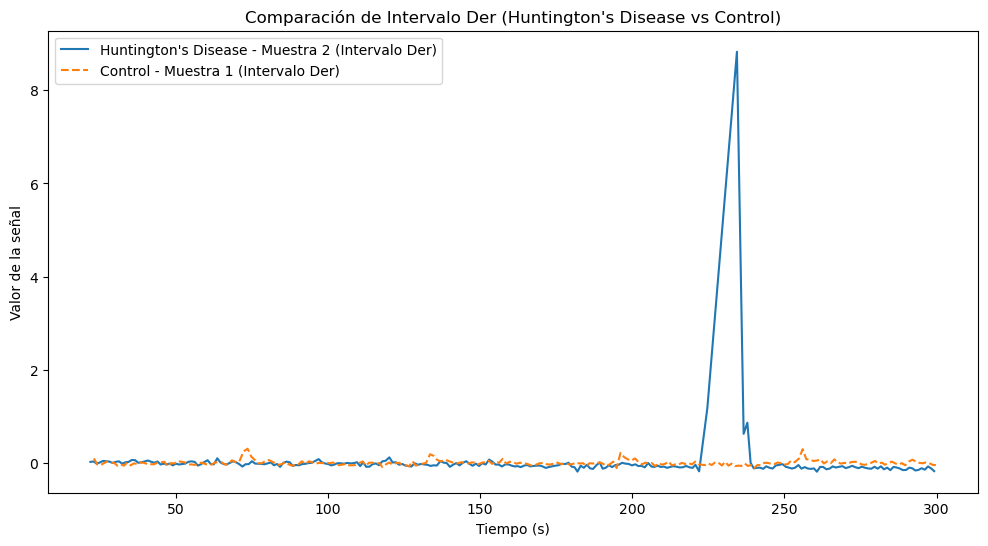

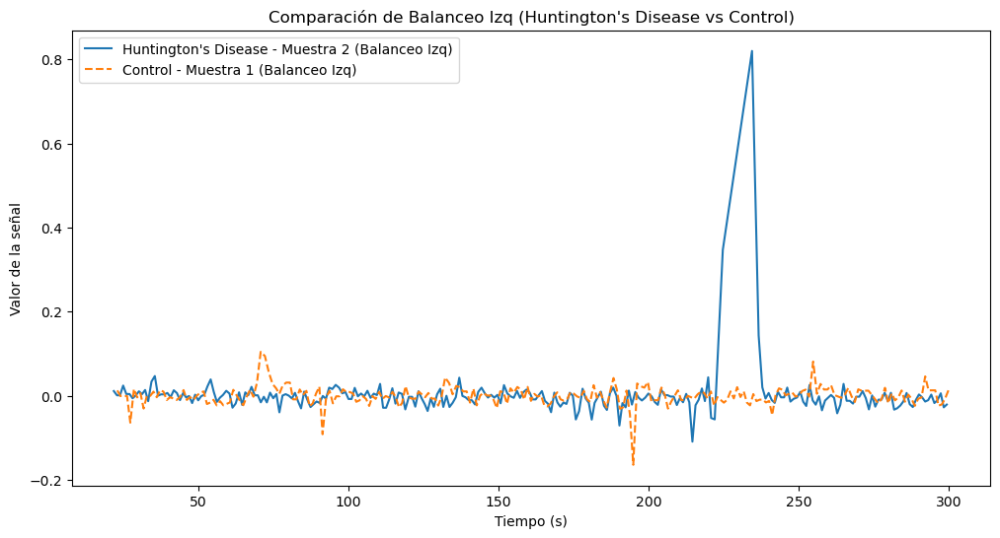

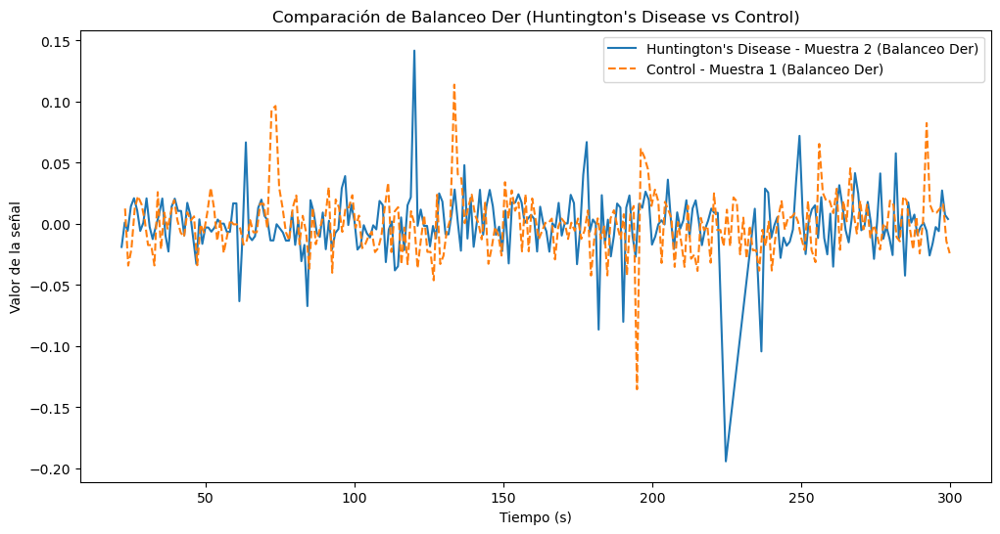

Comparando muestra 2 del grupo Huntington's Disease con muestra 2 del grupo Control:


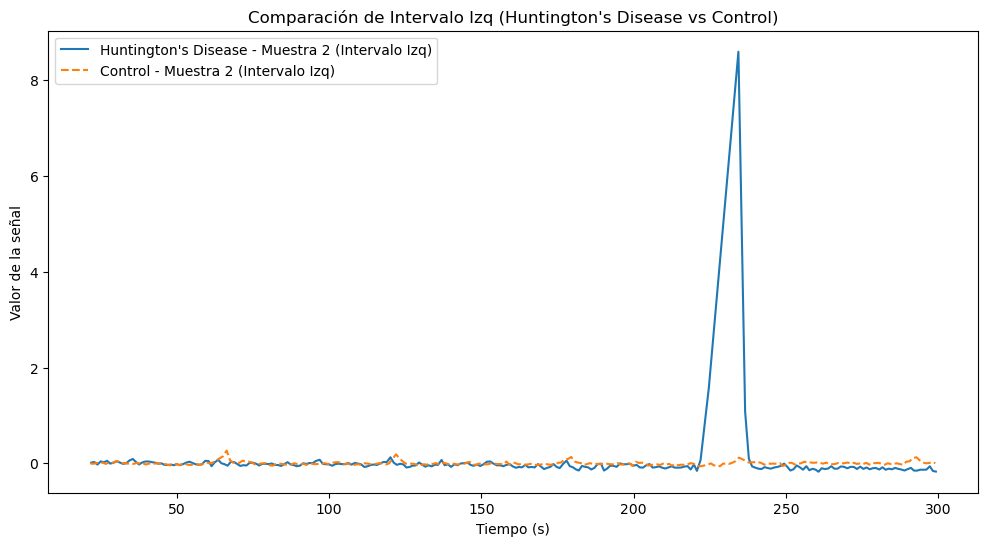

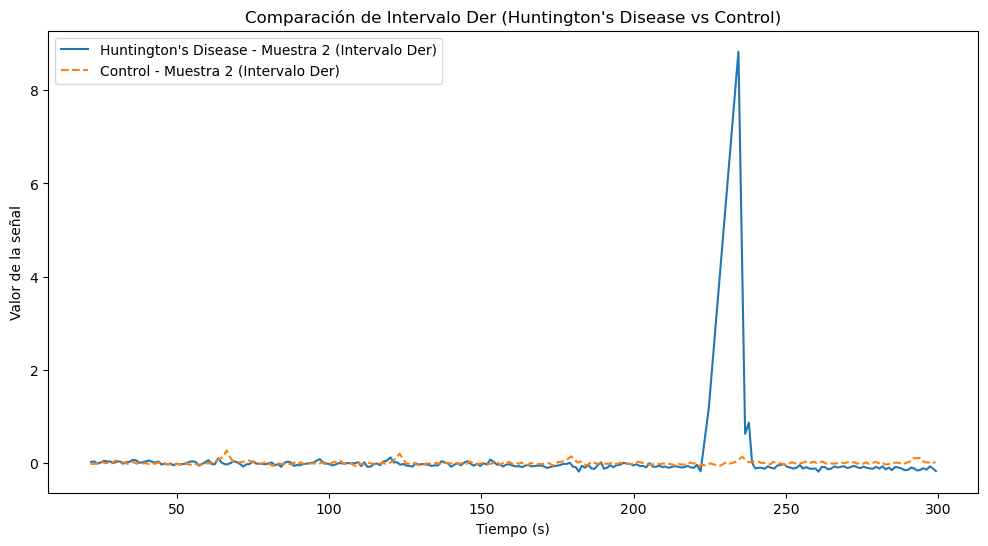

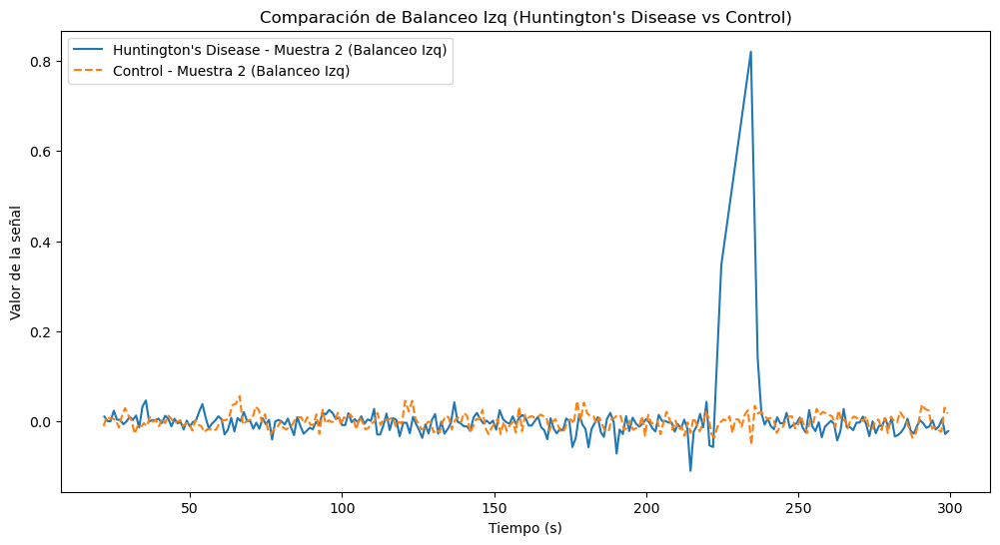

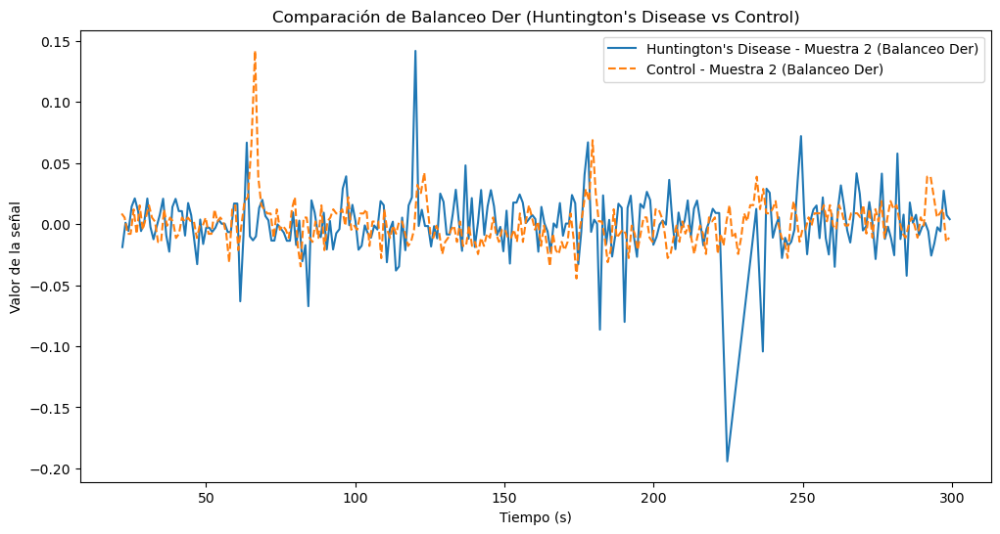

Comparando muestra 2 del grupo Huntington's Disease con muestra 3 del grupo Control:


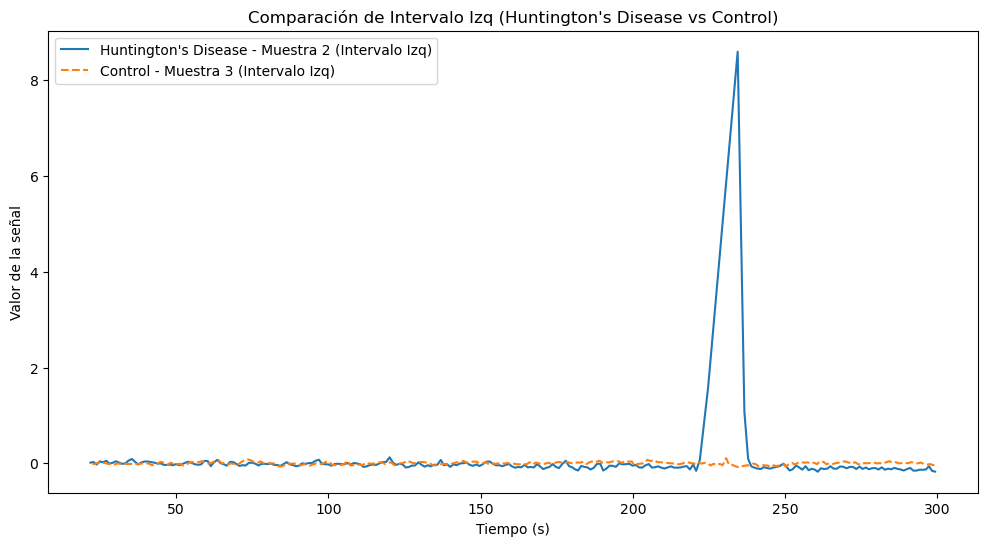

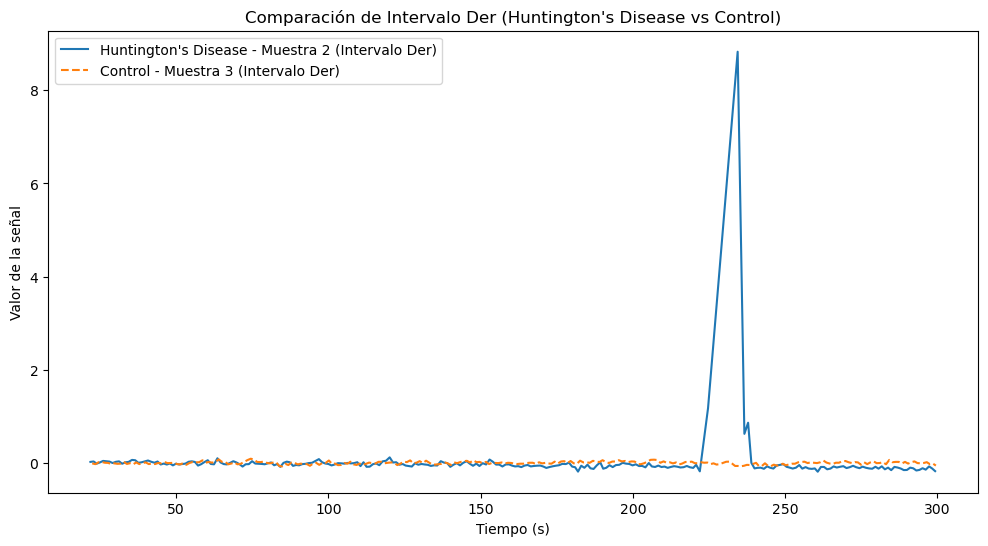

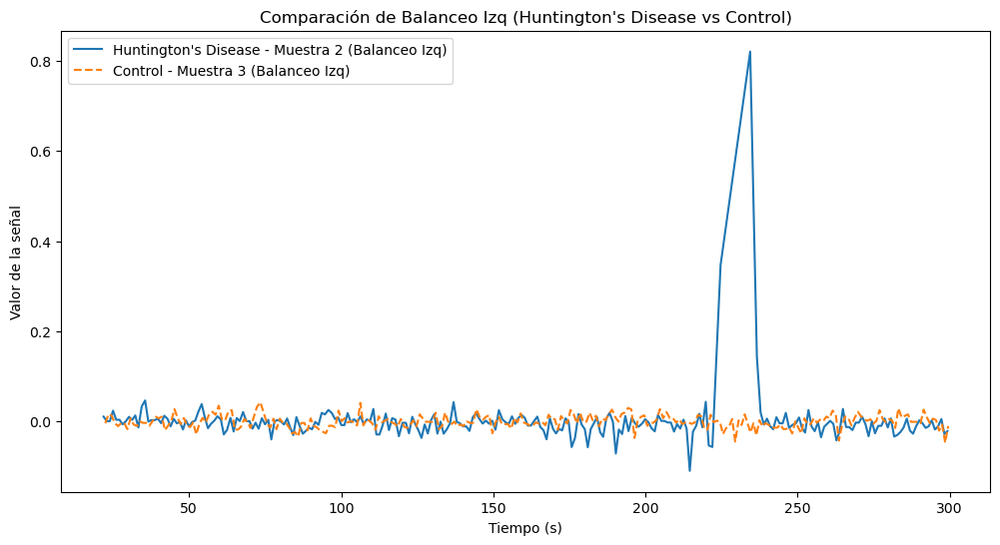

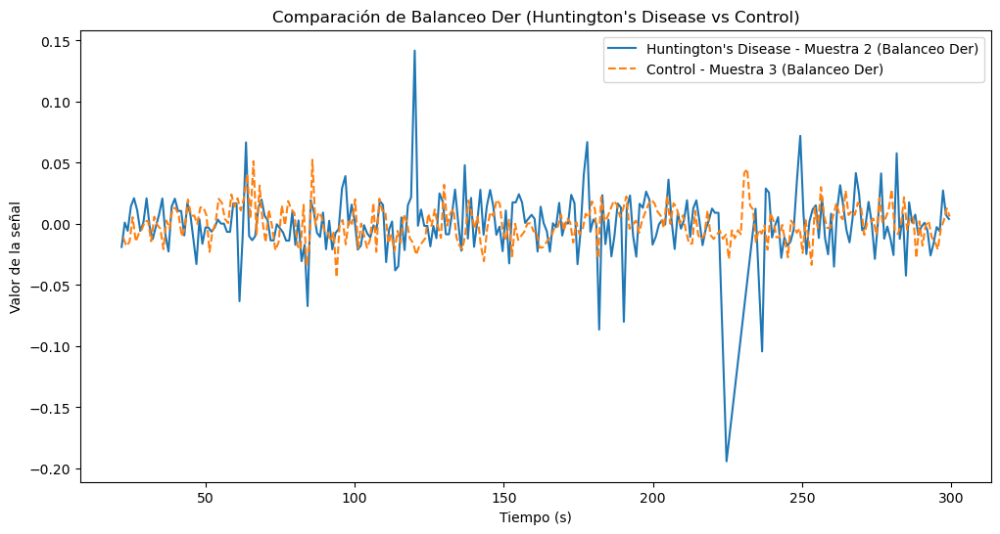

Comparando muestra 3 del grupo Huntington's Disease con muestra 1 del grupo Control:


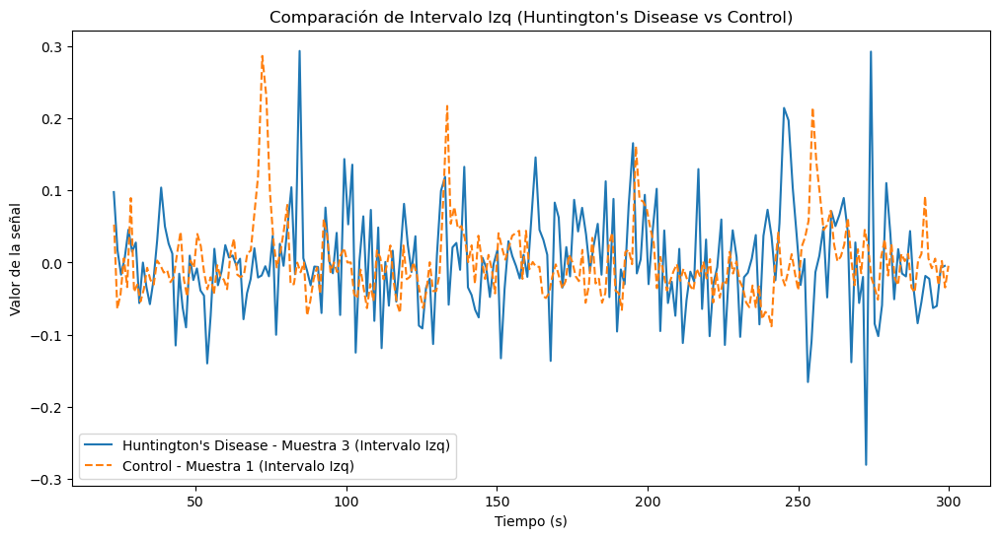

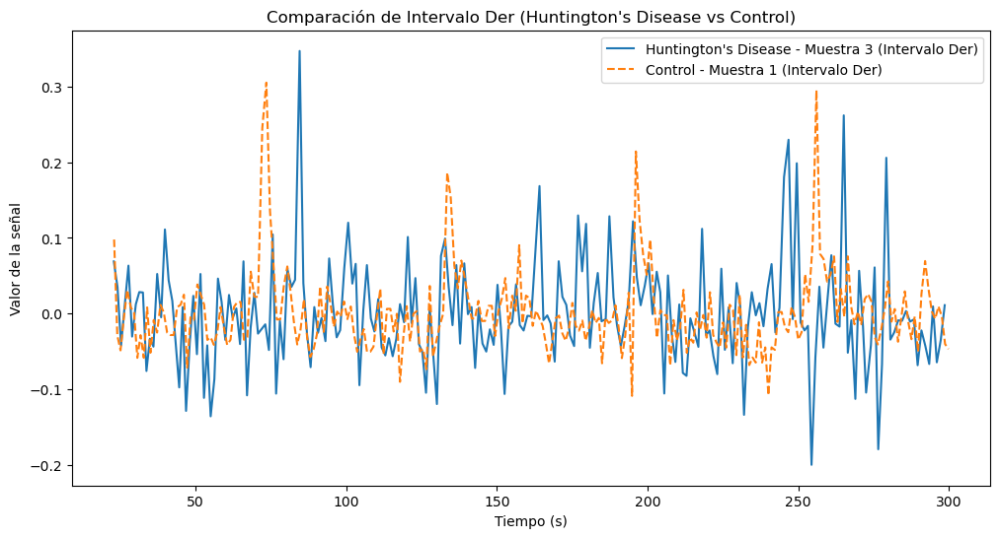

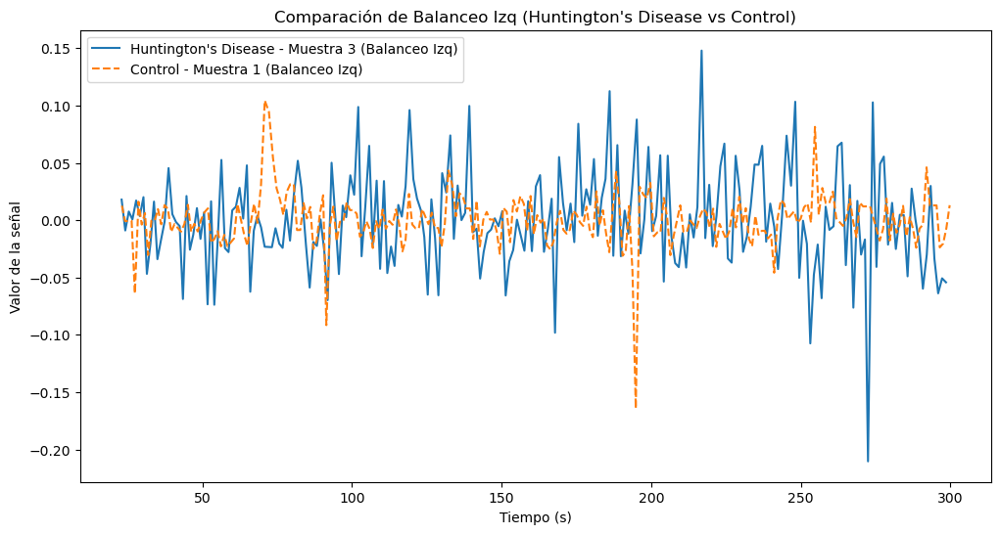

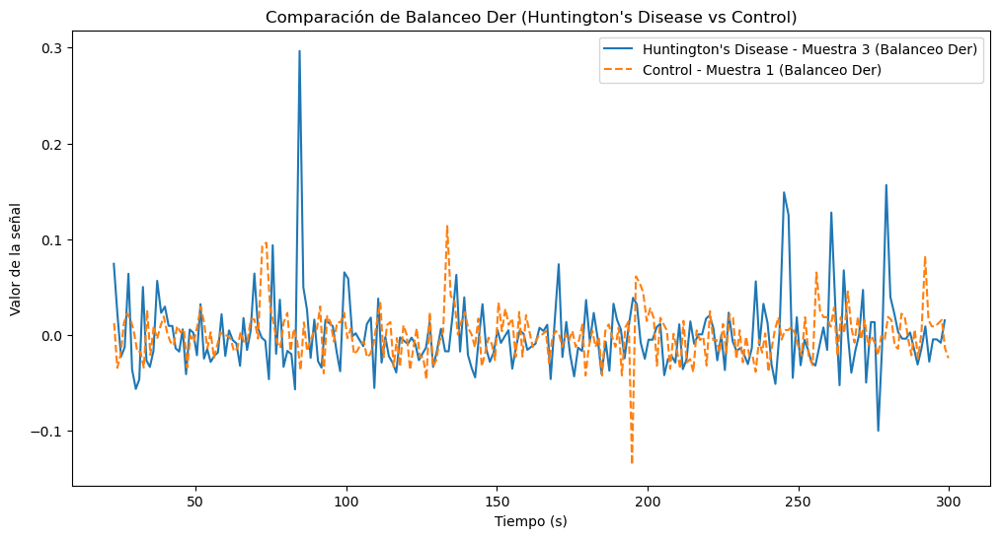

Comparando muestra 3 del grupo Huntington's Disease con muestra 2 del grupo Control:


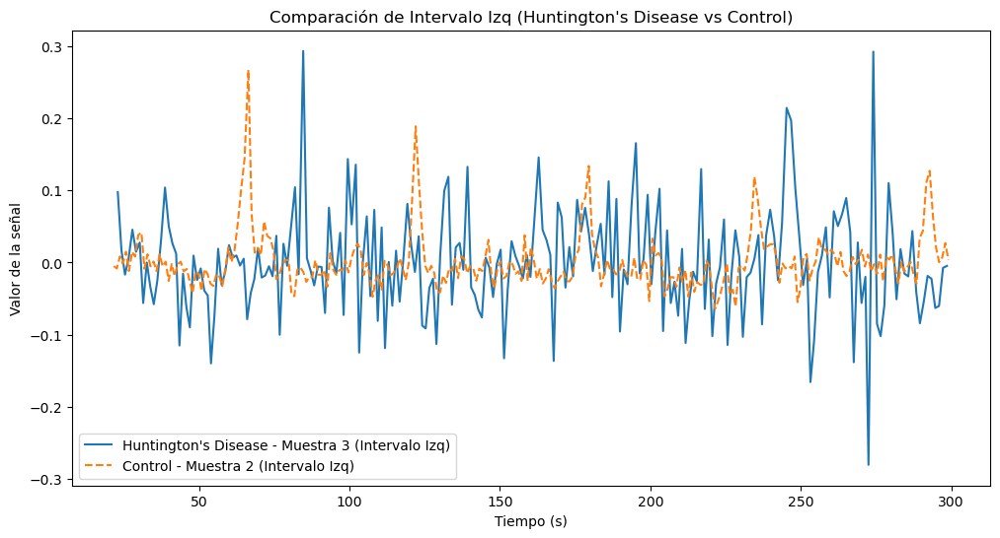

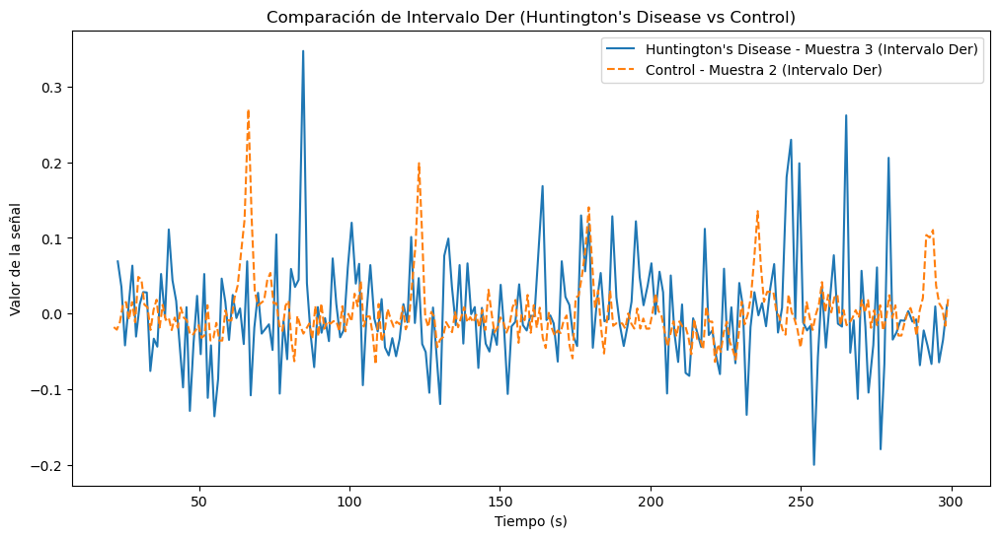

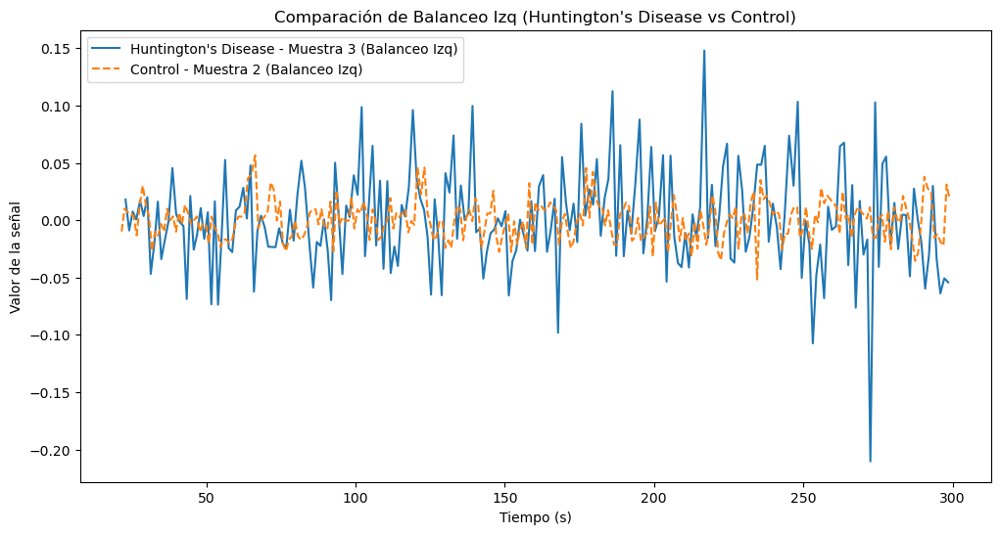

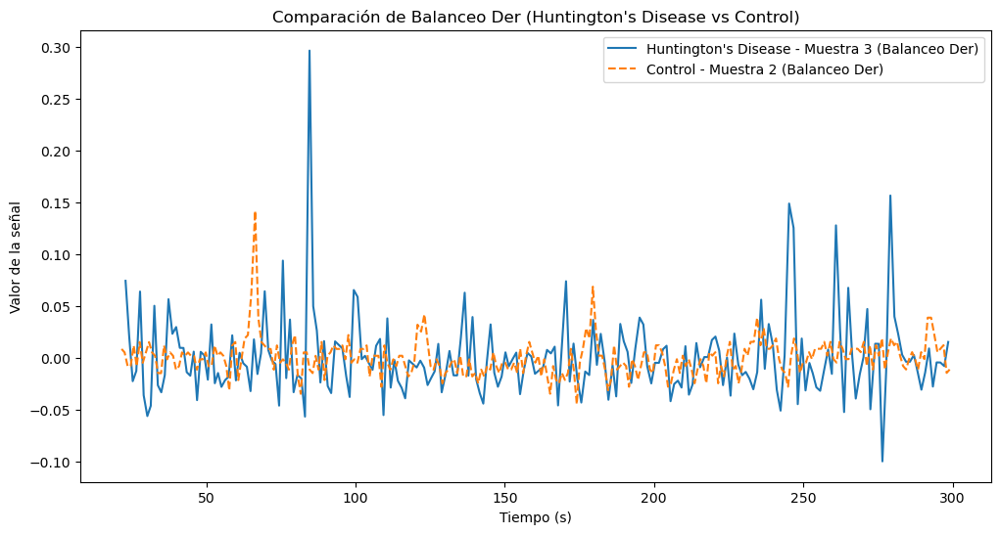

Comparando muestra 3 del grupo Huntington's Disease con muestra 3 del grupo Control:


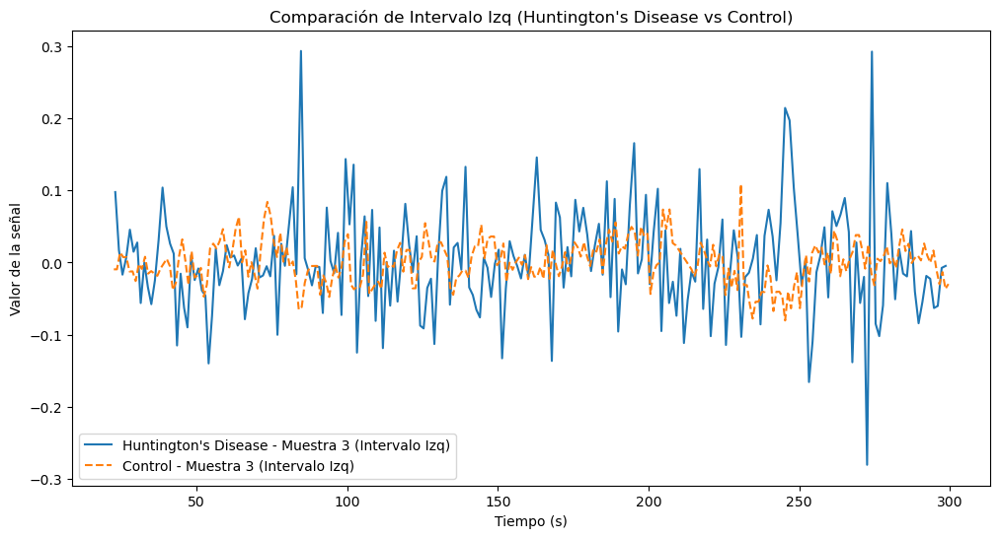

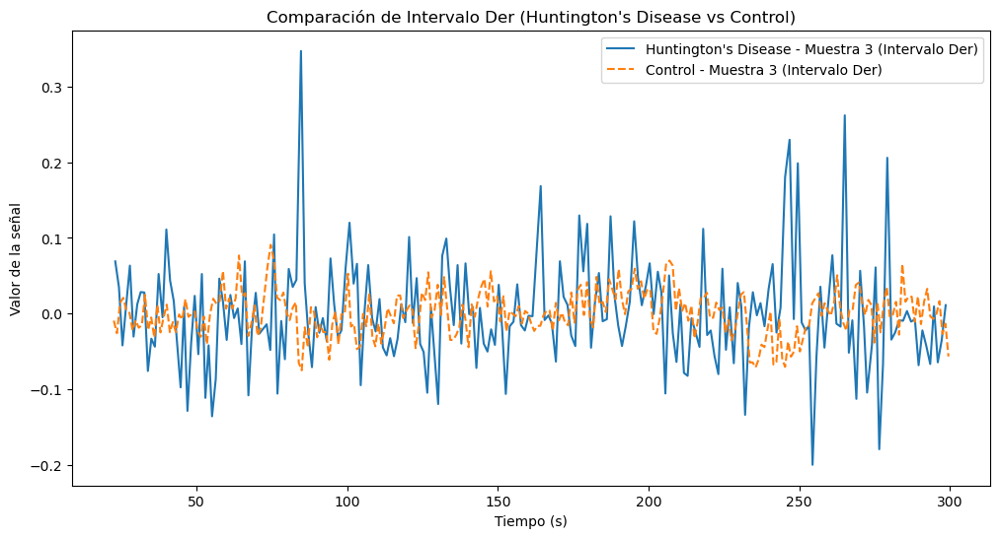

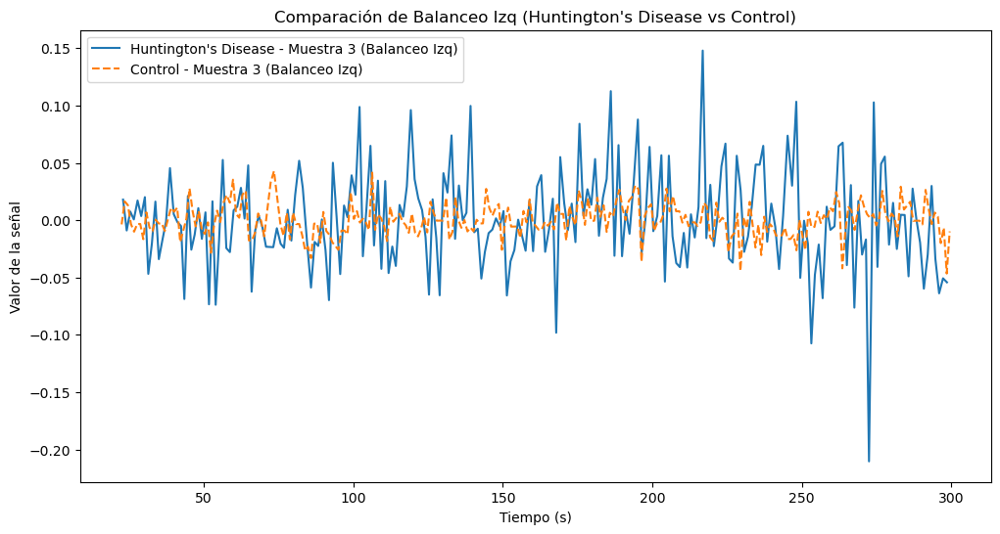

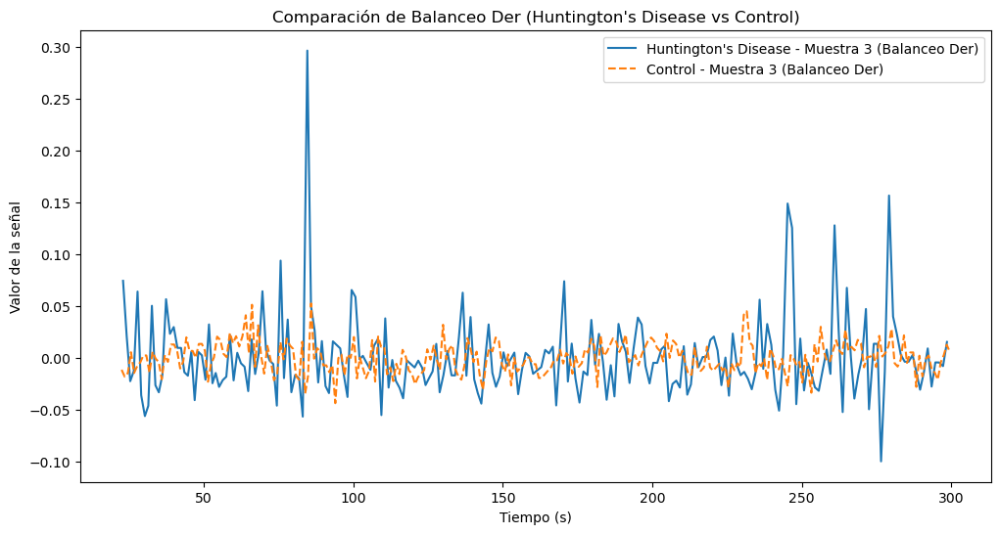


Comparando Parkinson's Disease con Control:
Comparando muestra 1 del grupo Parkinson's Disease con muestra 1 del grupo Control:


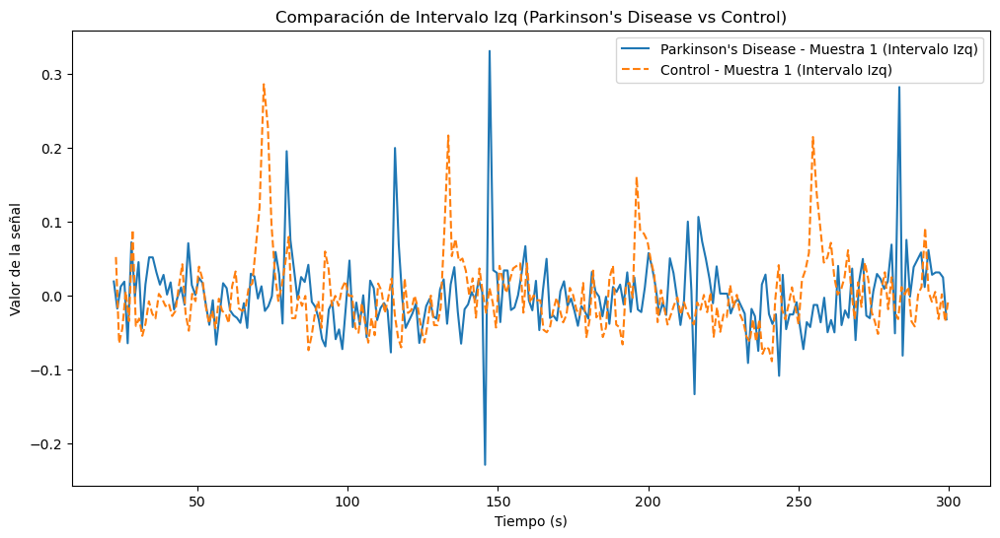

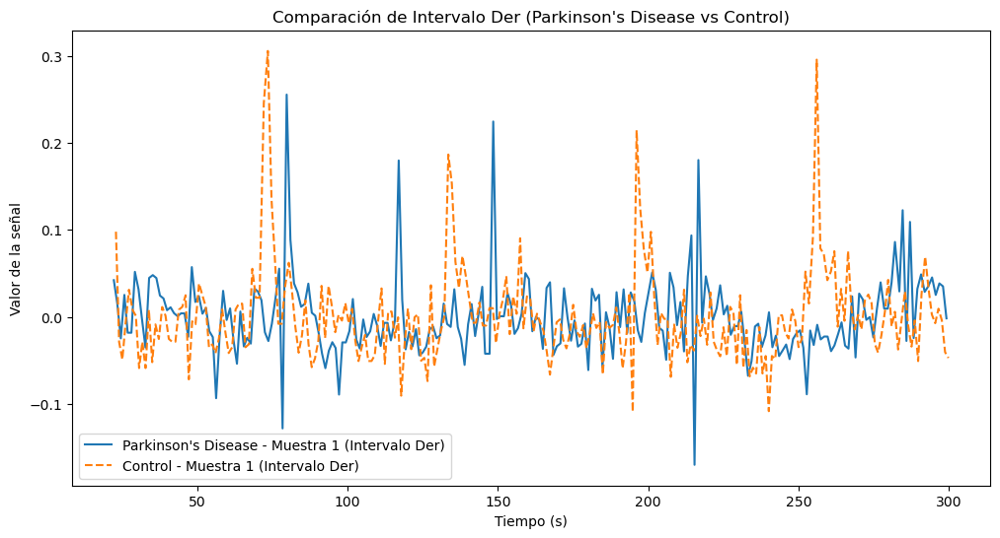

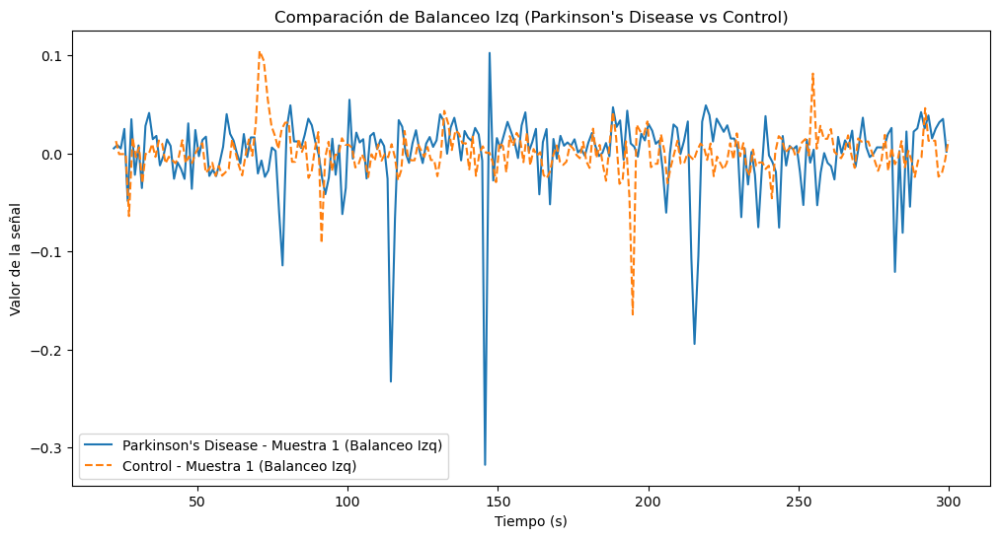

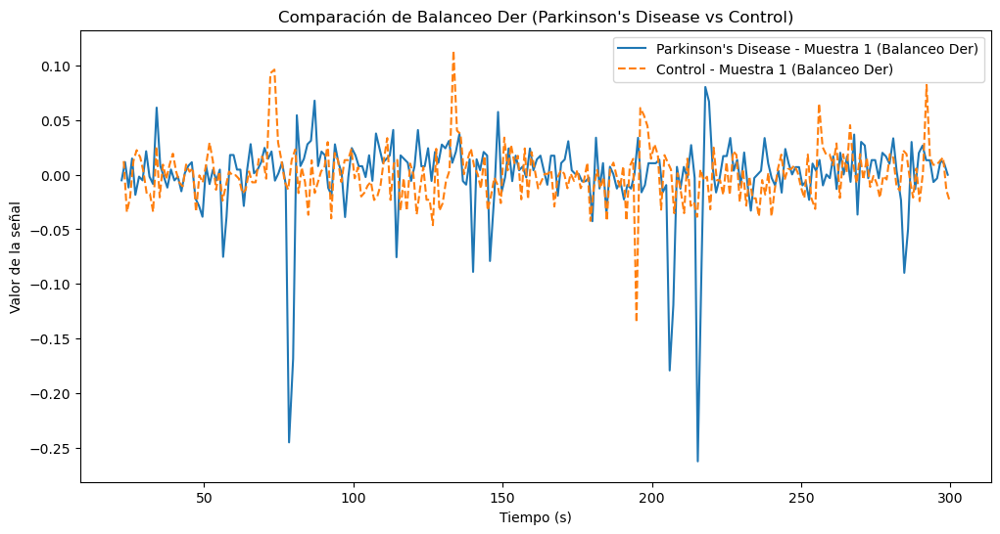

Comparando muestra 1 del grupo Parkinson's Disease con muestra 2 del grupo Control:


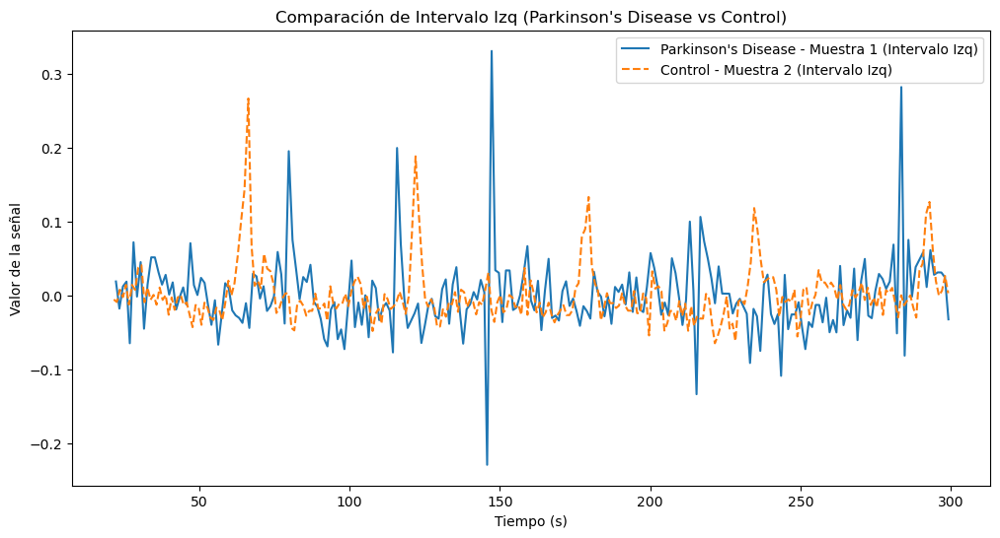

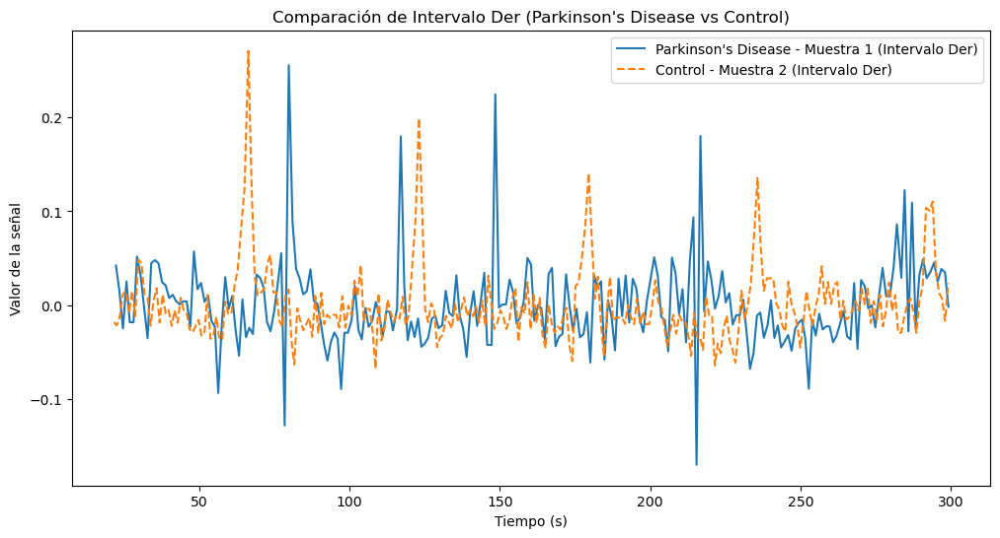

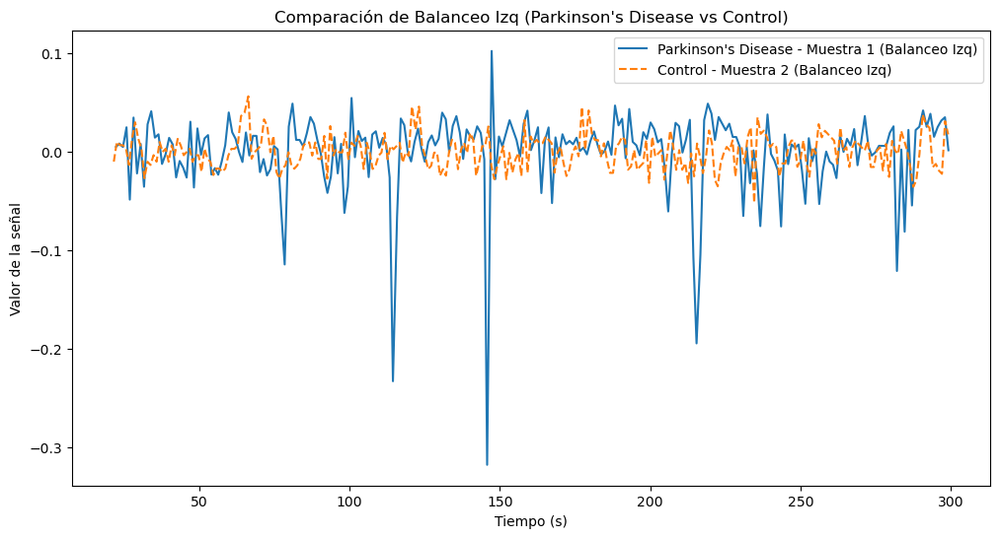

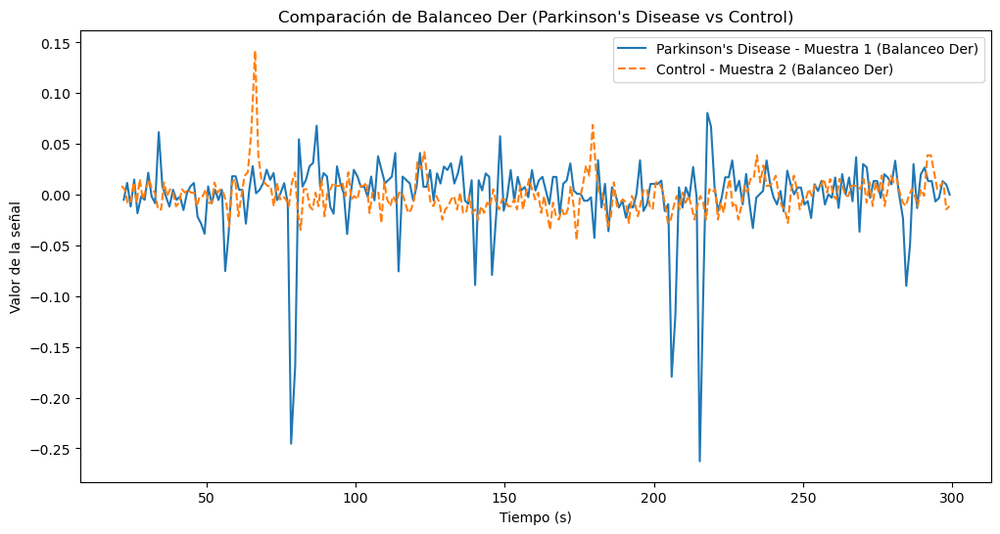

Comparando muestra 1 del grupo Parkinson's Disease con muestra 3 del grupo Control:


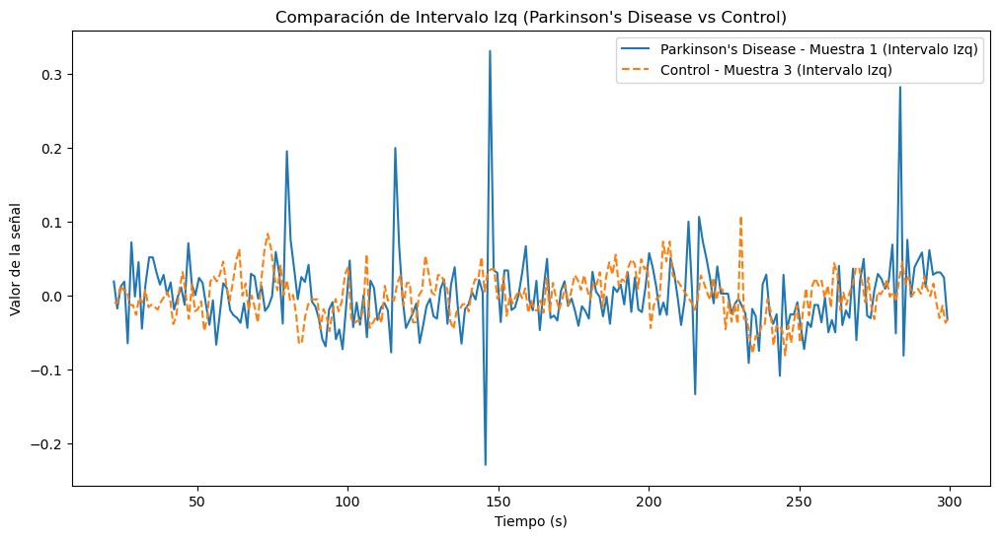

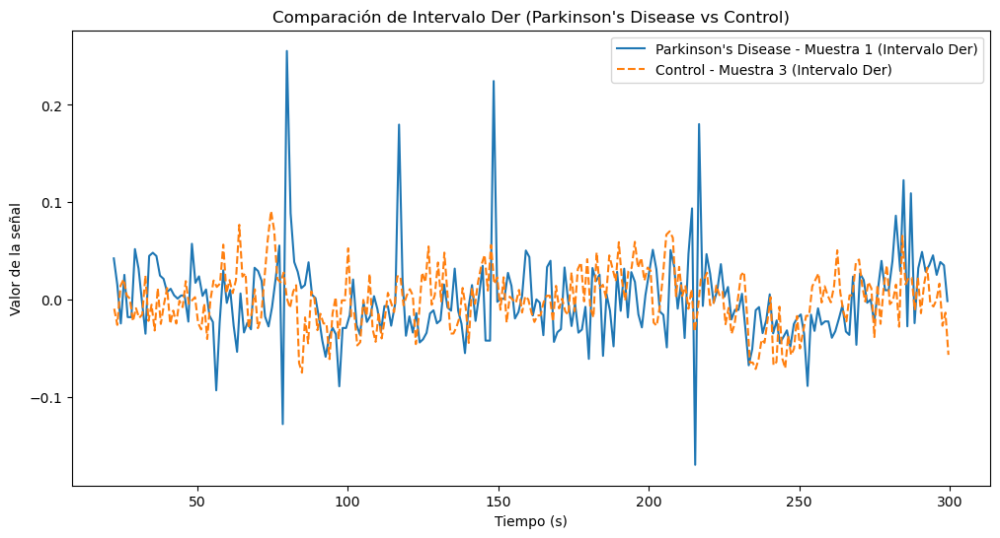

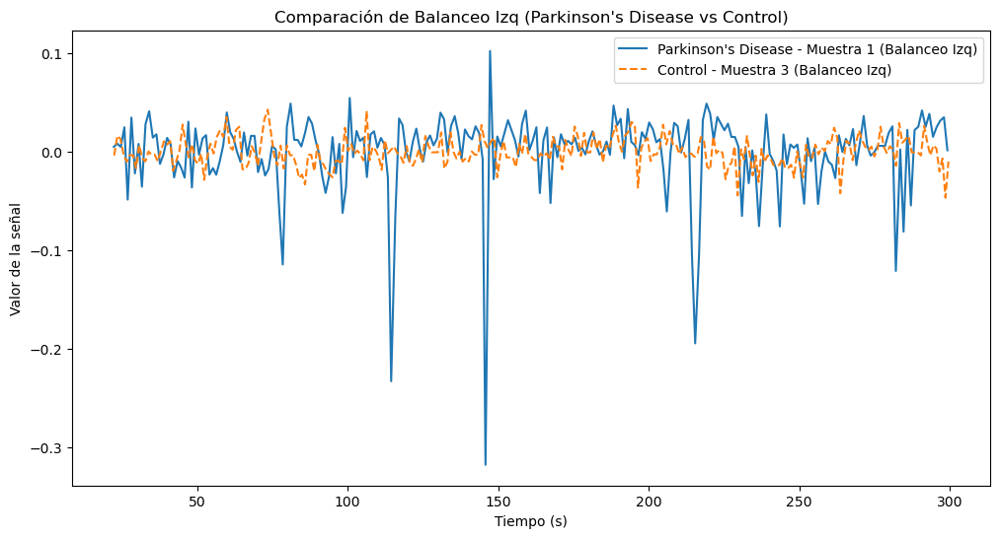

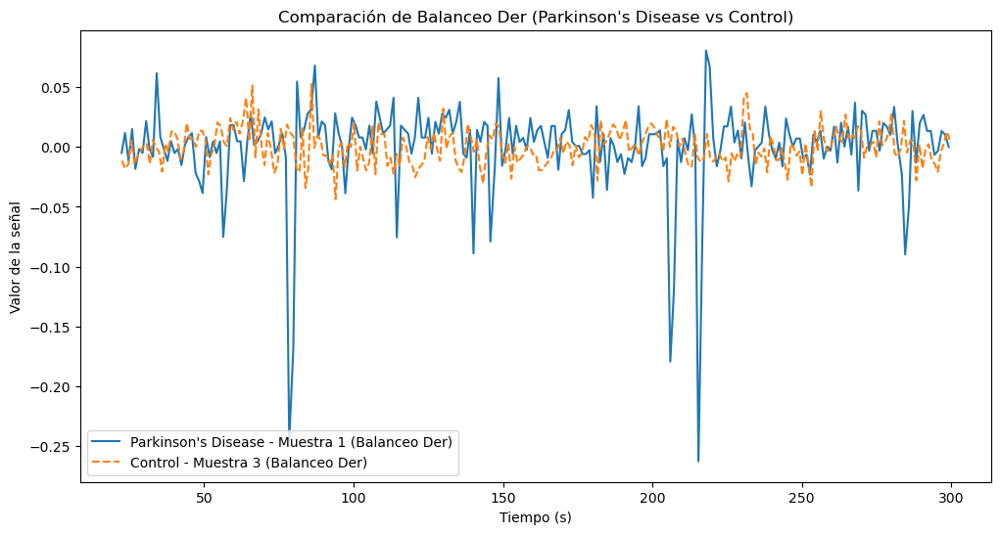

Comparando muestra 2 del grupo Parkinson's Disease con muestra 1 del grupo Control:


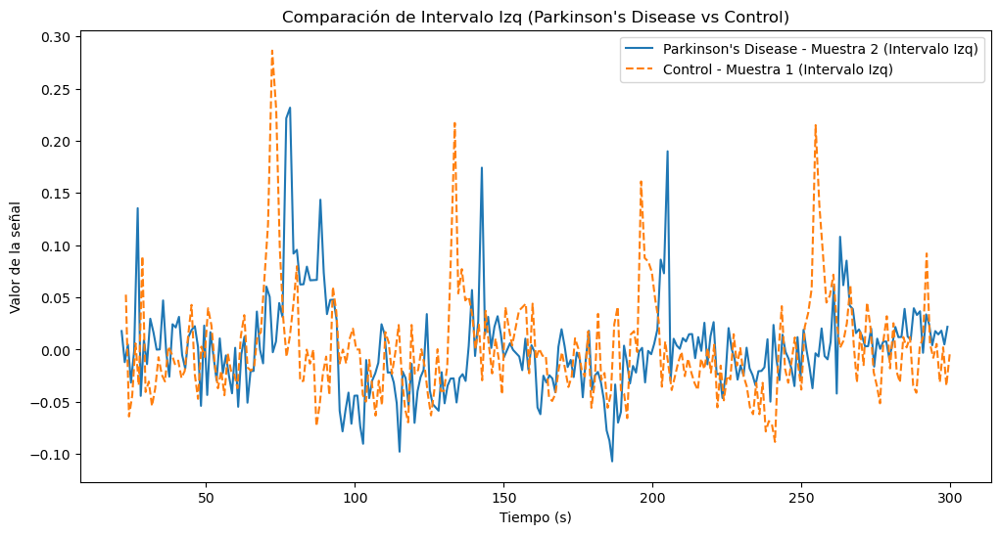

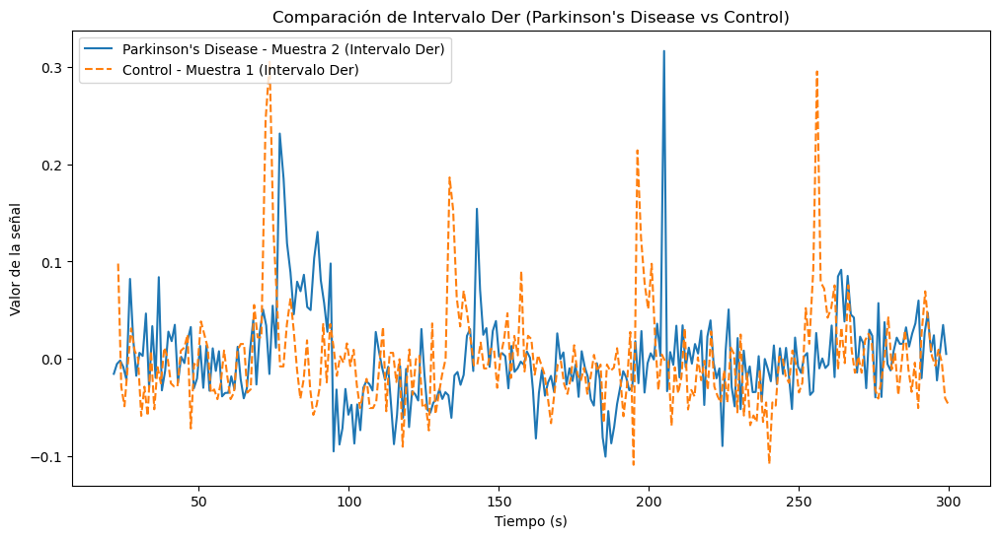

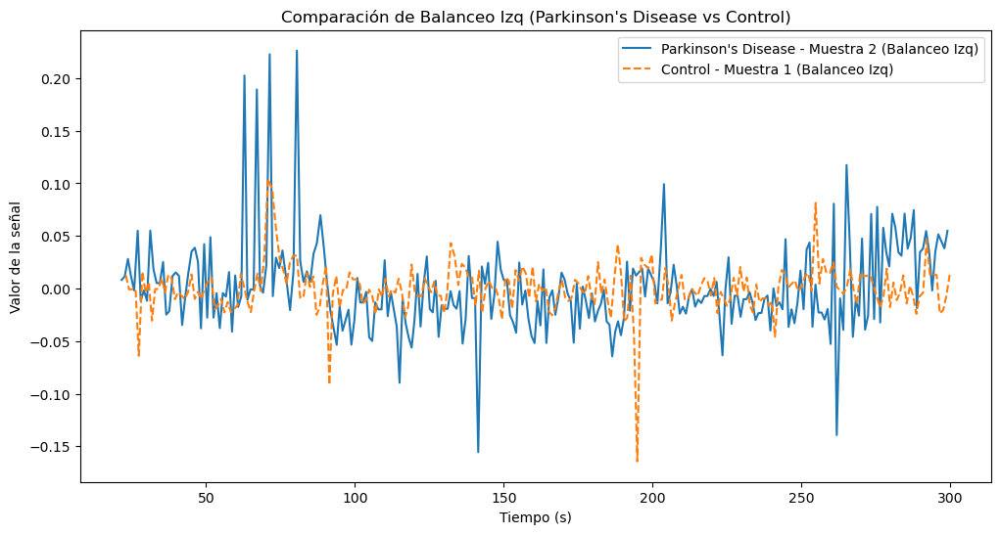

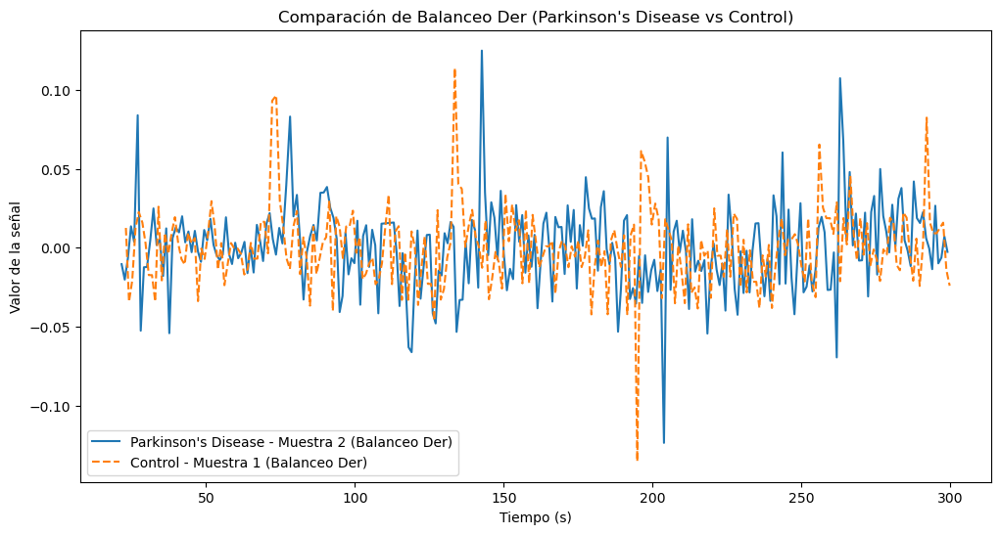

Comparando muestra 2 del grupo Parkinson's Disease con muestra 2 del grupo Control:


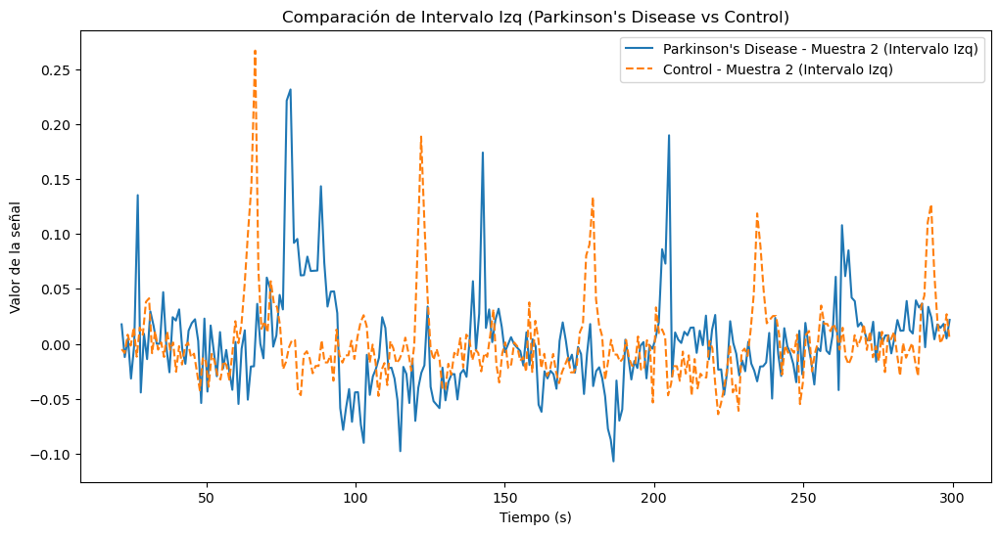

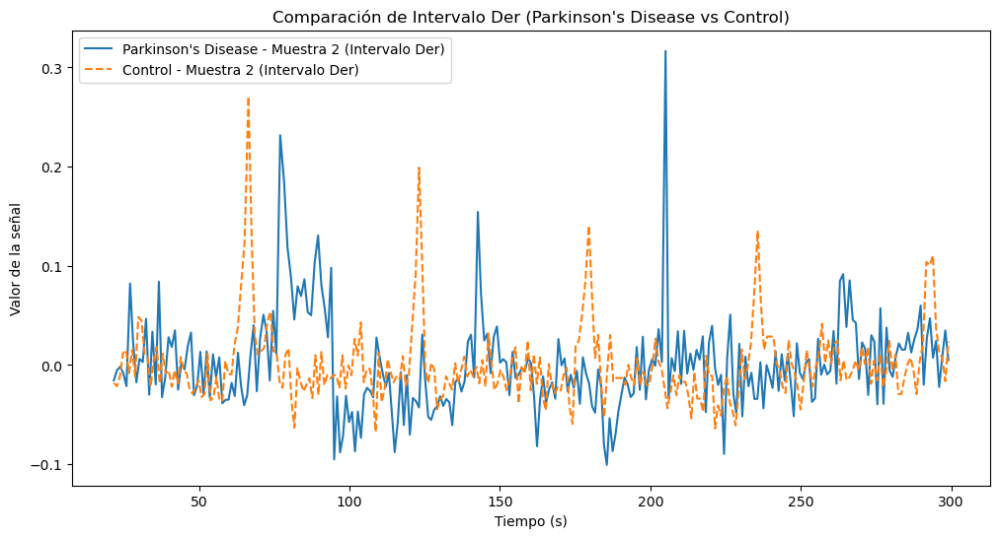

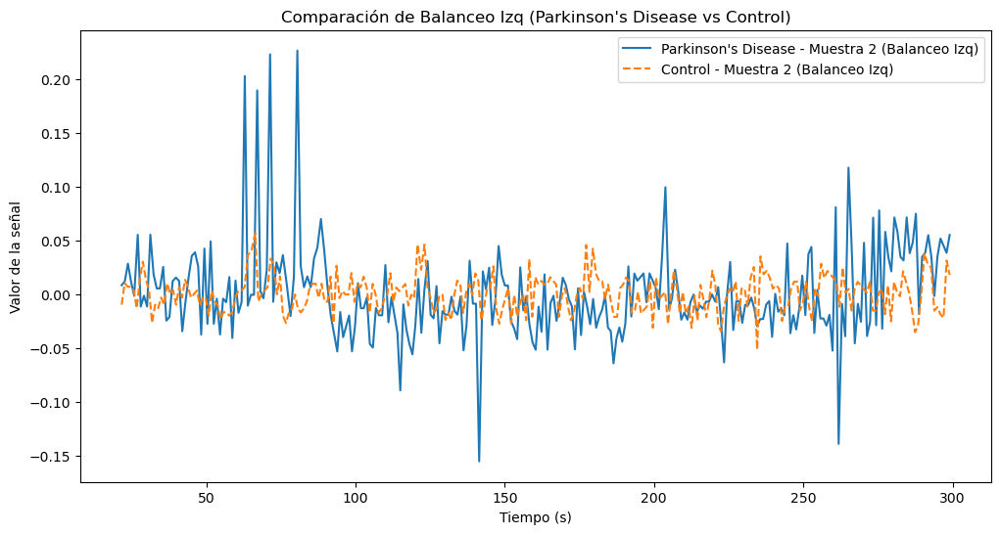

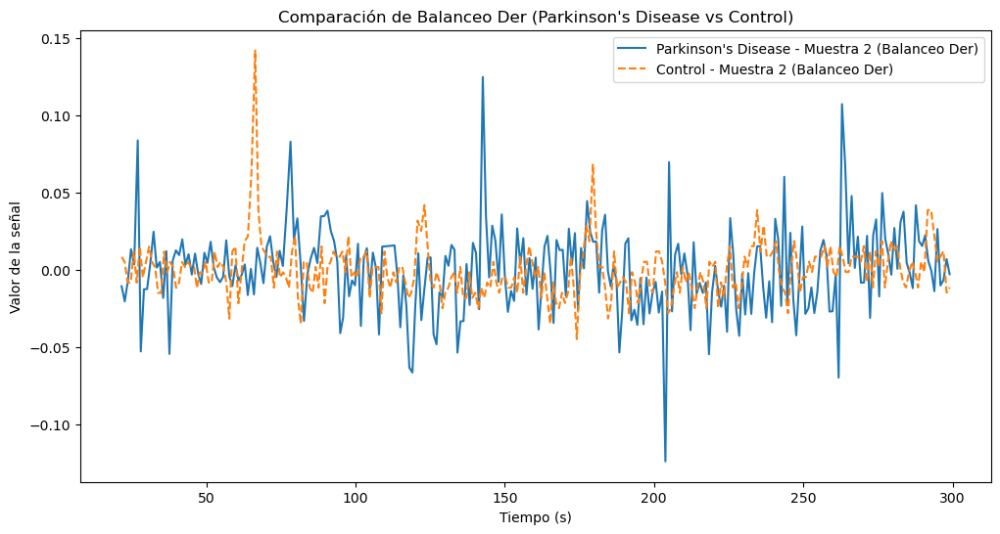

Comparando muestra 2 del grupo Parkinson's Disease con muestra 3 del grupo Control:


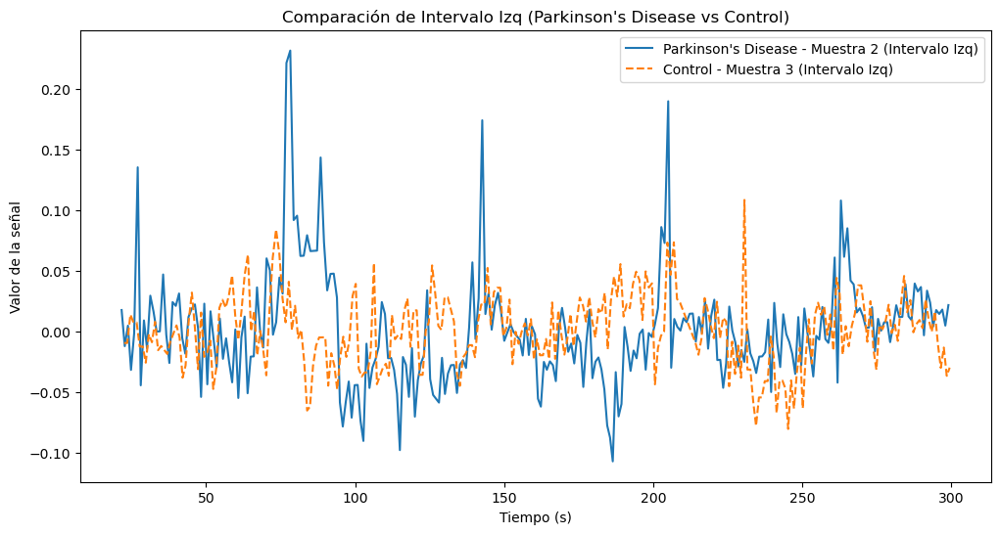

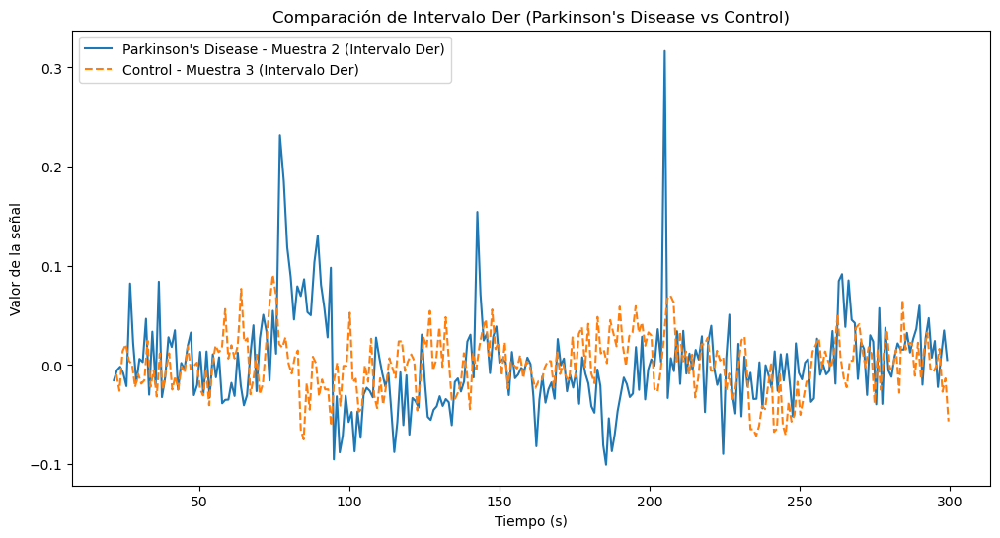

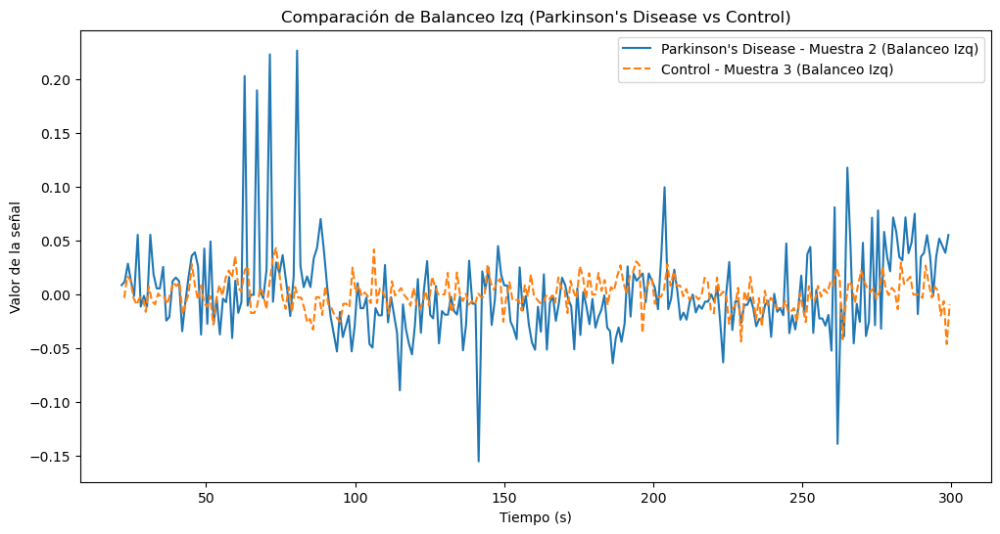

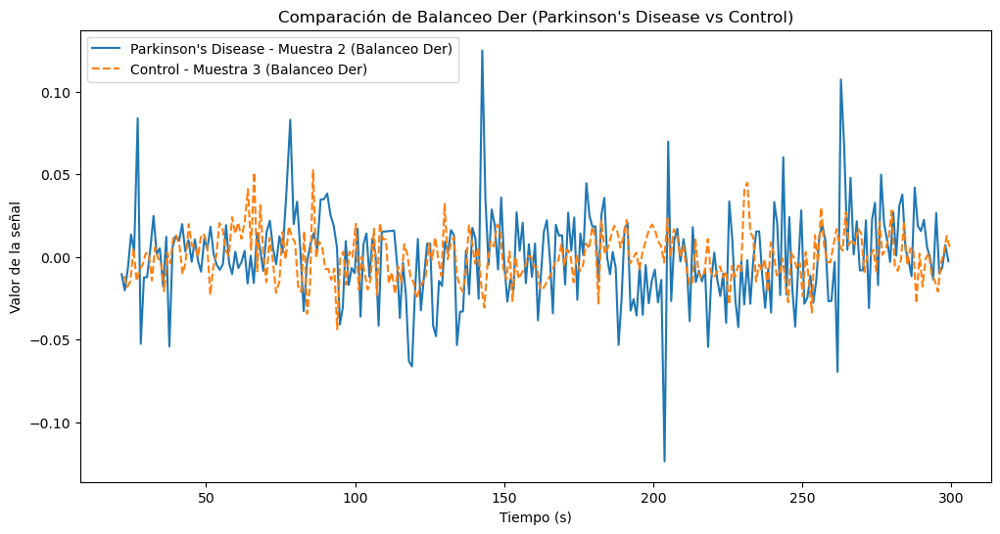

Comparando muestra 3 del grupo Parkinson's Disease con muestra 1 del grupo Control:


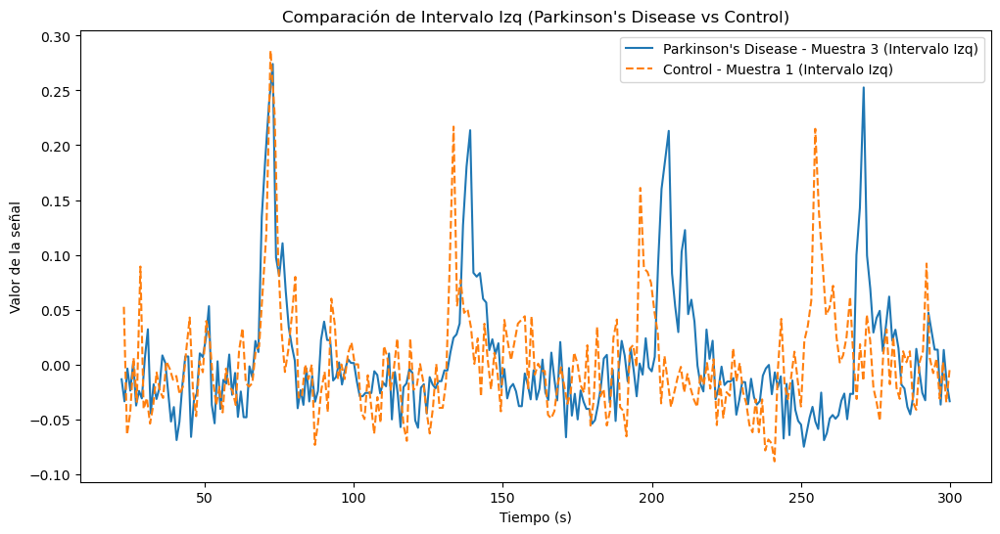

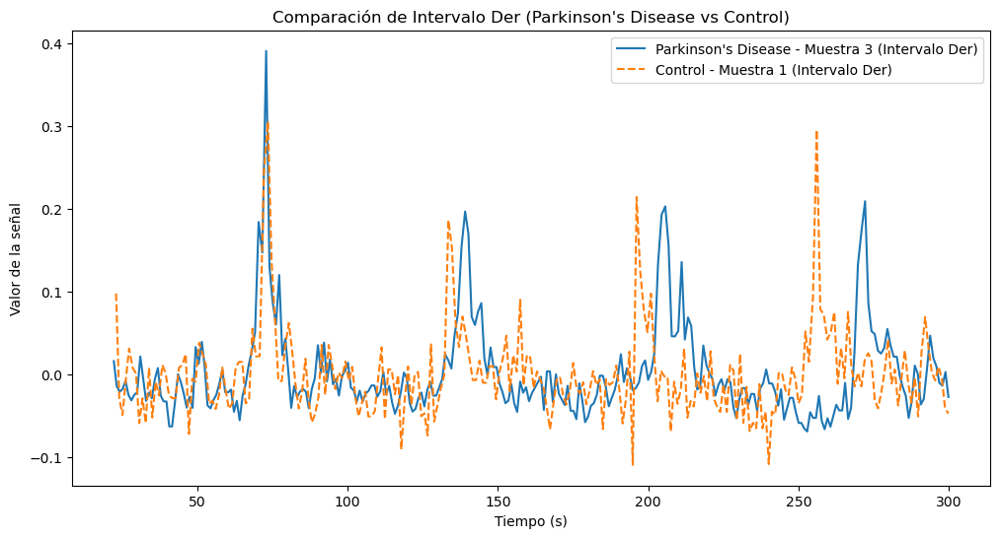

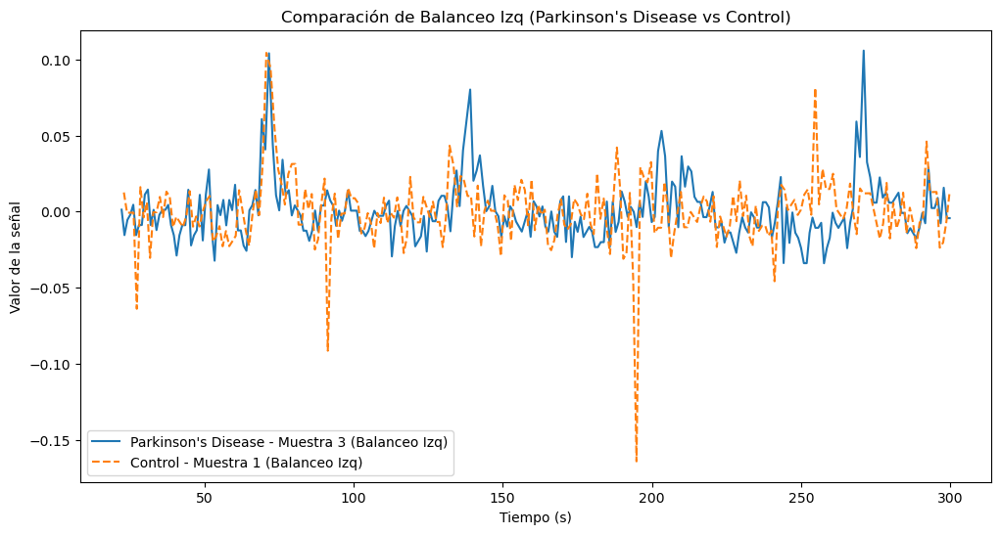

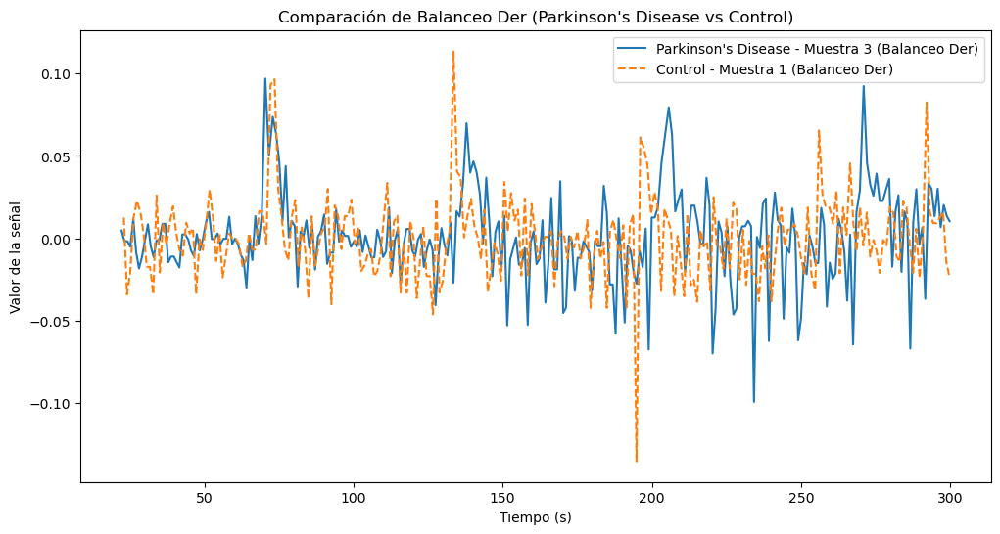

Comparando muestra 3 del grupo Parkinson's Disease con muestra 2 del grupo Control:


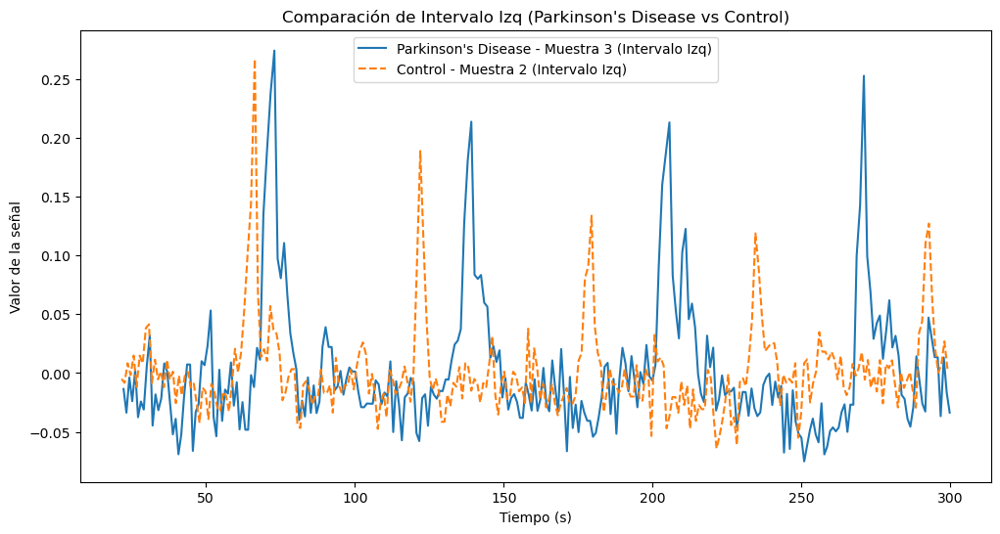

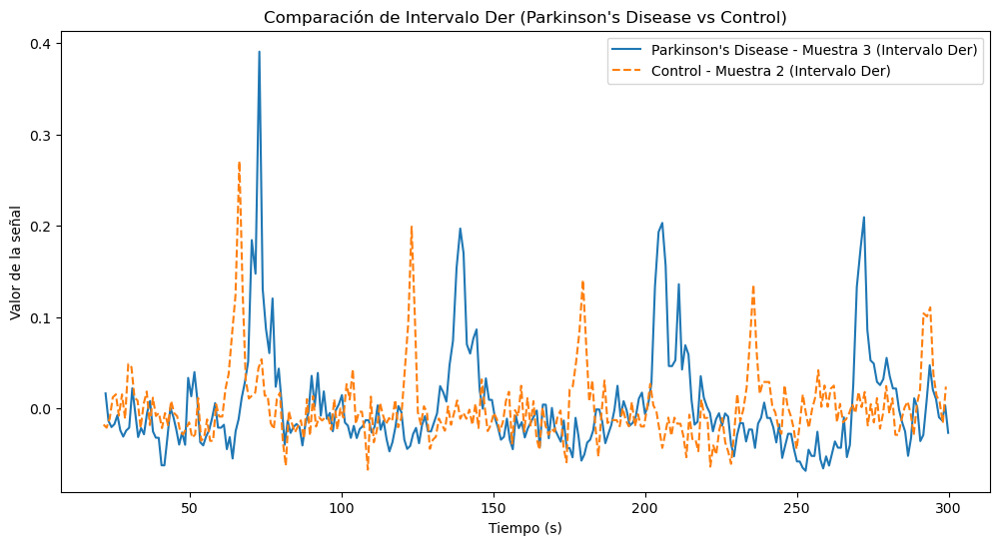

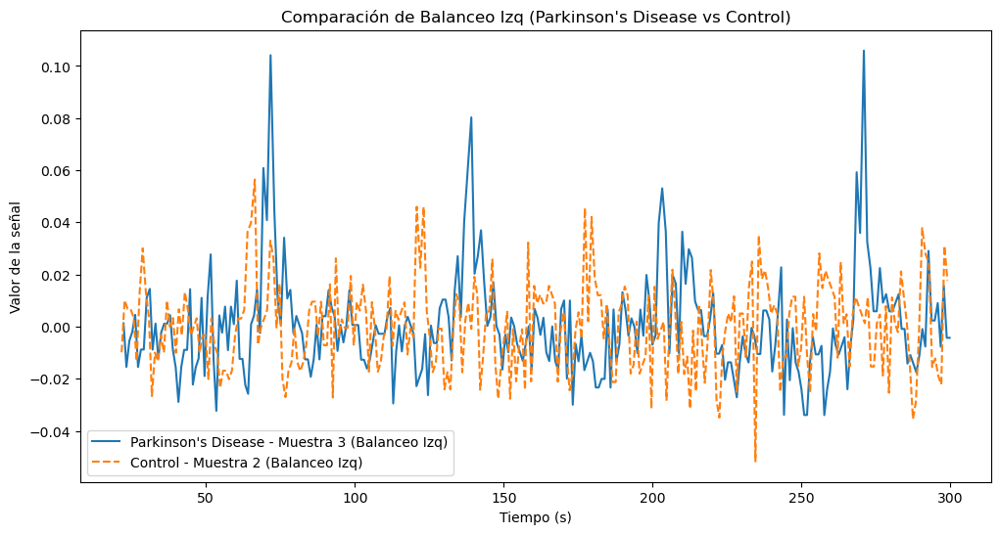

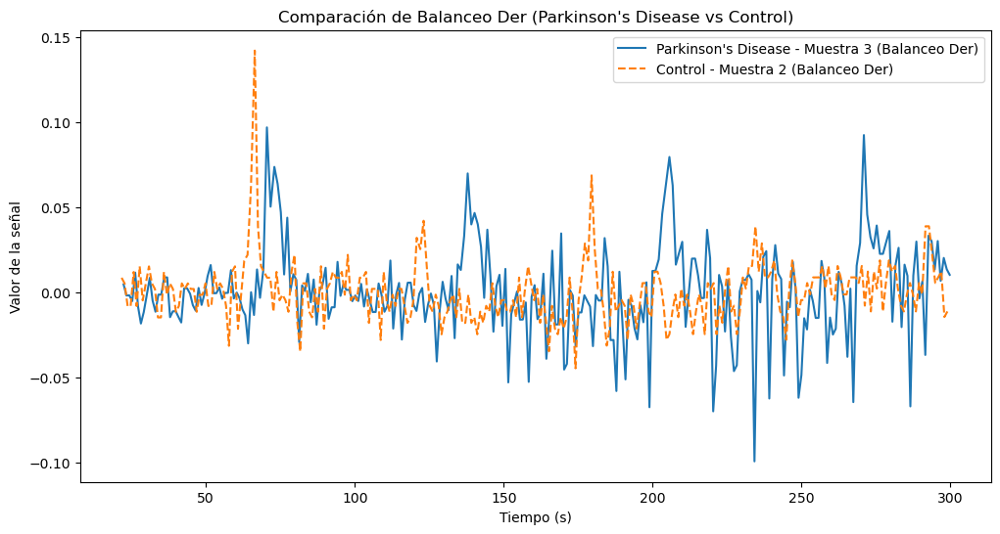

Comparando muestra 3 del grupo Parkinson's Disease con muestra 3 del grupo Control:


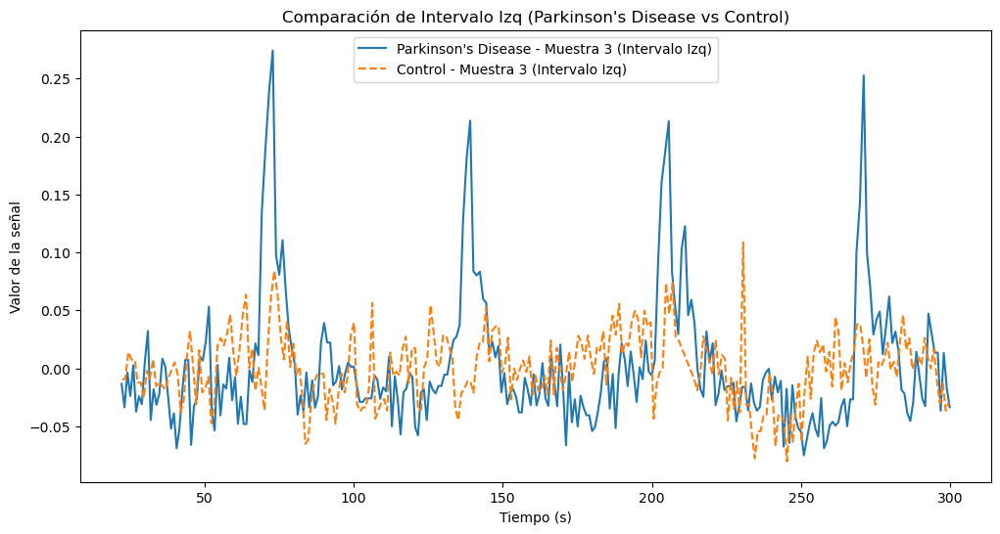

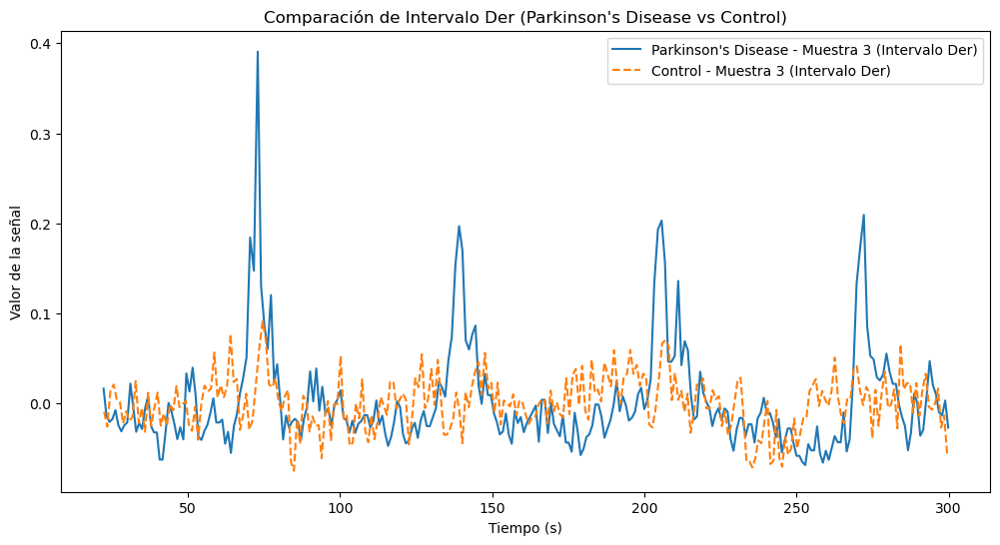

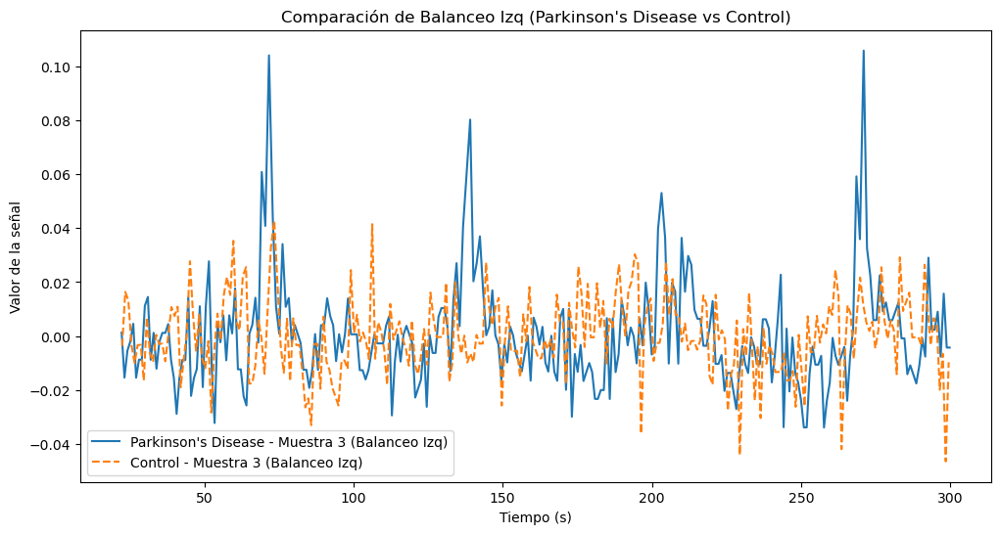

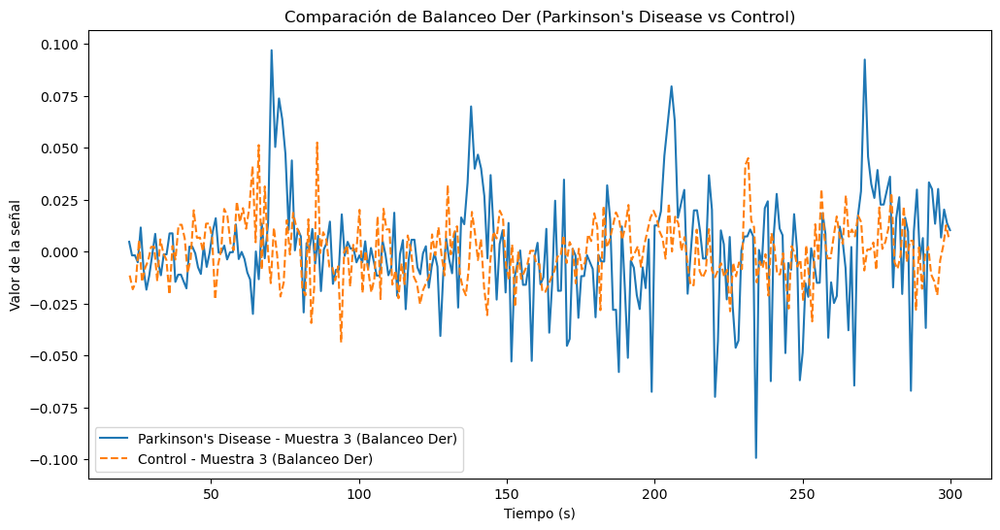

In [16]:
def cargar_senal_ts(archivo_ts, aplicar_detrend=True):
    # Cargar el archivo .ts
    datos = np.loadtxt(archivo_ts)
    
    # Extraer las columnas de interés (1: Tiempo, 2: Izquierdo, 3: Derecho, 4: Balanceo izquierdo, 5: Balanceo derecho)
    señales_interes = datos[:, [0, 1, 2, 3, 4]]
    
    # Aplicar detrend a las señales de interés (excepto a la columna del tiempo, que es la primera columna)
    if aplicar_detrend:
        for i in range(1, señales_interes.shape[1]):  # No aplicar detrend a la primera columna (tiempo)
            señales_interes[:, i] = detrend(señales_interes[:, i])
    
    return señales_interes

# Función para cargar y seleccionar muestras de cada grupo
def cargar_señales_desde_carpetas(ruta_base, aplicar_detrend=True, num_muestras=3):
    señales_por_grupo = {
        'Amyotrophic Lateral Sclerosis': [],
        'Control': [],
        'Huntington\'s Disease': [],
        'Parkinson\'s Disease': []
    }
    
    for grupo in señales_por_grupo.keys():
        carpeta_grupo = os.path.join(ruta_base, grupo)
        archivos = [f for f in os.listdir(carpeta_grupo) if f.endswith('.ts')]
        
        if len(archivos) > num_muestras:
            archivos = np.random.choice(archivos, num_muestras, replace=False)
        
        for archivo in archivos:
            ruta_archivo = os.path.join(carpeta_grupo, archivo)
            señales = cargar_senal_ts(ruta_archivo, aplicar_detrend=aplicar_detrend)
            señales_por_grupo[grupo].append(señales)
    
    return señales_por_grupo

# Función para comparar muestras entre el grupo de control y otros grupos
def comparar_muestras(grupos, nombre_grupo_control='Control', num_muestras=3):
    señales_control = grupos[nombre_grupo_control]
    
    for grupo, señales in grupos.items():
        if grupo == nombre_grupo_control:
            continue
        
        print(f"\nComparando {grupo} con {nombre_grupo_control}:")
        
        # Seleccionar solo un subconjunto de muestras
        if len(señales) > num_muestras:
            señales = np.random.choice(señales, num_muestras, replace=False)
        
        if len(señales_control) > num_muestras:
            señales_control = np.random.choice(señales_control, num_muestras, replace=False)
        
        # Comparar señales del grupo de interés con señales de control
        for i, señales_grupo in enumerate(señales):
            for j, señales_control_ind in enumerate(señales_control):
                print(f"Comparando muestra {i+1} del grupo {grupo} con muestra {j+1} del grupo {nombre_grupo_control}:")
                
                for k, nombre_señal in enumerate(['Intervalo Izq', 'Intervalo Der', 'Balanceo Izq', 'Balanceo Der']):
                    plt.figure(figsize=(12, 6))
                    plt.plot(señales_grupo[:, 0], señales_grupo[:, k+1], label=f'{grupo} - Muestra {i+1} ({nombre_señal})')
                    plt.plot(señales_control_ind[:, 0], señales_control_ind[:, k+1], label=f'{nombre_grupo_control} - Muestra {j+1} ({nombre_señal})', linestyle='--')
                    plt.title(f'Comparación de {nombre_señal} ({grupo} vs {nombre_grupo_control})')
                    plt.xlabel('Tiempo (s)')
                    plt.ylabel('Valor de la señal')
                    plt.legend()
                    plt.show()

# Ruta base donde están las carpetas de los grupos
ruta_base = r'C:\Users\santi\OneDrive\Escritorio\Bioseñales\Proyecto 1\Proyecto 1'
señales_grupos = cargar_señales_desde_carpetas(ruta_base, aplicar_detrend=True, num_muestras=3)

comparar_muestras(señales_grupos, nombre_grupo_control='Control', num_muestras=3)

# Se definen las funciones para el filtro Hampel, calculo de la entropía de permutación, calcular coeficiente de variación y desviación estándar, procesamiento de la señal para aplicar la función detrend y el filtro Hampel y la preparación de los datos para comparar.

El objetivo del código es realizar un análisis cuantitativo de las señales de marcha, utilizando diferentes métricas (como entropía de permutación, coeficiente de variación y desviación estándar) para identificar patrones y diferencias significativas entre los grupos. Finalmente, se carga la base de datos desde una ruta específica y se procesan las señales, generando un DataFrame con los resultados. Se preparan comparaciones específicas entre grupos para su análisis posterior, permitiendo a los investigadores obtener insights sobre cómo las condiciones neurológicas afectan la marcha.

In [19]:
warnings. filterwarnings('ignore')

def filtro_hampel(signal, window_size=7, n_sigmas=3):
    # Longitud de la señal
    n = len(signal)
    
    # Copiar la señal original para evitar modificarla directamente
    signal_filtered = signal.copy()
    
    # Aplicar el filtro Hampel a cada punto
    for i in range(window_size, n - window_size):
        # Definir la ventana local
        window = signal[i - window_size:i + window_size + 1]
        # Calcular la mediana y la desviación mediana absoluta (MAD)
        median = np.median(window)
        mad = robust.mad(window)
        
        # Si el valor se desvía más de n_sigmas veces la MAD, reemplazarlo
        if np.abs(signal[i] - median) > n_sigmas * mad:
            signal_filtered[i] = median  # Se puede sustituir por la mediana local

    return signal_filtered

def calcular_entropia_permutacion(senal_marcha, m=3, delay=1):
    n = len(senal_marcha)
    
    # Generar los patrones ordinales de la señal
    patrones = []
    for i in range(n - (m - 1) * delay):
        subserie = senal_marcha[i:(i + (m - 1) * delay + 1):delay]
        patrones.append(tuple(np.argsort(subserie)))  # Obtener el patrón ordinal
    
    # Contar la frecuencia de aparición de cada patrón ordinal
    contador_patrones = Counter(patrones)
    
    # Convertir las frecuencias a probabilidades
    total_patrones = sum(contador_patrones.values())
    probabilidades = np.array(list(contador_patrones.values())) / total_patrones
    
    # Calcular la entropía de Shannon para los patrones ordinales
    entropia_permutacion = -np.sum(probabilidades * np.log2(probabilidades))
    
    # Normalizar por la entropía máxima posible
    entropia_maxima = np.log2(np.math.factorial(m))
    entropia_permutacion_normalizada = entropia_permutacion / entropia_maxima
    
    return entropia_permutacion_normalizada

def calcular_cv_sd(senal_marcha):
    # Calcular la media de la señal
    media = np.mean(senal_marcha)
    
    # Calcular la desviación estándar (SD)
    sd = np.std(senal_marcha, ddof=1)  # ddof=1 para usar la fórmula de la muestra
    
    # Calcular el coeficiente de variación (CV)
    if media != 0:
        cv = sd / media
    else:
        cv = np.nan  # Para evitar división por cero
    
    return cv, sd

def procesar_senal(archivo):
    # Cargar el archivo .ts
    datos = np.loadtxt(archivo)
    
    # Extraer las columnas de interés
    tiempo = datos[:, 0]
    intervalo_izq = datos[:, 1]
    intervalo_der = datos[:, 2]
    balanceo_izq = datos[:, 3]
    balanceo_der = datos[:, 4]
    
    # Eliminar tendencia de las señales usando detrend
    intervalo_izq = detrend(intervalo_izq)
    intervalo_der = detrend(intervalo_der)
    balanceo_izq = detrend(balanceo_izq)
    balanceo_der = detrend(balanceo_der)
    
    # Aplicar filtro de Hampel para eliminar datos atípicos (supuesto que ya tienes la función hampel)
    intervalo_izq = filtro_hampel(intervalo_izq)
    intervalo_der = filtro_hampel(intervalo_der)
    balanceo_izq = filtro_hampel(balanceo_izq)
    balanceo_der = filtro_hampel(balanceo_der)
    
    return intervalo_izq, intervalo_der, balanceo_izq, balanceo_der

def calcular_indices(intervalo_izq, intervalo_der, balanceo_izq, balanceo_der):
    # Calcular entropía de permutación
    ent_intervalo_izq = calcular_entropia_permutacion(intervalo_izq)
    ent_intervalo_der = calcular_entropia_permutacion(intervalo_der)
    ent_balanceo_izq = calcular_entropia_permutacion(balanceo_izq)
    ent_balanceo_der = calcular_entropia_permutacion(balanceo_der)
    
    # Calcular CV y SD para cada señal de marcha
    cv_intervalo_izq, sd_intervalo_izq = calcular_cv_sd(intervalo_izq)
    cv_intervalo_der, sd_intervalo_der = calcular_cv_sd(intervalo_der)
    cv_balanceo_izq, sd_balanceo_izq = calcular_cv_sd(balanceo_izq)
    cv_balanceo_der, sd_balanceo_der = calcular_cv_sd(balanceo_der)

    
    return {
        "ent_intervalo_izq": ent_intervalo_izq,
        "ent_intervalo_der": ent_intervalo_der,
        "ent_balanceo_izq": ent_balanceo_izq,
        "ent_balanceo_der": ent_balanceo_der,
        "cv_intervalo_izq": cv_intervalo_izq,
        "cv_intervalo_der": cv_intervalo_der,
        "cv_balanceo_izq": cv_balanceo_izq,
        "cv_balanceo_der": cv_balanceo_der,
        "sd_intervalo_izq": sd_intervalo_izq,
        "sd_intervalo_der": sd_intervalo_der,
        "sd_balanceo_izq": sd_balanceo_izq,
        "sd_balanceo_der": sd_balanceo_der
    }

def procesar_base_datos(ruta_base):
    # Definir las carpetas por grupo
    grupos = ['Amyotrophic Lateral Sclerosis', 'Control', 'Huntington\'s Disease', 'Parkinson\'s Disease']
    
    # Crear un DataFrame vacío para almacenar los resultados
    df_resultados = pd.DataFrame(columns=[
        "Sujeto", "Estado", "ent_intervalo_izq", "ent_intervalo_der", "ent_balanceo_izq", "ent_balanceo_der",
        "cv_intervalo_izq", "cv_intervalo_der", "cv_balanceo_izq", "cv_balanceo_der",
        "sd_intervalo_izq", "sd_intervalo_der", "sd_balanceo_izq", "sd_balanceo_der"
    ])
    
    # Recorrer cada carpeta (grupo poblacional)
    for grupo in grupos:
        ruta_grupo = os.path.join(ruta_base, grupo)
        archivos = os.listdir(ruta_grupo)
        
        # Recorrer cada archivo del grupo
        for archivo in archivos:
            if archivo.endswith('.ts'):  # Solo procesar archivos .ts
                ruta_archivo = os.path.join(ruta_grupo, archivo)
                sujeto = archivo.split('.')[0]  # Extraer el nombre del sujeto
                
                # Procesar el archivo y extraer señales
                intervalo_izq, intervalo_der, balanceo_izq, balanceo_der = procesar_senal(ruta_archivo)
                
                # Calcular los índices
                indices = calcular_indices(intervalo_izq, intervalo_der, balanceo_izq, balanceo_der)
                
                # Agregar los resultados al DataFrame
                df_resultados = df_resultados.append({
                    "Sujeto": sujeto,
                    "Estado": grupo,
                    **indices
                }, ignore_index=True)
    
    return df_resultados

def seleccionar_sujetos(df, n_sujetos_control=13, n_sujetos_enfermos=13):
    """
    Selecciona aleatoriamente sujetos del grupo Control y sujetos de cada grupo enfermo.
    """
    # Seleccionar sujetos de control
    sujetos_control = df[df['Estado'] == 'Control'].sample(n_sujetos_control, random_state=42)
    
    # Seleccionar sujetos enfermos (ALS, Huntington, Parkinson)
    sujetos_als = df[df['Estado'] == 'Amyotrophic Lateral Sclerosis'].sample(n_sujetos_enfermos, random_state=42)
    sujetos_huntington = df[df['Estado'] == 'Huntington\'s Disease'].sample(n_sujetos_enfermos, random_state=42)
    sujetos_parkinson = df[df['Estado'] == 'Parkinson\'s Disease'].sample(n_sujetos_enfermos, random_state=42)
    
    return sujetos_control, sujetos_als, sujetos_huntington, sujetos_parkinson

def preparar_datos_comparacion(df, n_sujetos_control=13, n_sujetos_enfermos=13):
    """
    Prepara los datos para las pruebas estadísticas comparando los sujetos seleccionados de Control
    con los sujetos seleccionados de ALS, Huntington y Parkinson.
    """
    # Seleccionar sujetos
    sujetos_control, sujetos_als, sujetos_huntington, sujetos_parkinson = seleccionar_sujetos(df, n_sujetos_control, n_sujetos_enfermos)
    
    # Crear DataFrames separados para cada grupo de comparación
    comparaciones = {
        'Control_vs_ALS': pd.concat([sujetos_control, sujetos_als]),
        'Control_vs_Huntington': pd.concat([sujetos_control, sujetos_huntington]),
        'Control_vs_Parkinson': pd.concat([sujetos_control, sujetos_parkinson])
    }
    
    return comparaciones

ruta_base_datos = r'C:\Users\santi\OneDrive\Escritorio\Bioseñales\Proyecto 1\Proyecto 1'
df_resultados = procesar_base_datos(ruta_base_datos)

# Ejecutar la preparación de datos
comparaciones = preparar_datos_comparacion(df_resultados)

# Mostrar un ejemplo de comparación
print(comparaciones['Control_vs_ALS'].head())

       Sujeto   Estado  ent_intervalo_izq  ent_intervalo_der  \
13   control1  Control           0.981207           0.997151   
14  control10  Control           0.992512           0.995972   
18  control14  Control           0.996663           0.993607   
27   control8  Control           0.977824           0.994937   
26   control7  Control           0.993773           0.997632   

    ent_balanceo_izq  ent_balanceo_der  cv_intervalo_izq  cv_intervalo_der  \
13          0.998340          0.991450        -68.592022        -26.759285   
14          0.993809          0.963409         -7.444374         -7.858207   
18          0.995425          0.995228        -14.471377        -11.315990   
27          0.983411          0.992234         -4.417356         -5.670673   
26          0.992534          0.988888         -5.988756         -4.071729   

    cv_balanceo_izq  cv_balanceo_der  sd_intervalo_izq  sd_intervalo_der  \
13        12.080083        24.628099          0.031805          0.0306

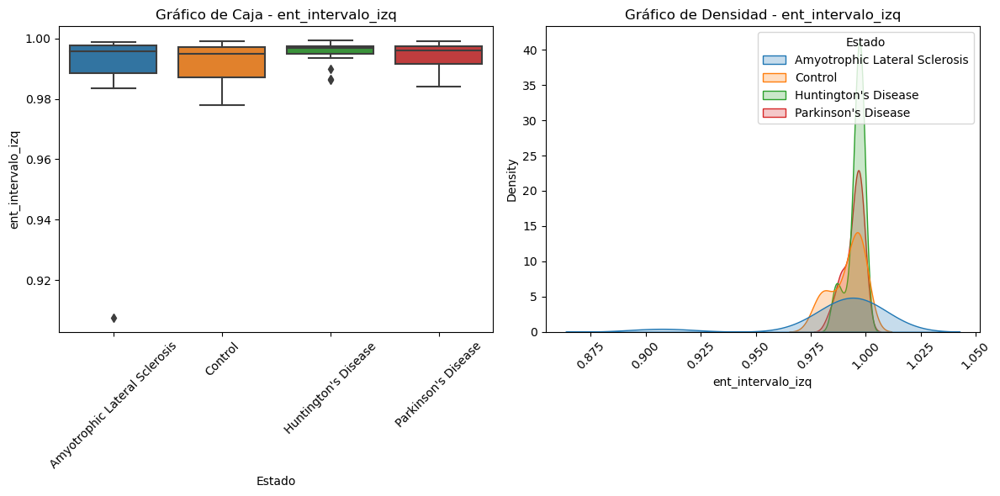

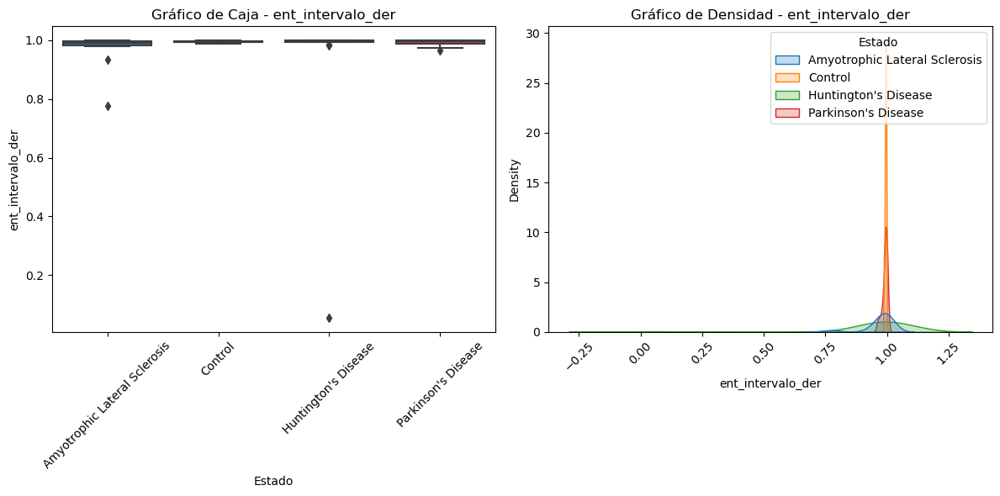

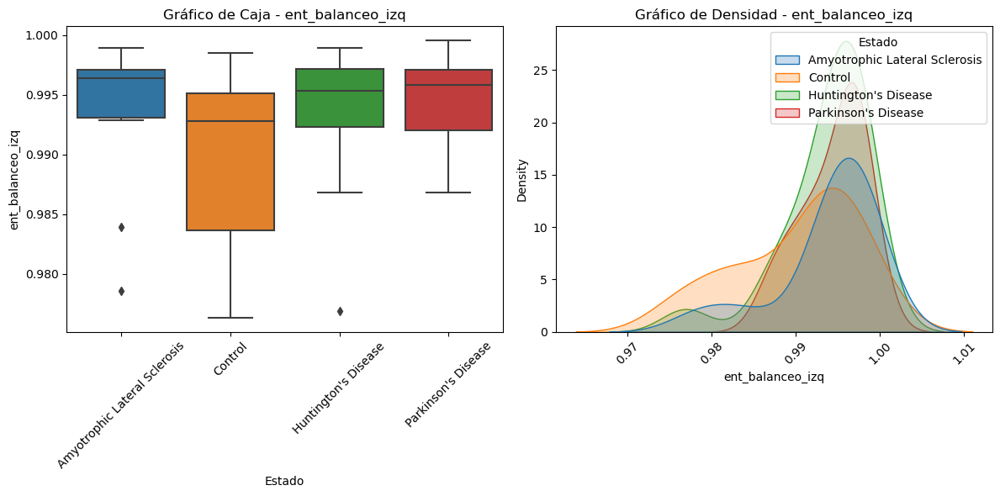

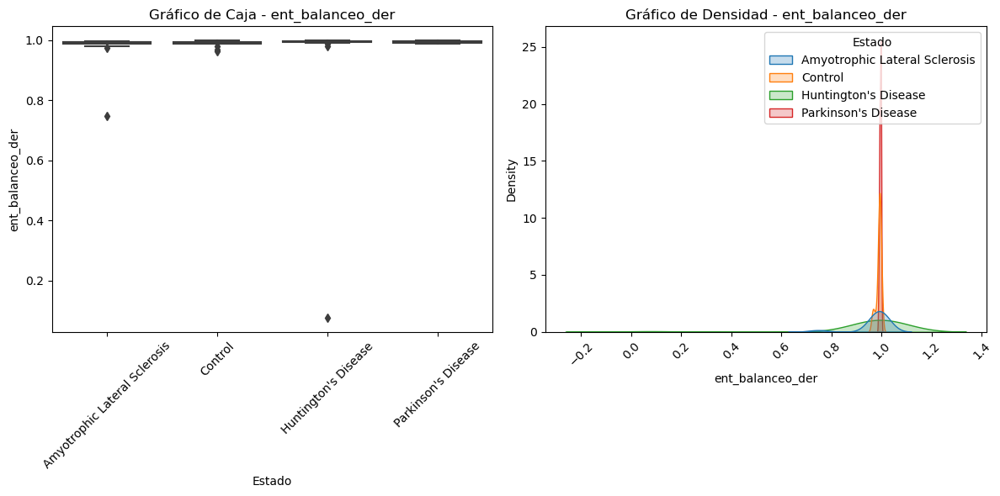

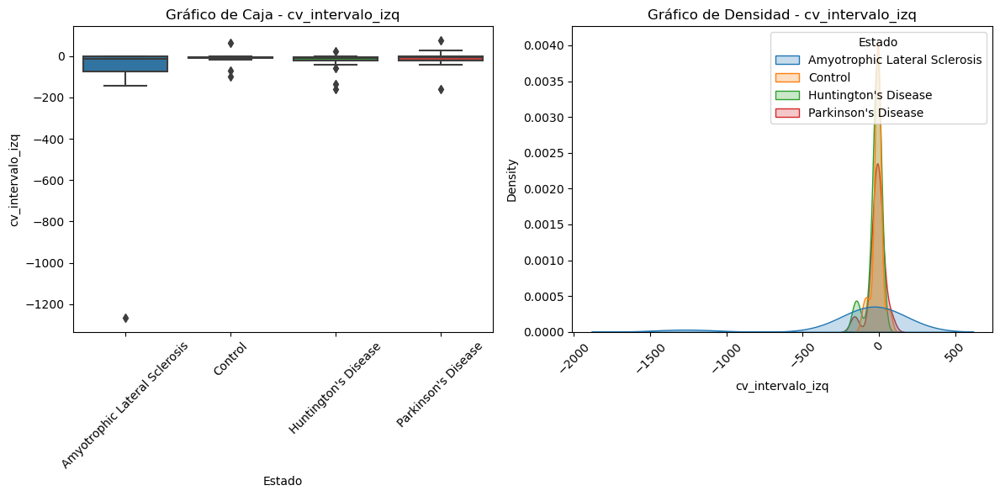

...

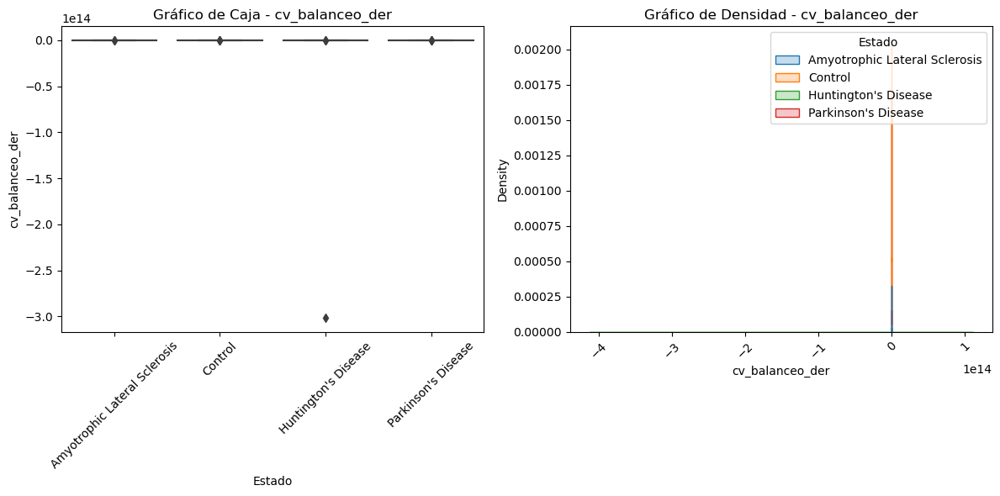

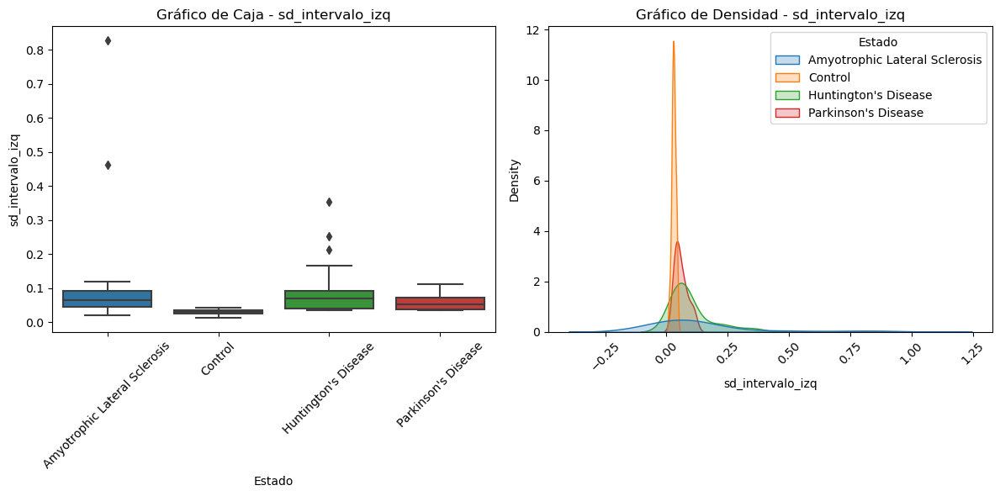

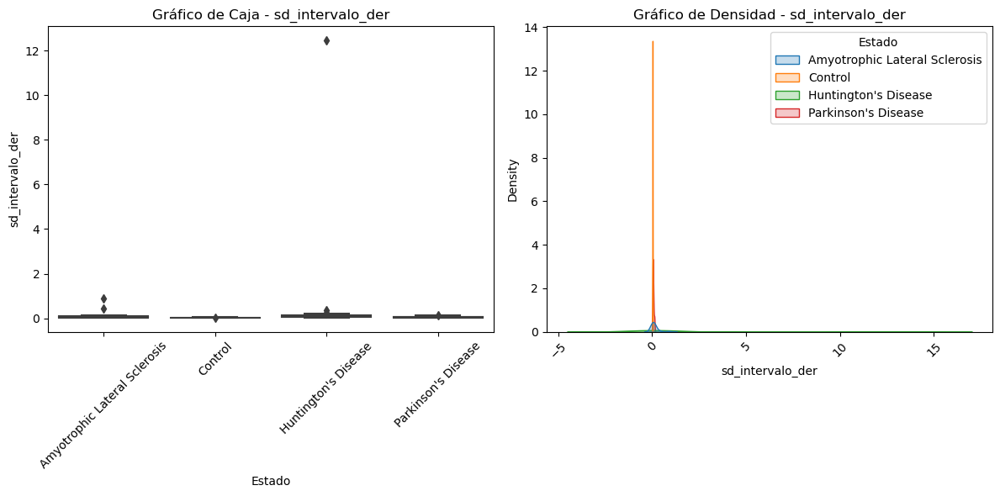

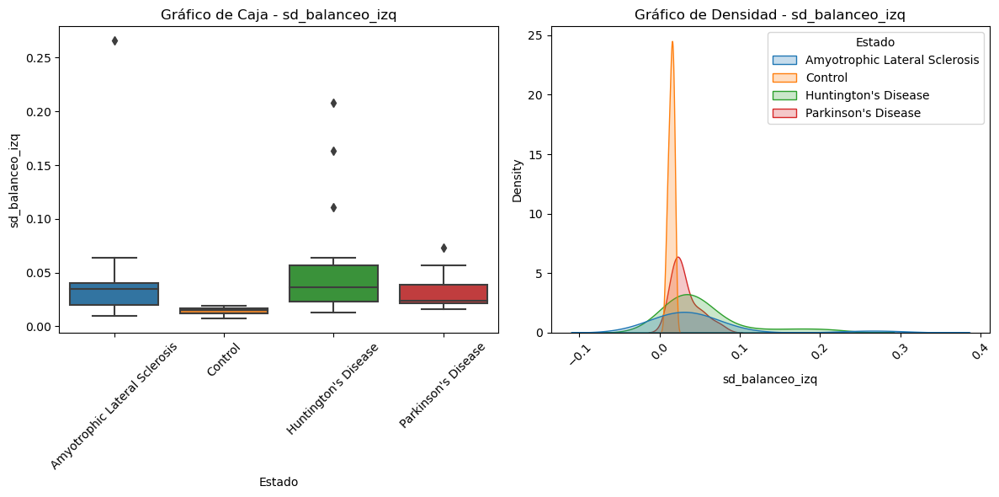

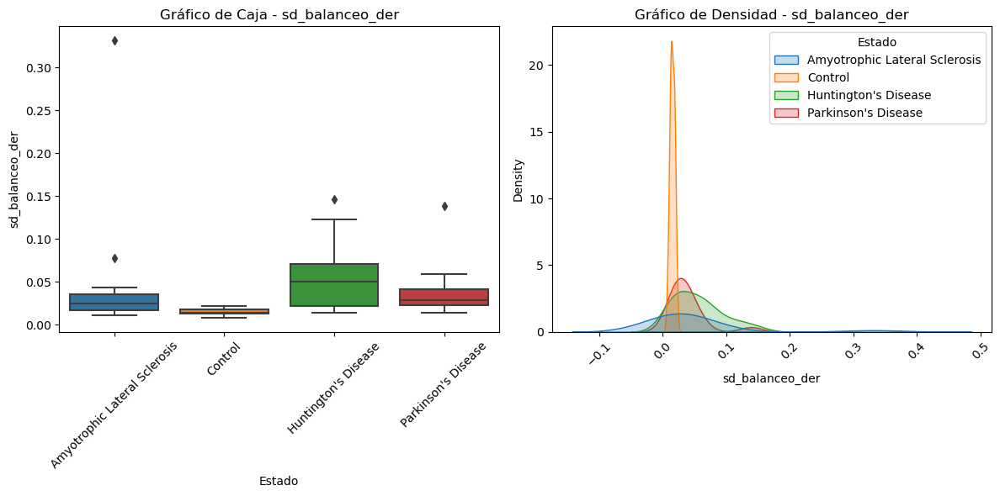

In [20]:
import seaborn as sns
from scipy import stats
from collections import Counter
warnings.filterwarnings('ignore')

# Funciones previamente definidas (filtro_hampel, calcular_entropia_permutacion, etc.)...

def generar_graficos(df, variables):
    """
    Genera gráficos de caja y de densidad para las variables especificadas.
    
    :param df: DataFrame que contiene los resultados de las variables.
    :param variables: Lista de variables para las que se generarán los gráficos.
    """
    for variable in variables:
        plt.figure(figsize=(12, 6))
        
        # Gráfico de caja (boxplot)
        plt.subplot(1, 2, 1)
        sns.boxplot(data=df, x='Estado', y=variable)
        plt.title(f'Gráfico de Caja - {variable}')
        plt.xticks(rotation=45)
        
        # Gráfico de densidad
        plt.subplot(1, 2, 2)
        sns.kdeplot(data=df, x=variable, hue='Estado', fill=True)
        plt.title(f'Gráfico de Densidad - {variable}')
        plt.xticks(rotation=45)
        
        # Mostrar el gráfico
        plt.tight_layout()
        plt.show()

# Variables de interés para los gráficos
variables_interes = [
    "ent_intervalo_izq", "ent_intervalo_der", "ent_balanceo_izq", "ent_balanceo_der",
    "cv_intervalo_izq", "cv_intervalo_der", "cv_balanceo_izq", "cv_balanceo_der",
    "sd_intervalo_izq", "sd_intervalo_der", "sd_balanceo_izq", "sd_balanceo_der"
]

# Ejecutar la función de generación de gráficos
generar_graficos(df_resultados, variables_interes)

# Comparaciones y pruebas estadisticas

El objetivo es evaluar si hay diferencias significativas en las características de la marcha entre sujetos sanos y aquellos que padecen ALS, Huntington y Parkinson. Esto se realiza a través de diversas pruebas estadísticas que ayudan a determinar la validez de las comparaciones. La función realizar_pruebas_estadisticas se aplica a un conjunto específico de datos (en este caso, comparaciones entre control y ALS, control y Huntington, Control y Parkinson), y los resultados se imprimen en un formato legible. Esto permite a los investigadores entender si las diferencias observadas son estadísticamente significativas y, por tanto, relevantes desde el punto de vista clínico.

# Grupo Control vs Grupo ALS

In [24]:
def realizar_pruebas_estadisticas(df_comparacion):
    resultados = {}

    # Listar las columnas de interés (evitar las primeras dos columnas que son 'Sujeto' y 'Estado')
    columnas = df_comparacion.columns[2:]
    
    # Separar los datos por grupo (Control y Amyotrophic Lateral Sclerosis)
    grupo_control = df_comparacion[df_comparacion['Estado'] == 'Control'].head(13)  # Limitar a 13 sujetos
    grupo_enfermo = df_comparacion[df_comparacion['Estado'] == 'Amyotrophic Lateral Sclerosis'].head(13)  # Limitar a 13 sujetos
    
    for col in columnas:
        # Obtener las señales para el control y el grupo enfermo
        control_data = grupo_control[col].astype(float)
        enfermo_data = grupo_enfermo[col].astype(float)
        
        if len(control_data) < 2 or len(enfermo_data) < 2:
            print(f"Columna: {col} no tiene suficientes datos para la comparación.")
            continue
        
        # Prueba de normalidad (Shapiro-Wilk)
        stat_control, p_control = shapiro(control_data)
        stat_enfermo, p_enfermo = shapiro(enfermo_data)
        es_normal_control = p_control > 0.05
        es_normal_enfermo = p_enfermo > 0.05
        
        # Prueba de homogeneidad de varianza (Levene)
        stat_levene, p_levene = levene(control_data, enfermo_data)
        var_igual = p_levene > 0.05
        
        # Elegir la prueba adecuada
        if es_normal_control and es_normal_enfermo and var_igual:
            # Si ambas distribuciones son normales y tienen varianzas iguales, realizar prueba t
            stat_t, p_t = ttest_ind(control_data, enfermo_data, equal_var=True)
            resultados[col] = {
                'Prueba': 't-test',
                'Estadístico': stat_t,
                'p-value': p_t,
                'Normalidad Control': p_control,
                'Normalidad Enfermo': p_enfermo,
                'Homogeneidad Varianzas': p_levene
            }
        else:
            # Si no se cumple normalidad o varianzas iguales, realizar prueba U de Mann-Whitney
            stat_u, p_u = mannwhitneyu(control_data, enfermo_data)
            resultados[col] = {
                'Prueba': 'Mann-Whitney U',
                'Estadístico': stat_u,
                'p-value': p_u,
                'Normalidad Control': p_control,
                'Normalidad Enfermo': p_enfermo,
                'Homogeneidad Varianzas': p_levene
            }
    
    return resultados

# Aplicar las pruebas estadísticas para la comparación Control vs ALS
resultados_ALS = realizar_pruebas_estadisticas(comparaciones['Control_vs_ALS'])

# Mostrar resultados de la comparación ALS
for col, res in resultados_ALS.items():
    print(f"Columna: {col}")
    print(f"Prueba realizada: {res['Prueba']}")
    print(f"Estadístico: {res['Estadístico']}")
    print(f"p-value: {res['p-value']}")
    print(f"Normalidad Control (p-value): {res['Normalidad Control']}")
    print(f"Normalidad Enfermo (p-value): {res['Normalidad Enfermo']}")
    print(f"Homogeneidad de varianzas (p-value): {res['Homogeneidad Varianzas']}")
    print("----------------------------")

Columna: ent_intervalo_izq
Prueba realizada: Mann-Whitney U
Estadístico: 82.0
p-value: 0.9183089345454835
Normalidad Control (p-value): 0.00780416870253563
Normalidad Enfermo (p-value): 7.3873195266429745e-06
Homogeneidad de varianzas (p-value): 0.4740701217800135
----------------------------
Columna: ent_intervalo_der
Prueba realizada: Mann-Whitney U
Estadístico: 103.0
p-value: 0.3559671197337311
Normalidad Control (p-value): 0.15117337507595474
Normalidad Enfermo (p-value): 1.0234799596120573e-05
Homogeneidad de varianzas (p-value): 0.16538463074427698
----------------------------
Columna: ent_balanceo_izq
Prueba realizada: Mann-Whitney U
Estadístico: 49.0
p-value: 0.07267412867689323
Normalidad Control (p-value): 0.19994492545922515
Normalidad Enfermo (p-value): 0.0017651062243370208
Homogeneidad de varianzas (p-value): 0.22342251126228926
----------------------------
Columna: ent_balanceo_der
Prueba realizada: Mann-Whitney U
Estadístico: 80.0
p-value: 0.8374719604535413
Normalidad 

# Grupo Control vs Grupo Huntington

In [25]:
def realizar_pruebas_estadisticas(df_comparacion):
    resultados = {}

    # Listar las columnas de interés (evitar las primeras dos columnas que son 'Sujeto' y 'Estado')
    columnas = df_comparacion.columns[2:]
    
    # Separar los datos por grupo (Control y Huntington)
    grupo_control = df_comparacion[df_comparacion['Estado'] == 'Control'].head(13)  # Limitar a 13 sujetos
    grupo_enfermo = df_comparacion[df_comparacion['Estado'] == 'Huntington\'s Disease'].head(13)  # Limitar a 13 sujetos
    
    for col in columnas:
        # Obtener las señales para el control y el grupo enfermo
        control_data = grupo_control[col].astype(float)
        enfermo_data = grupo_enfermo[col].astype(float)
        
        if len(control_data) < 2 or len(enfermo_data) < 2:
            print(f"Columna: {col} no tiene suficientes datos para la comparación.")
            continue
        
        # Prueba de normalidad (Shapiro-Wilk)
        stat_control, p_control = shapiro(control_data)
        stat_enfermo, p_enfermo = shapiro(enfermo_data)
        es_normal_control = p_control > 0.05
        es_normal_enfermo = p_enfermo > 0.05
        
        # Prueba de homogeneidad de varianza (Levene)
        stat_levene, p_levene = levene(control_data, enfermo_data)
        var_igual = p_levene > 0.05
        
        # Elegir la prueba adecuada
        if es_normal_control and es_normal_enfermo and var_igual:
            # Si ambas distribuciones son normales y tienen varianzas iguales, realizar prueba t
            stat_t, p_t = ttest_ind(control_data, enfermo_data, equal_var=True)
            resultados[col] = {
                'Prueba': 't-test',
                'Estadístico': stat_t,
                'p-value': p_t,
                'Normalidad Control': p_control,
                'Normalidad Enfermo': p_enfermo,
                'Homogeneidad Varianzas': p_levene
            }
        else:
            # Si no se cumple normalidad o varianzas iguales, realizar prueba U de Mann-Whitney
            stat_u, p_u = mannwhitneyu(control_data, enfermo_data)
            resultados[col] = {
                'Prueba': 'Mann-Whitney U',
                'Estadístico': stat_u,
                'p-value': p_u,
                'Normalidad Control': p_control,
                'Normalidad Enfermo': p_enfermo,
                'Homogeneidad Varianzas': p_levene
            }
    
    return resultados

# Aplicar las pruebas estadísticas para la comparación Control vs ALS
resultados_Huntington = realizar_pruebas_estadisticas(comparaciones['Control_vs_Huntington'])

# Mostrar resultados de la comparación ALS
for col, res in resultados_Huntington.items():
    print(f"Columna: {col}")
    print(f"Prueba realizada: {res['Prueba']}")
    print(f"Estadístico: {res['Estadístico']}")
    print(f"p-value: {res['p-value']}")
    print(f"Normalidad Control (p-value): {res['Normalidad Control']}")
    print(f"Normalidad Enfermo (p-value): {res['Normalidad Enfermo']}")
    print(f"Homogeneidad de varianzas (p-value): {res['Homogeneidad Varianzas']}")
    print("----------------------------")

Columna: ent_intervalo_izq
Prueba realizada: Mann-Whitney U
Estadístico: 56.0
p-value: 0.15103152823115532
Normalidad Control (p-value): 0.00780416870253563
Normalidad Enfermo (p-value): 0.001996974217996112
Homogeneidad de varianzas (p-value): 0.11350806636201927
----------------------------
Columna: ent_intervalo_der
Prueba realizada: Mann-Whitney U
Estadístico: 57.0
p-value: 0.16617010468287607
Normalidad Control (p-value): 0.15117337507595474
Normalidad Enfermo (p-value): 0.0005018321232762113
Homogeneidad de varianzas (p-value): 0.9864257810607231
----------------------------
Columna: ent_balanceo_izq
Prueba realizada: Mann-Whitney U
Estadístico: 44.0
p-value: 0.04023948736613397
Normalidad Control (p-value): 0.19994492545922515
Normalidad Enfermo (p-value): 0.0006192422790656166
Homogeneidad de varianzas (p-value): 0.1549038724659832
----------------------------
Columna: ent_balanceo_der
Prueba realizada: Mann-Whitney U
Estadístico: 46.0
p-value: 0.05132911710792309
Normalidad Co

# Grupo Control vs Grupo Parkinson

In [26]:
def realizar_pruebas_estadisticas(df_comparacion):
    resultados = {}

    # Listar las columnas de interés (evitar las primeras dos columnas que son 'Sujeto' y 'Estado')
    columnas = df_comparacion.columns[2:]
    
    # Separar los datos por grupo (Control y Parkinson)
    grupo_control = df_comparacion[df_comparacion['Estado'] == 'Control'].head(13)  # Limitar a 13 sujetos
    grupo_enfermo = df_comparacion[df_comparacion['Estado'] == 'Parkinson\'s Disease'].head(13)  # Limitar a 13 sujetos
    
    for col in columnas:
        # Obtener las señales para el control y el grupo enfermo
        control_data = grupo_control[col].astype(float)
        enfermo_data = grupo_enfermo[col].astype(float)
        
        if len(control_data) < 2 or len(enfermo_data) < 2:
            print(f"Columna: {col} no tiene suficientes datos para la comparación.")
            continue
        
        # Prueba de normalidad (Shapiro-Wilk)
        stat_control, p_control = shapiro(control_data)
        stat_enfermo, p_enfermo = shapiro(enfermo_data)
        es_normal_control = p_control > 0.05
        es_normal_enfermo = p_enfermo > 0.05
        
        # Prueba de homogeneidad de varianza (Levene)
        stat_levene, p_levene = levene(control_data, enfermo_data)
        var_igual = p_levene > 0.05
        
        # Elegir la prueba adecuada
        if es_normal_control and es_normal_enfermo and var_igual:
            # Si ambas distribuciones son normales y tienen varianzas iguales, realizar prueba t
            stat_t, p_t = ttest_ind(control_data, enfermo_data, equal_var=True)
            resultados[col] = {
                'Prueba': 't-test',
                'Estadístico': stat_t,
                'p-value': p_t,
                'Normalidad Control': p_control,
                'Normalidad Enfermo': p_enfermo,
                'Homogeneidad Varianzas': p_levene
            }
        else:
            # Si no se cumple normalidad o varianzas iguales, realizar prueba U de Mann-Whitney
            stat_u, p_u = mannwhitneyu(control_data, enfermo_data)
            resultados[col] = {
                'Prueba': 'Mann-Whitney U',
                'Estadístico': stat_u,
                'p-value': p_u,
                'Normalidad Control': p_control,
                'Normalidad Enfermo': p_enfermo,
                'Homogeneidad Varianzas': p_levene
            }
    
    return resultados

# Aplicar las pruebas estadísticas para la comparación Control vs ALS
resultados_Parkinson = realizar_pruebas_estadisticas(comparaciones['Control_vs_Parkinson'])

# Mostrar resultados de la comparación ALS
for col, res in resultados_Parkinson.items():
    print(f"Columna: {col}")
    print(f"Prueba realizada: {res['Prueba']}")
    print(f"Estadístico: {res['Estadístico']}")
    print(f"p-value: {res['p-value']}")
    print(f"Normalidad Control (p-value): {res['Normalidad Control']}")
    print(f"Normalidad Enfermo (p-value): {res['Normalidad Enfermo']}")
    print(f"Homogeneidad de varianzas (p-value): {res['Homogeneidad Varianzas']}")
    print("----------------------------")

Columna: ent_intervalo_izq
Prueba realizada: Mann-Whitney U
Estadístico: 74.0
p-value: 0.6080768794659228
Normalidad Control (p-value): 0.00780416870253563
Normalidad Enfermo (p-value): 0.024538297951934563
Homogeneidad de varianzas (p-value): 0.2584411744130034
----------------------------
Columna: ent_intervalo_der
Prueba realizada: Mann-Whitney U
Estadístico: 83.0
p-value: 0.9591007702858605
Normalidad Control (p-value): 0.15117337507595474
Normalidad Enfermo (p-value): 0.007635085112036249
Homogeneidad de varianzas (p-value): 0.0649158860426207
----------------------------
Columna: ent_balanceo_izq
Prueba realizada: t-test
Estadístico: -2.0997533125379224
p-value: 0.04644515667571262
Normalidad Control (p-value): 0.19994492545922515
Normalidad Enfermo (p-value): 0.46285788915512693
Homogeneidad de varianzas (p-value): 0.07056058950226324
----------------------------
Columna: ent_balanceo_der
Prueba realizada: Mann-Whitney U
Estadístico: 56.0
p-value: 0.15103152823115532
Normalidad 